In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
#from google.colab import drive
#drive.mount('/content/drive')

In [3]:
import pandas as pd
import numpy as np
#import os
#os.chdir('/content/drive/My Drive/MONOGRAFIA')

A base carregada contém 24 horas de amostras de 20 sensores de processo (pressão, vazão, temperatura, nível, abertura de válvulas), com amostras realizadas a cada 60 segundos. Resulta, assim, um total de 24 x 60 = 1440 registros para cada dia carregado.

A listagem de cada evento, como apresentado abaixo, indica o início e fim de cada um dos períodos relevantes ao evento: período de normalidade prévio, período de perturbação do processo, chamado de 1º indício, período de início de degradação, chamado de pré-cavitação, e o período de cavitação em si.

Dessa forma, considerou-se como base de treino do algoritmo os eventos de 25/04, 30/04, 02/05, 06/05, 14/05, 28/05, 03/06, 27/06 e 09/10, sendo o evento de 09/10 utilizado como teste.

In [4]:
base_completa = pd.read_csv('base_completa_v2.csv',sep=";")

In [5]:
base_completa.columns

Index(['TIMESTAMP', 'var1', 'var2', 'var3', 'var4', 'var5', 'var6', 'var7',
       'var8', 'var9', 'var10', 'var11', 'var12', 'var13', 'var14', 'var15',
       'var16', 'var17', 'var18', 'var19', 'var20'],
      dtype='object')

In [7]:
#TIMESTAMP dos eventos - Inicio NORMAL, Fim NORMAL, Inicio IND, Fim IND, Início PRE, Fim PRE, Início CAV, Fim CAV
evento_01 = ['2020-04-25 04:45:50','2020-04-25 05:07:30','2020-04-25 05:07:40','2020-04-25 05:20:20','2020-04-25 05:20:30','2020-04-25 05:24:30','2020-04-25 05:24:40','2020-04-25 05:25:10']
evento_02 = ['2020-04-30 21:05:30','2020-04-30 21:28:20','2020-04-30 21:28:30','2020-04-30 21:45:40','2020-04-30 21:45:50','2020-04-30 21:47:40','2020-04-30 21:47:50','2020-04-30 21:49:40']
evento_03 = ['2020-05-02 03:54:10','2020-05-02 04:45:50','2020-05-02 04:46:00','2020-05-02 05:33:30','2020-05-02 05:33:40','2020-05-02 05:35:10','2020-05-02 05:35:20','2020-05-02 05:35:58']
evento_04a = ['2020-05-06 03:52:50','2020-05-06 05:12:50','2020-05-06 05:13:00','2020-05-06 06:03:20','2020-05-06 06:03:30','2020-05-06 06:05:20','2020-05-06 06:05:30','2020-05-06 06:05:50']
#evento_04b = ['','','2020-05-06 06:49:00','2020-05-06 06:54:10','2020-05-06 06:54:20','2020-05-06 06:55:40','2020-05-06 06:55:50','2020-05-06 06:56:10']
#evento_04c = ['','','2020-05-06 08:27:00','2020-05-06 08:33:20','2020-05-06 08:33:30','2020-05-06 08:38:10','2020-05-06 08:38:20','2020-05-06 08:39:00']
evento_05 = ['2020-05-14 17:32:30','2020-05-14 18:03:00','2020-05-14 18:03:10','2020-05-14 18:27:40','2020-05-14 18:27:50','2020-05-14 18:29:40','2020-05-14 18:29:50','2020-05-14 18:31:50']
evento_06 = ['2020-05-28 13:52:50','2020-05-28 14:00:40','2020-05-28 14:00:50','2020-05-28 14:04:50','2020-05-28 14:05:00','2020-05-28 14:06:10','2020-05-28 14:06:20','2020-05-28 14:07:20']
evento_07 = ['2020-06-03 00:45:50','2020-06-03 01:12:00','2020-06-03 01:12:10','2020-06-03 01:33:40','2020-06-03 01:33:50','2020-06-03 01:35:30','2020-06-03 01:35:40','2020-06-03 01:36:30']
evento_08 = ['2020-06-27 14:52:50','2020-06-27 15:16:10','2020-06-27 15:16:20','2020-06-27 15:26:20','2020-06-27 15:26:30','2020-06-27 15:32:40','2020-06-27 15:32:50','2020-06-27 15:33:40']
evento_09 = ['2020-10-09 23:05:20','2020-10-09 23:23:50','2020-10-09 23:24:00','2020-10-09 23:38:40','2020-10-09 23:38:50','2020-10-09 23:40:10','2020-10-09 23:40:20','2020-10-09 23:41:10']

lista_eventos = [evento_01,evento_02,evento_03,evento_04a,evento_05,evento_06,evento_07,evento_08,evento_09]

base_completa = base_completa.set_index('TIMESTAMP')

base_treino = []
for i in [0,1,2,3,4,5,6,7]:
  base_treino.append(base_completa.loc[lista_eventos[i][0]:lista_eventos[i][7]])

for i in [0,1,2,3,4,5,6,7]:
  base_treino[i]['LABEL'] = ""

for i in [0,1,2,3,4,5,6,7]:
    base_treino[i].loc[lista_eventos[i][0]:lista_eventos[i][1]]['LABEL'] = 'NORMAL'
    base_treino[i].loc[lista_eventos[i][2]:lista_eventos[i][3]]['LABEL'] = 'INDICIO'
    base_treino[i].loc[lista_eventos[i][4]:lista_eventos[i][5]]['LABEL'] = 'PRÉ-CAVITAÇÃO'
    base_treino[i].loc[lista_eventos[i][6]:lista_eventos[i][7]]['LABEL'] = 'CAVITAÇÃO'

base_teste = base_completa.loc[lista_eventos[8][0]:lista_eventos[8][7]]
base_teste['LABEL'] = ""
base_teste.loc[lista_eventos[8][0]:lista_eventos[8][1]]['LABEL'] = 'NORMAL'
base_teste.loc[lista_eventos[8][2]:lista_eventos[8][3]]['LABEL'] = 'INDICIO'
base_teste.loc[lista_eventos[8][4]:lista_eventos[8][5]]['LABEL'] = 'PRÉ-CAVITAÇÃO'
base_teste.loc[lista_eventos[8][6]:lista_eventos[8][7]]['LABEL'] = 'CAVITAÇÃO'

In [8]:
print("Base treino:",len(base_treino))
print("Base teste:",len(base_teste))

Base treino: 8
Base teste: 36


Sabendo que dois instrumentos apresentaram problemas por um período extenso, removemos essas colunas da base e, posteriormente, removemos os NaNs:

In [9]:
for i in [0,1,2,3,4,5,6,7]:
    base_treino[i] = base_treino[i].drop(['var10','var11','var20'],axis=1)

base_teste = base_teste.drop(['var10','var11','var20'],axis=1)

for i in [0,1,2,3,4,5,6,7]:
    base_treino[i] = base_treino[i].dropna()

base_teste = base_teste.dropna()

In [10]:
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
flatui = ["#00b2a9", "#a8b400", "#e17000", "#fedf00"]
sns.set_palette(flatui)

Aqui criou-se uma função que transforma séries temporais em um conjunto de dados deslocados para utilização em treinamento supervisionado. Especifica-se a "quantidade" dos parâmetros de entrada (sequência t-n,...,t-1) e de previsão (t,t+1,...,t+n) através dos parâmetros n_in e n_out.

In [11]:
from pandas import DataFrame
from pandas import concat

def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    df = DataFrame(data)
    cols, names = list(), list()
    # sequência de entrada (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
        names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # sequência "prevista" (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
        if i == 0:
            names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
        else:
            names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
    # juntando tudo num agregador
    agg = concat(cols, axis=1)
    agg.columns = names
    # deleta NaNs
    if dropnan:
        agg.dropna(inplace=True)
    return agg

In [12]:
# Configuração de quantos períodos prévios e posteriores serão gerados para o treinamento
n_previous = 5
n_next = 1

1.   Normalização
2.   Series-to-supervised
3.   Concat

In [13]:
from sklearn.preprocessing import MinMaxScaler

features_treino = pd.DataFrame()
for i in [0,1,2,3,4,5,6,7]:
  features_treino = pd.concat([features_treino,base_treino[i].drop('LABEL',axis=1)])

features_teste = base_teste.drop('LABEL',axis=1)

scaler = MinMaxScaler(feature_range=(0,1))
scaler.fit(pd.concat([features_treino,features_teste]).values)

scaled = []
reframed = []

for i in [0,1,2,3,4,5,6,7]:
  values = base_treino[i].drop('LABEL',axis=1).values
  scaled_unit = scaler.transform(values)
  scaled.append(scaled_unit)
  reframed.append(series_to_supervised(scaled_unit,n_previous,n_next))

features_treino_reframed = pd.concat([reframed[0],reframed[1],reframed[2],reframed[3],reframed[4],reframed[5],reframed[6],reframed[7]])

scaled = scaler.transform(base_teste.drop('LABEL',axis=1).values)
features_teste_reframed = series_to_supervised(scaled, n_previous, n_next)

print(features_treino_reframed.tail())
print(features_teste_reframed.head())

    var1(t-5)  var2(t-5)  var3(t-5)  var4(t-5)  var5(t-5)  var6(t-5)  \
36        0.0   0.926010   0.924740   0.852608   0.298090   0.497647   
37        0.0   0.932174   0.930362   0.835776   0.287532   0.497463   
38        0.0   0.936663   0.933647   0.813423   0.277573   0.493005   
39        0.0   0.930335   0.927916   0.828575   0.237335   0.459381   
40        0.0   0.927739   0.925613   0.829983   0.199358   0.429506   

    var7(t-5)  var8(t-5)  var9(t-5)  var10(t-5)  ...   var8(t)   var9(t)  \
36   0.330361   0.354653   0.083303         1.0  ...  0.391101  0.077525   
37   0.325957   0.382261   0.088941         1.0  ...  0.433814  0.023357   
38   0.321265   0.334484   0.094587         1.0  ...  0.647781  0.001350   
39   0.282700   0.405099   0.110499         1.0  ...  0.801200  0.000000   
40   0.228776   0.366467   0.111629         1.0  ...  1.000000  0.000000   

    var10(t)  var11(t)  var12(t)  var13(t)  var14(t)  var15(t)  var16(t)  \
36       1.0       1.0  0.612578  

Remove os cinco primeiros labels de cada set

In [14]:
labels_treino_reframed = []
for i in [0,1,2,3,4,5,6,7]:
  labels_treino_reframed.append(base_treino[i].iloc[n_previous:].LABEL)

labels_treino = pd.concat([labels_treino_reframed[0],labels_treino_reframed[1],labels_treino_reframed[2],labels_treino_reframed[3],labels_treino_reframed[4],labels_treino_reframed[5],labels_treino_reframed[6],labels_treino_reframed[7]])

labels_teste = base_teste.iloc[n_previous:].LABEL

Faz-se o encoding dos labels para que possam ser previstos pela RN:

In [15]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder

values = np.array(labels_treino)
label_encoder = LabelEncoder()
integer_encoded = label_encoder.fit_transform(values)
enc = OneHotEncoder(sparse=False)
integer_encoded = integer_encoded.reshape(len(integer_encoded), 1)
labels_treino_enc = enc.fit_transform(integer_encoded)

values = np.array(labels_teste)
integer_encoded = label_encoder.transform(values)
integer_encoded = integer_encoded.reshape(len(integer_encoded), 1)
labels_teste_enc = enc.transform(integer_encoded)

In [16]:
print(labels_treino.tail())
print(labels_treino_enc[-5:])

TIMESTAMP
2020-06-27 15:29:00    PRÉ-CAVITAÇÃO
2020-06-27 15:30:00    PRÉ-CAVITAÇÃO
2020-06-27 15:31:00    PRÉ-CAVITAÇÃO
2020-06-27 15:32:00    PRÉ-CAVITAÇÃO
2020-06-27 15:33:00        CAVITAÇÃO
Name: LABEL, dtype: object
[[0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [1. 0. 0. 0.]]


In [17]:
print(labels_teste.tail())
print(labels_teste_enc[-5:])

TIMESTAMP
2020-10-09 23:37:00          INDICIO
2020-10-09 23:38:00          INDICIO
2020-10-09 23:39:00    PRÉ-CAVITAÇÃO
2020-10-09 23:40:00    PRÉ-CAVITAÇÃO
2020-10-09 23:41:00        CAVITAÇÃO
Name: LABEL, dtype: object
[[0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [1. 0. 0. 0.]]


In [18]:
# Caso seja necessários ajustes, mantém-se o mapeamento original
features_treino_reframed_adj = features_treino_reframed

In [19]:
# Caso seja necessários ajustes, mantém-se o mapeamento original
features_teste_reframed_adj = features_teste_reframed

In [20]:
# Checando shapes
print(features_treino_reframed_adj.values.shape)
print(labels_treino_enc.shape)
print(features_teste_reframed_adj.values.shape)
print(labels_teste_enc.shape)

(444, 102)
(444, 4)
(31, 102)
(31, 4)


Definindo as entradas e saídas de treino e teste, ajustando o formato para 3 dimensões

In [21]:
# Define X e y para treino e teste, ajustando o formato
n_mins = n_previous + n_next
n_features = len(features_treino.columns)
n_obs = n_mins * n_features
train_X, train_y = features_treino_reframed_adj.values,labels_treino_enc
test_X, test_y = features_teste_reframed_adj.values,labels_teste_enc
print(train_X.shape, len(train_X), train_y.shape)
# Ajusta formato da entrada para 3D [amostras, intervalos, features]
train_X = train_X.reshape((train_X.shape[0], n_mins, n_features))
test_X = test_X.reshape((test_X.shape[0], n_mins, n_features))
print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

(444, 102) 444 (444, 4)
(444, 6, 17) (444, 4) (31, 6, 17) (31, 4)


In [22]:
print(train_X.shape, train_y.shape)

(444, 6, 17) (444, 4)


In [23]:
from matplotlib import pyplot
from keras.models import Sequential
from keras.layers import Dense,LSTM,Dropout,Conv1D,MaxPooling1D,GlobalAveragePooling1D
from keras.metrics import AUC,CategoricalAccuracy
from keras.losses import CategoricalCrossentropy

Using TensorFlow backend.


In [24]:
n_batch = 64
n_training = 100
n_epochs = 3000
import time

1.1) Somente LSTM (1 camadas sem dropout)

In [ ]:
scores_lstm = []
models_lstm = []
stories_lstm = []
preds_lstm = []

for i in range(0,n_training):
    my_loss = CategoricalCrossentropy()
    my_metric = CategoricalAccuracy()
    start_time = time.time()
    print("Rodada número ",i)
    # design network
    model = Sequential()

    # first layer
    model.add(LSTM(units=64,input_shape=(train_X.shape[1], train_X.shape[2])))
    # output layer
    model.add(Dense(units=4,activation='softmax'))
    model.compile(loss=my_loss, optimizer='adam', metrics=[my_metric])
    # fit network
    history = model.fit(train_X, train_y, epochs=n_epochs, batch_size=n_batch,verbose=False, shuffle=True)
  
    stories_lstm.append(history)
    scores_lstm.append(history.history['categorical_accuracy'][-1])
    models_lstm.append(model)

    pyplot.plot(stories_lstm[i].history['categorical_accuracy'], label='acc')
    pyplot.plot(stories_lstm[i].history['loss'],label='loss')
    pyplot.legend()
    pyplot.show()

    # make a prediction
    yhat = models_lstm[i].predict(test_X)
    preds_lstm.append(yhat)

    pyplot.plot(np.array(labels_teste_enc[:,2])) #marca a queda da normalidade
    pyplot.plot(preds_lstm[i][:,0],label="cavitação")
    pyplot.plot(preds_lstm[i][:,1],label="indicio")
    pyplot.plot(preds_lstm[i][:,2],label="normal")
    pyplot.plot(preds_lstm[i][:,3],label="pré-cav")
    pyplot.legend()
    pyplot.show()
  
    print("--- %s segundos ---" % (time.time() - start_time))

1.2) Adicionando mais uma camada LSTM

In [ ]:
scores_lstm_2 = []
models_lstm_2 = []
stories_lstm_2 = []
preds_lstm_2 = []

for i in range(0,n_training):
    my_loss = CategoricalCrossentropy()
    my_metric = CategoricalAccuracy()
    start_time = time.time()
    print("Rodada número ",i)
    # design network
    model = Sequential()

    # first layer
    model.add(LSTM(units=64,return_sequences=True,input_shape=(train_X.shape[1], train_X.shape[2])))
    # second layer
    model.add(LSTM(units=64))
    # output layer
    model.add(Dense(units=4,activation='softmax'))
    model.compile(loss=my_loss, optimizer='adam', metrics=[my_metric])
    # fit network
    history = model.fit(train_X, train_y, epochs=n_epochs, batch_size=n_batch, verbose=False, shuffle=True)

    stories_lstm_2.append(history)
    scores_lstm_2.append(history.history['categorical_accuracy'][-1])
    models_lstm_2.append(model)

    pyplot.plot(stories_lstm_2[i].history['categorical_accuracy'], label='acc')
    pyplot.plot(stories_lstm_2[i].history['loss'],label='loss')
    pyplot.legend()
    pyplot.show()

    # make a prediction
    yhat = models_lstm_2[i].predict(test_X)
    preds_lstm_2.append(yhat)

    pyplot.plot(np.array(labels_teste_enc[:,2]))
    pyplot.plot(preds_lstm_2[i][:,0],label="cavitação")
    pyplot.plot(preds_lstm_2[i][:,1],label="indicio")
    pyplot.plot(preds_lstm_2[i][:,2],label="normal")
    pyplot.plot(preds_lstm_2[i][:,3],label="pré-cav")
    pyplot.legend()
    pyplot.show()
  
    print("--- %s segundos ---" % (time.time() - start_time))

2) Gera-se o modelo de CNN LSTM, aplicando convolução 1D

In [27]:
n_filters = 64
n_kernel = 6
n_pool = 3

In [ ]:
scores_cnn = []
models_cnn = []
stories_cnn = []
preds_cnn = []

for i in range(0,n_training):
    my_loss = CategoricalCrossentropy()
    my_metric = CategoricalAccuracy()
    start_time = time.time()
    print("Rodada número ",i)
    # design network
    model = Sequential()

    model.add(Conv1D(filters=n_filters, kernel_size=n_kernel, padding='same', activation='relu',input_shape=(train_X.shape[1], train_X.shape[2])))
    model.add(MaxPooling1D(pool_size=n_pool))

    # first layer
    model.add(LSTM(units=64))
    # output layer
    model.add(Dense(units=4,activation='softmax'))
    model.compile(loss=my_loss, optimizer='adam', metrics=[my_metric])
  
    # fit network
    history = model.fit(train_X, train_y, epochs=n_epochs, verbose=False, batch_size=n_batch, shuffle=True)
    stories_cnn.append(history)
    scores_cnn.append(history.history['categorical_accuracy'][-1])
    models_cnn.append(model)

    # plot history
    pyplot.plot(stories_cnn[i].history['categorical_accuracy'], label='acc')
    pyplot.plot(stories_cnn[i].history['loss'],label='loss')
    #pyplot.plot(scores)
    pyplot.legend()
    pyplot.show()

    # make a prediction
    yhat = models_cnn[i].predict(test_X)
    preds_cnn.append(yhat)

    pyplot.plot(np.array(labels_teste_enc[:,2]))
    pyplot.plot(preds_cnn[i][:,0],label="cavitação")
    pyplot.plot(preds_cnn[i][:,1],label="indicio")
    pyplot.plot(preds_cnn[i][:,2],label="normal")
    pyplot.plot(preds_cnn[i][:,3],label="pré-cav")
    pyplot.legend()
    pyplot.show()

    print("--- %s segundos ---" % (time.time() - start_time))

Os mesmos ensaios, agora com dropout = 0.2 entre camadas LSTM, pode ser visto no notebook adicional

In [29]:
test_full = base_completa
test_full = test_full.drop(['var10','var11','var20'],axis=1)
test_full = test_full.loc['2020-10-09 00:00:00':'2020-10-09 23:59:59']
test_full_scaled = scaler.transform(test_full.values)
test_full_series = series_to_supervised(test_full_scaled,n_previous,n_next)
test_full_series = test_full_series.values.reshape((1435, n_mins, n_features))

LSTM_ 0


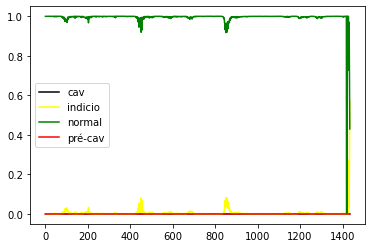

LSTM_ 1


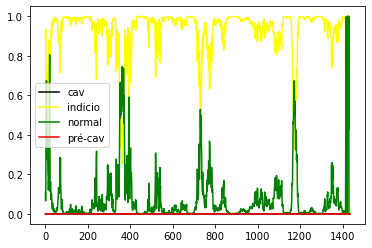

LSTM_ 2


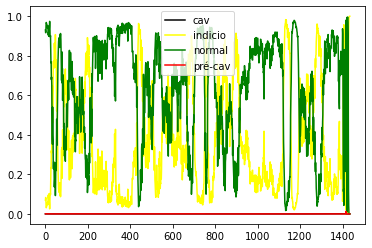

LSTM_ 3


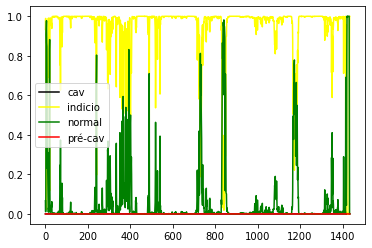

LSTM_ 4


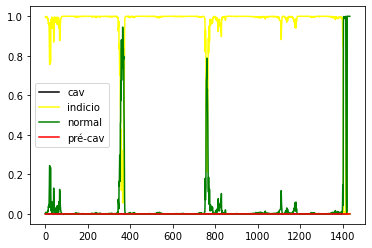

LSTM_ 5


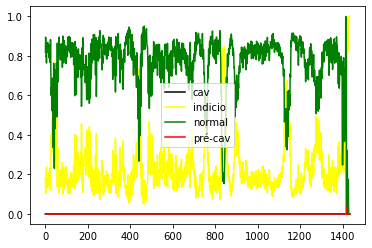

LSTM_ 6


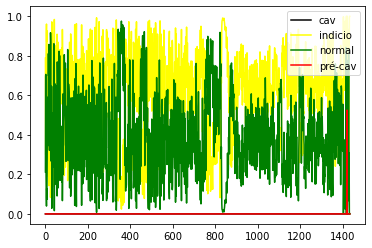

LSTM_ 7


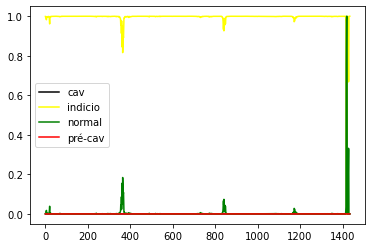

LSTM_ 8


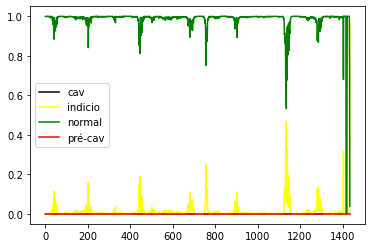

LSTM_ 9


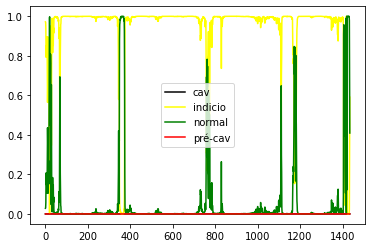

LSTM_ 10


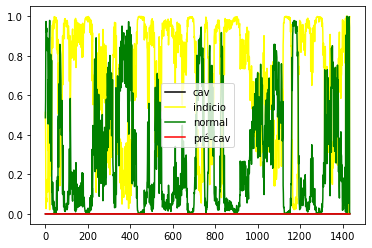

LSTM_ 11


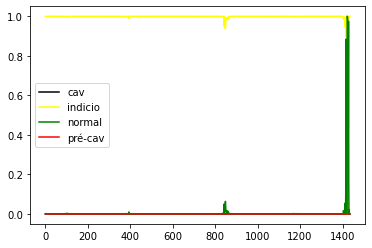

LSTM_ 12


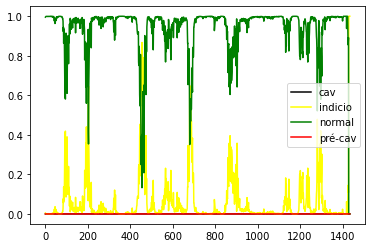

LSTM_ 13


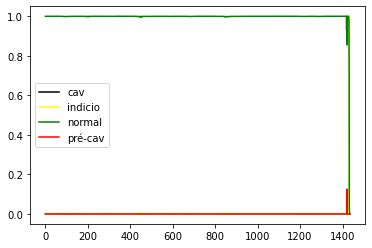

LSTM_ 14


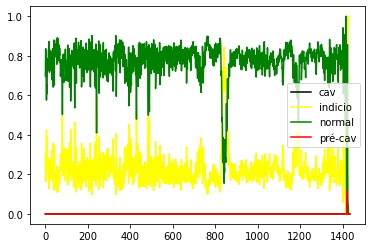

LSTM_ 15


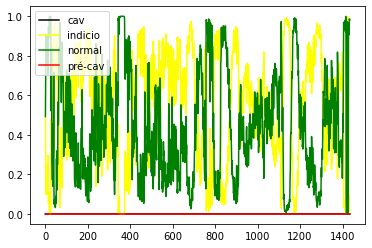

LSTM_ 16


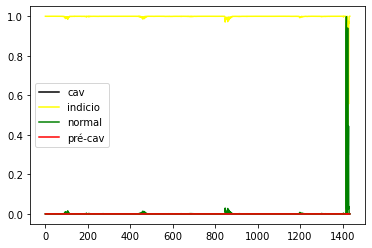

LSTM_ 17


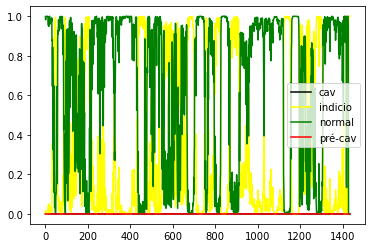

LSTM_ 18


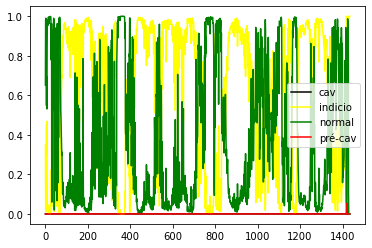

LSTM_ 19


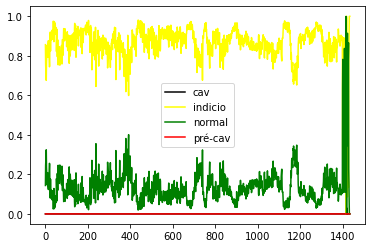

LSTM_ 20


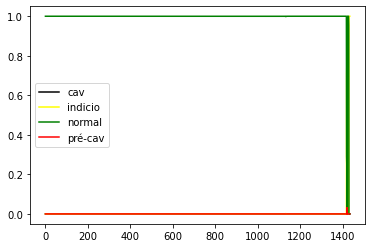

LSTM_ 21


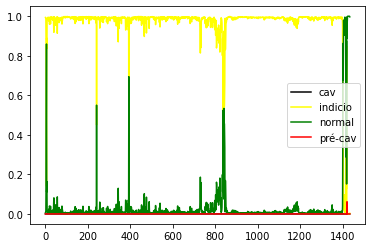

LSTM_ 22


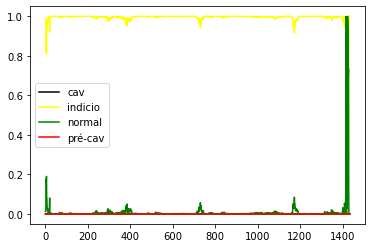

LSTM_ 23


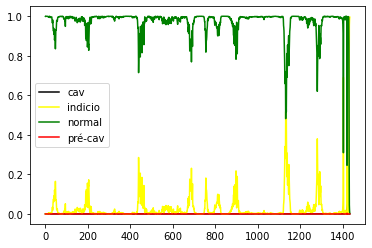

LSTM_ 24


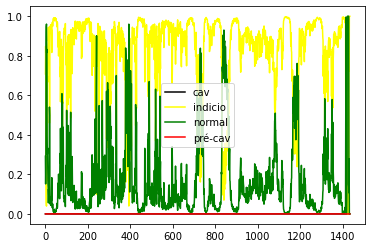

LSTM_ 25


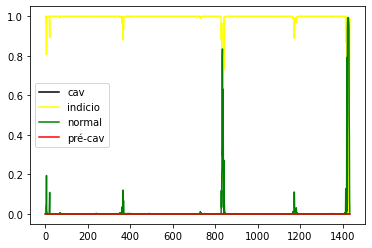

LSTM_ 26


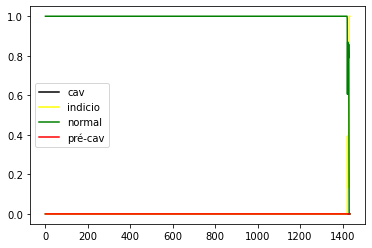

LSTM_ 27


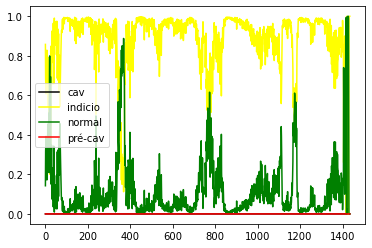

LSTM_ 28


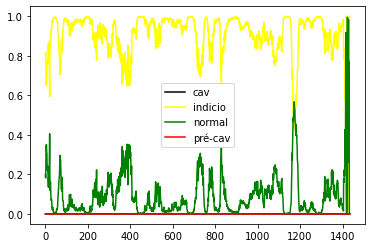

LSTM_ 29


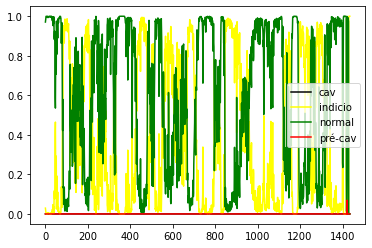

LSTM_ 30


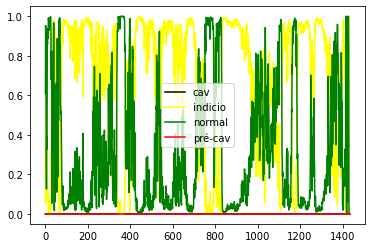

LSTM_ 31


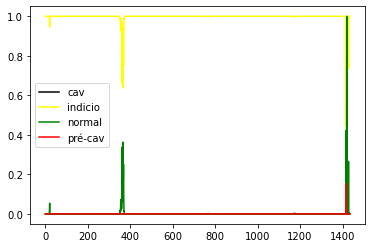

LSTM_ 32


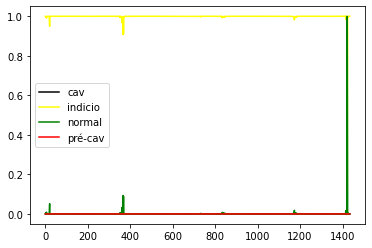

LSTM_ 33


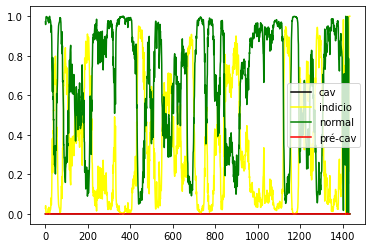

LSTM_ 34


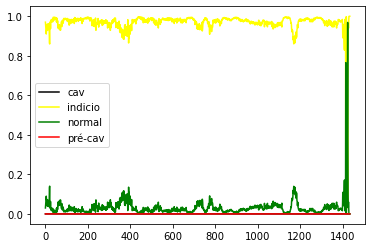

LSTM_ 35


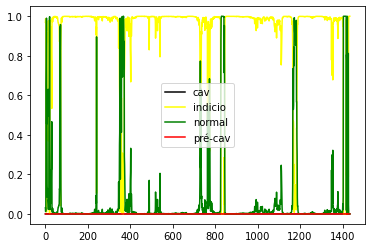

LSTM_ 36


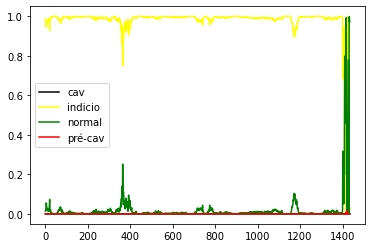

LSTM_ 37


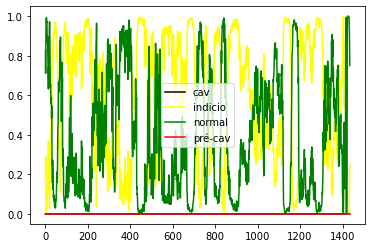

LSTM_ 38


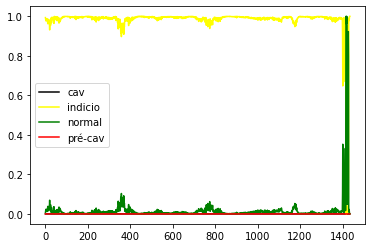

LSTM_ 39


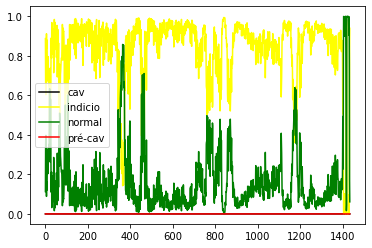

LSTM_ 40


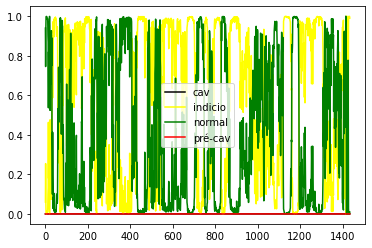

LSTM_ 41


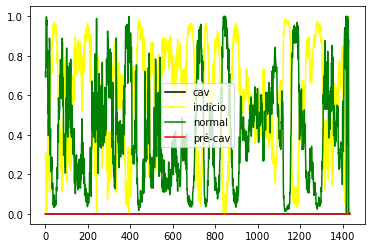

LSTM_ 42


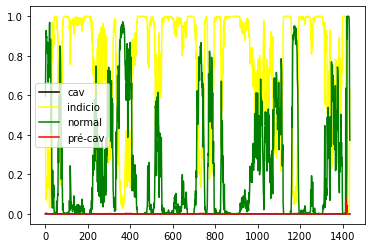

LSTM_ 43


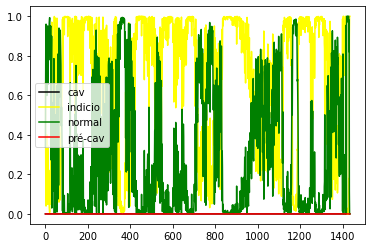

LSTM_ 44


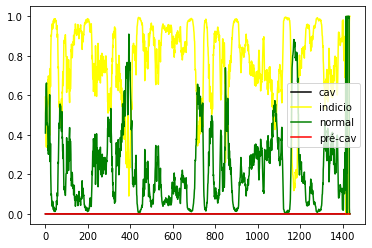

LSTM_ 45


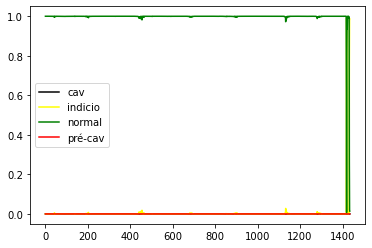

LSTM_ 46


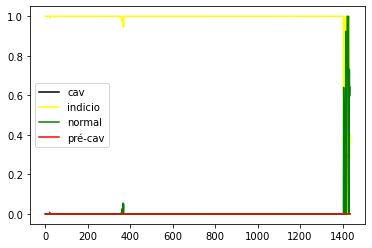

LSTM_ 47


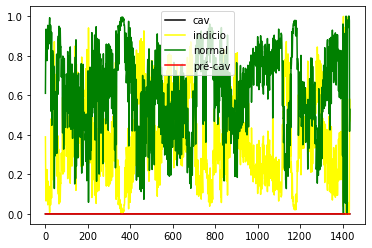

LSTM_ 48


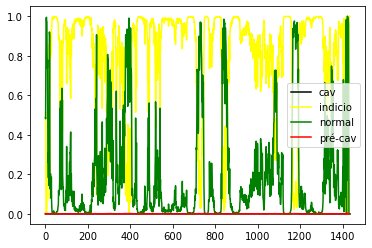

LSTM_ 49


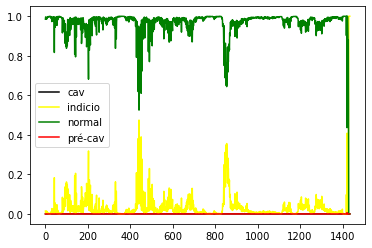

LSTM_ 50


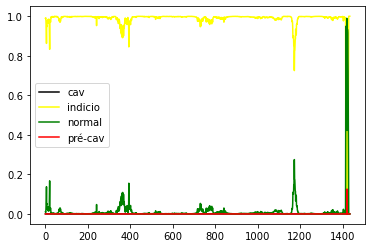

LSTM_ 51


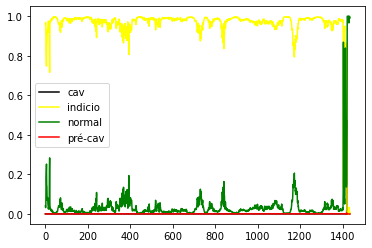

LSTM_ 52


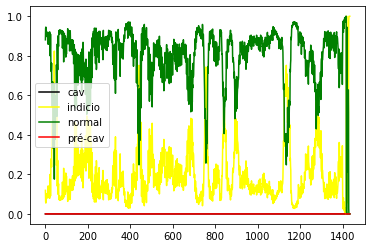

LSTM_ 53


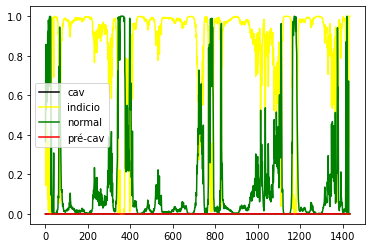

LSTM_ 54


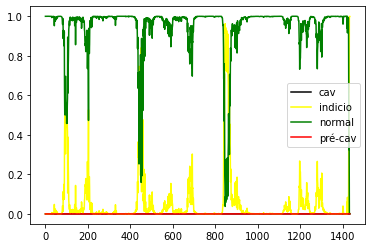

LSTM_ 55


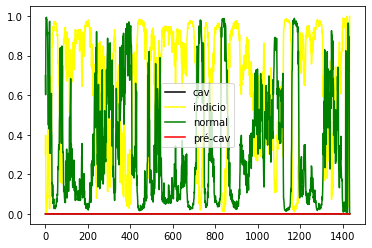

LSTM_ 56


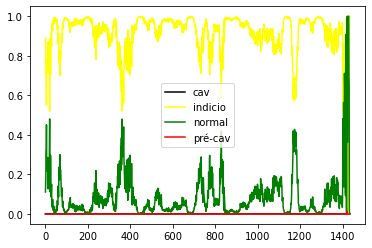

LSTM_ 57


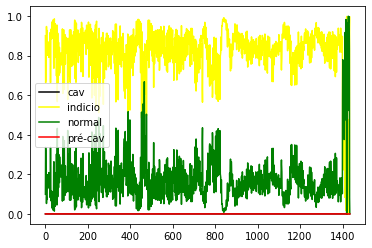

LSTM_ 58


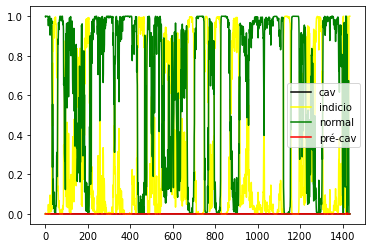

LSTM_ 59


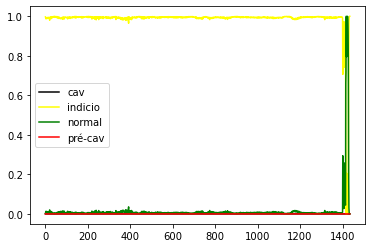

LSTM_ 60


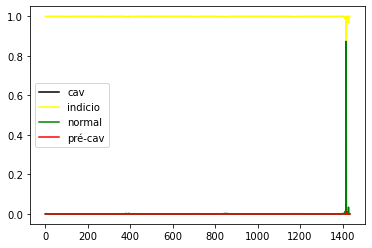

LSTM_ 61


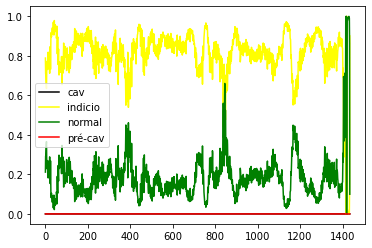

LSTM_ 62


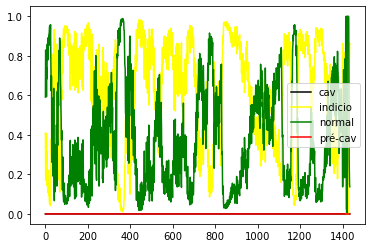

LSTM_ 63


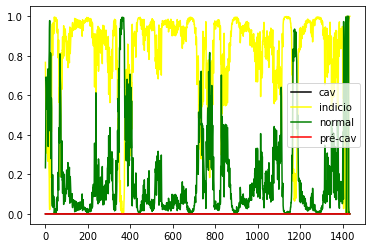

LSTM_ 64


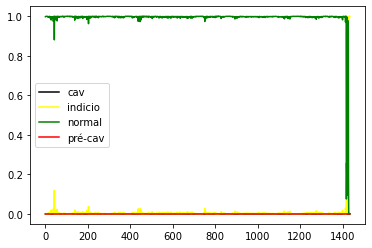

LSTM_ 65


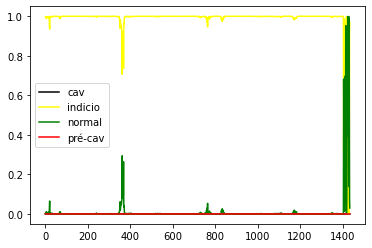

LSTM_ 66


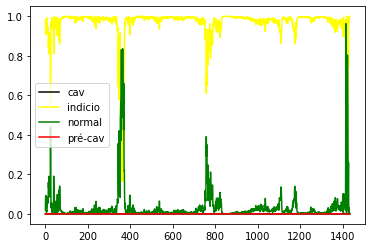

LSTM_ 67


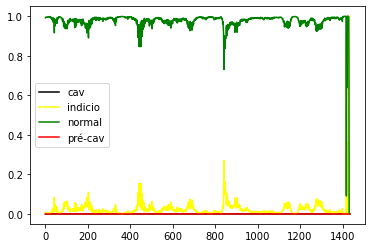

LSTM_ 68


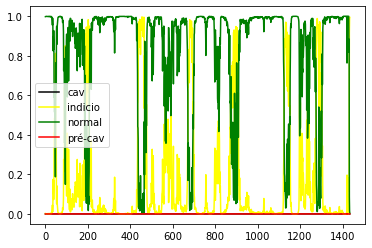

LSTM_ 69


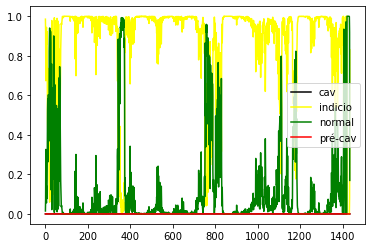

LSTM_ 70


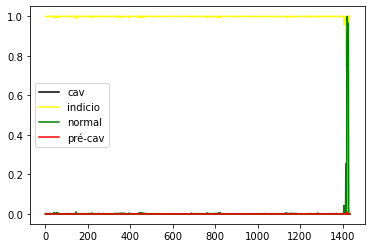

LSTM_ 71


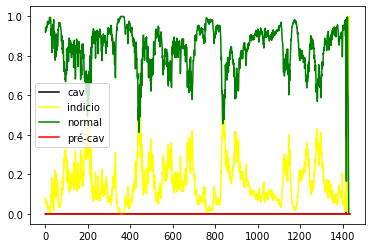

LSTM_ 72


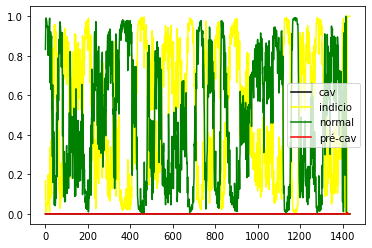

LSTM_ 73


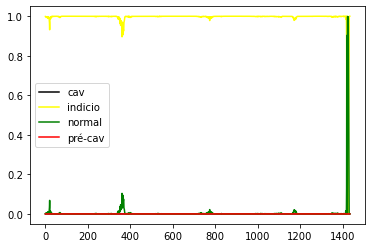

LSTM_ 74


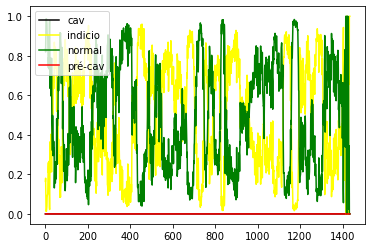

LSTM_ 75


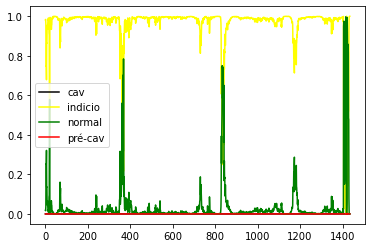

LSTM_ 76


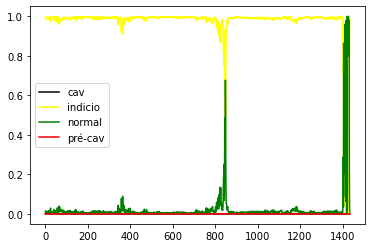

LSTM_ 77


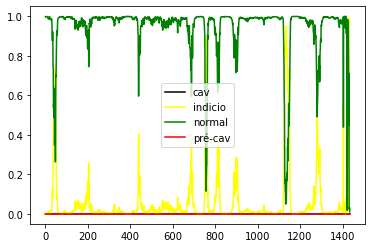

LSTM_ 78


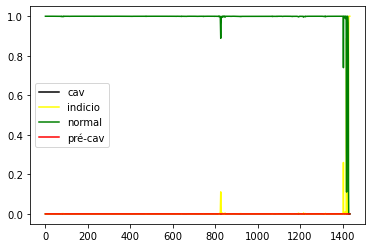

LSTM_ 79


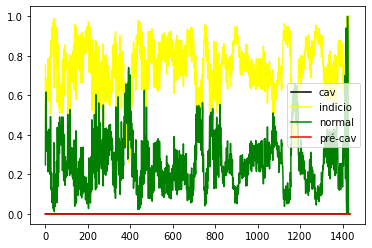

LSTM_ 80


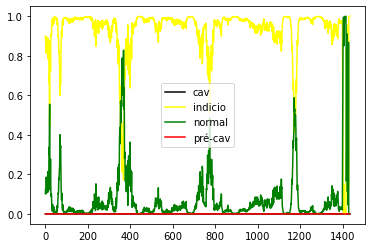

LSTM_ 81


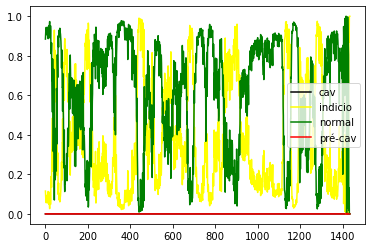

LSTM_ 82


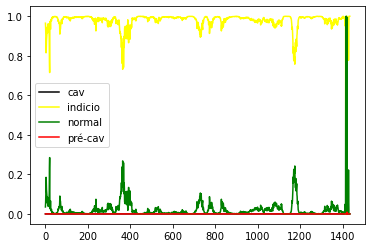

LSTM_ 83


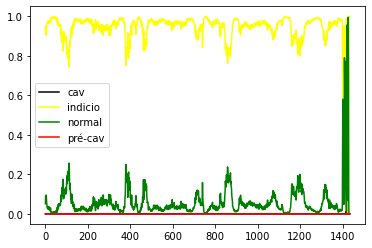

LSTM_ 84


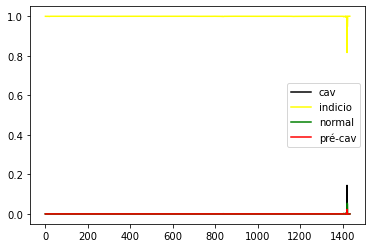

LSTM_ 85


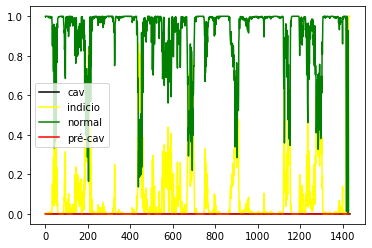

LSTM_ 86


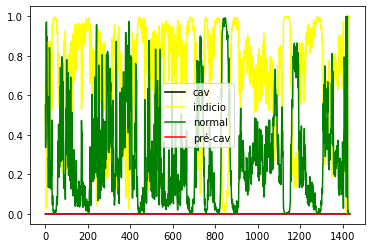

LSTM_ 87


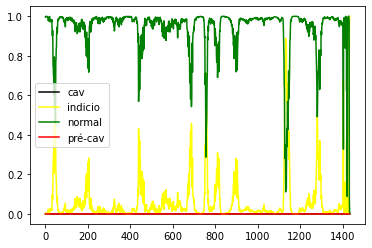

LSTM_ 88


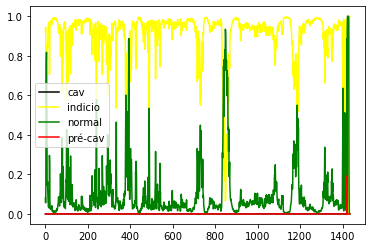

LSTM_ 89


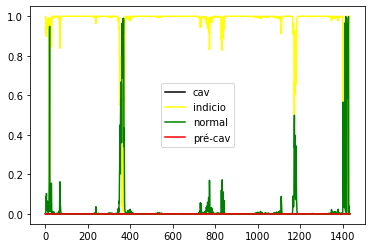

LSTM_ 90


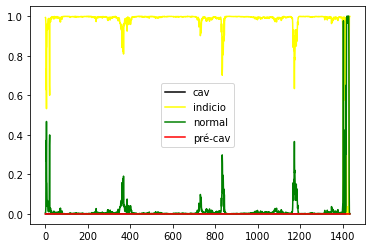

LSTM_ 91


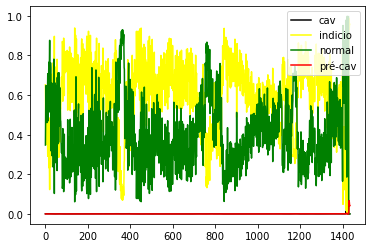

LSTM_ 92


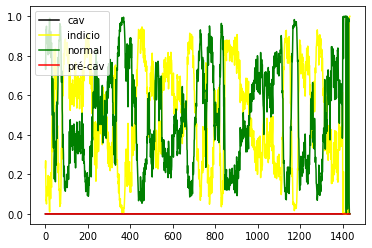

LSTM_ 93


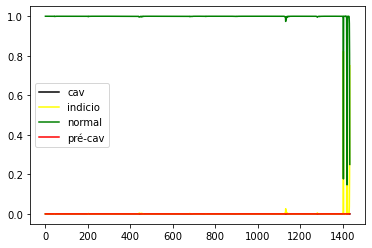

LSTM_ 94


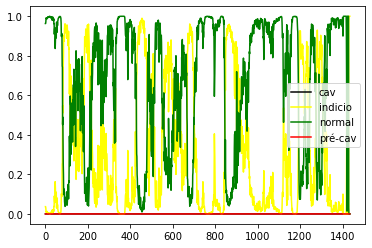

LSTM_ 95


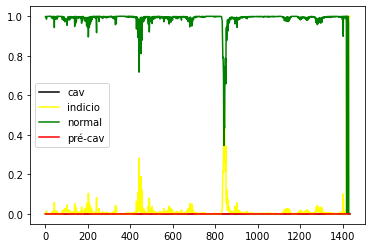

LSTM_ 96


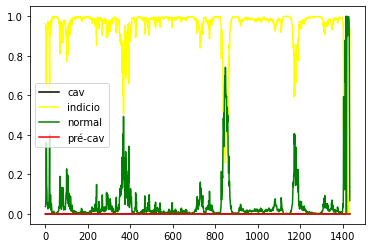

LSTM_ 97


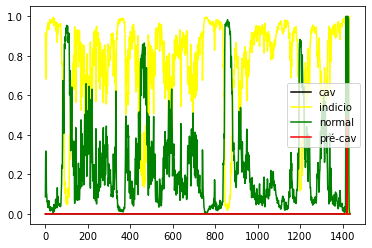

LSTM_ 98


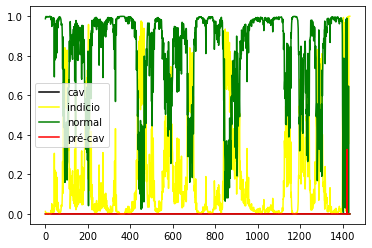

LSTM_ 99


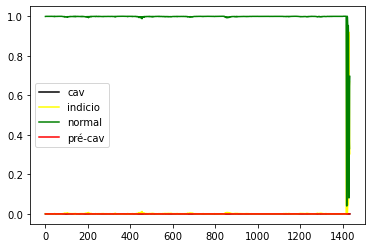

LSTM_2_ 0


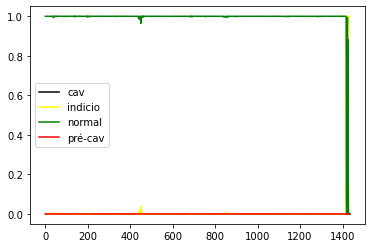

LSTM_2_ 1


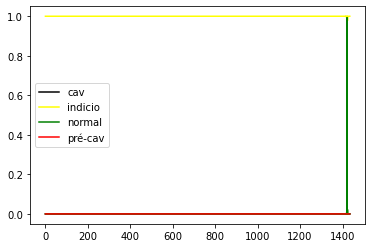

LSTM_2_ 2


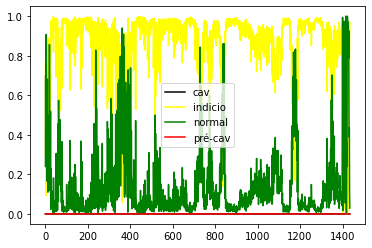

LSTM_2_ 3


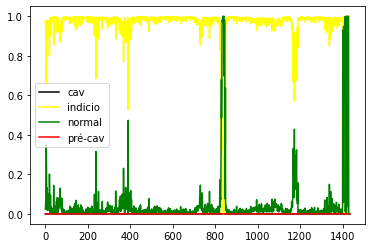

LSTM_2_ 4


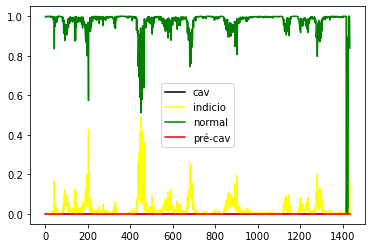

LSTM_2_ 5


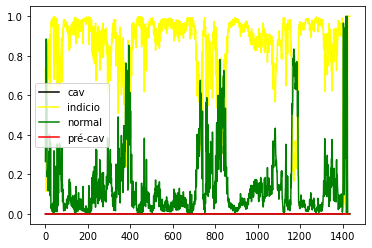

LSTM_2_ 6


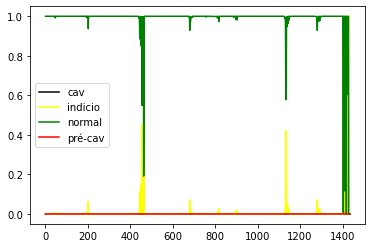

LSTM_2_ 7


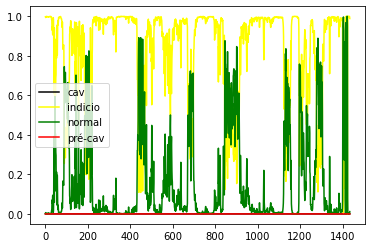

LSTM_2_ 8


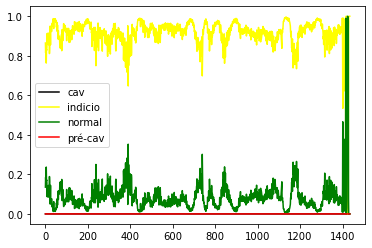

LSTM_2_ 9


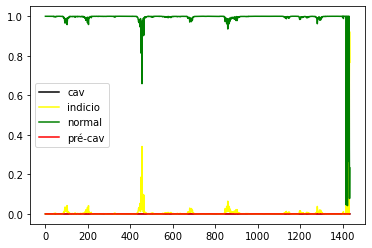

LSTM_2_ 10


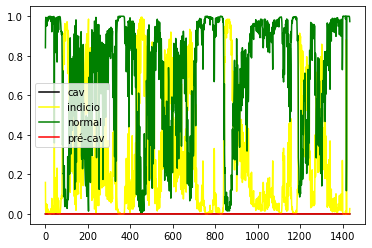

LSTM_2_ 11


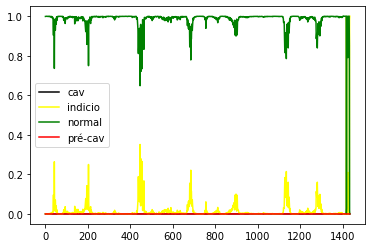

LSTM_2_ 12


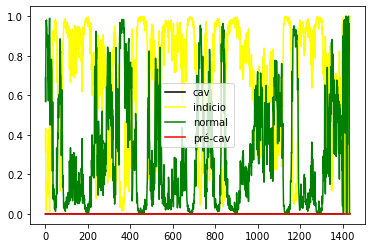

LSTM_2_ 13


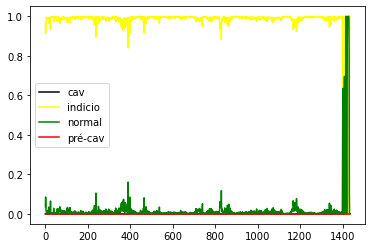

LSTM_2_ 14


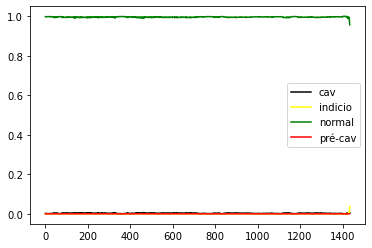

LSTM_2_ 15


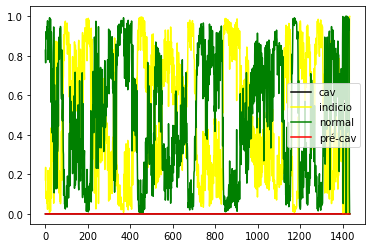

LSTM_2_ 16


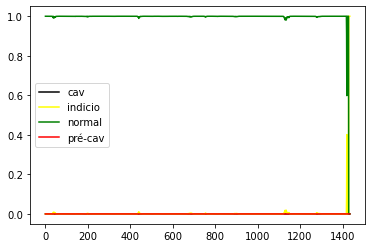

LSTM_2_ 17


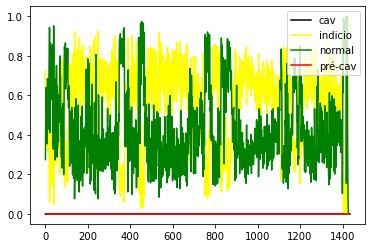

LSTM_2_ 18


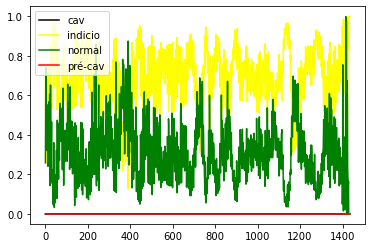

LSTM_2_ 19


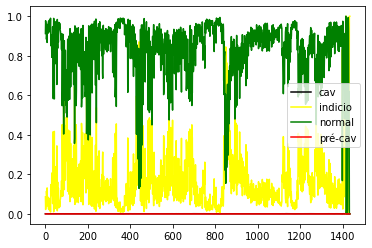

LSTM_2_ 20


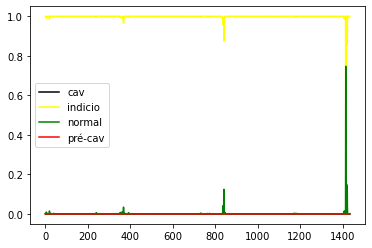

LSTM_2_ 21


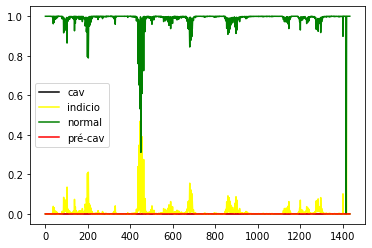

LSTM_2_ 22


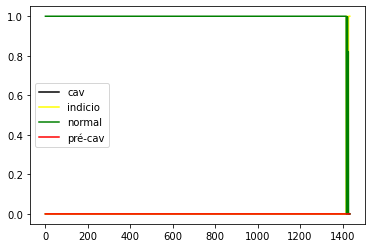

LSTM_2_ 23


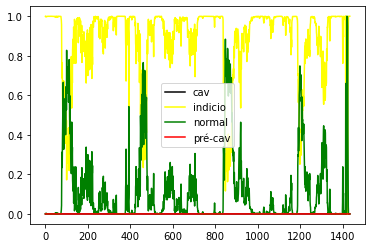

LSTM_2_ 24


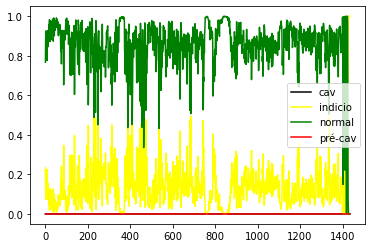

LSTM_2_ 25


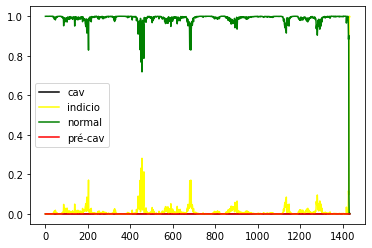

LSTM_2_ 26


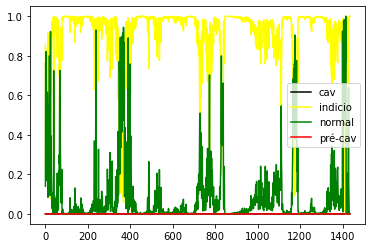

LSTM_2_ 27


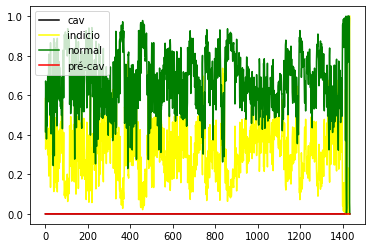

LSTM_2_ 28


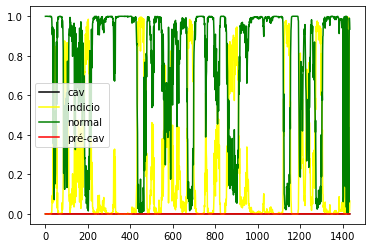

LSTM_2_ 29


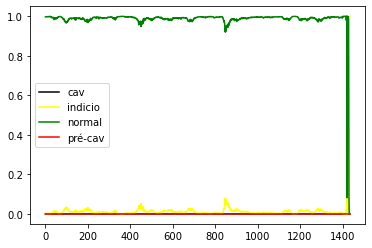

LSTM_2_ 30


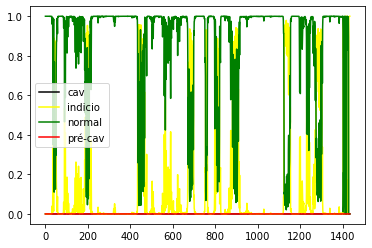

LSTM_2_ 31


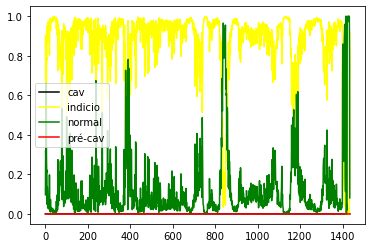

LSTM_2_ 32


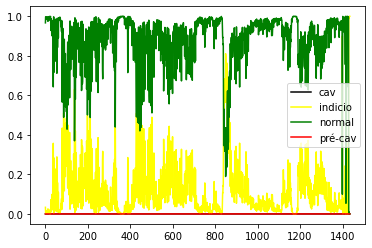

LSTM_2_ 33


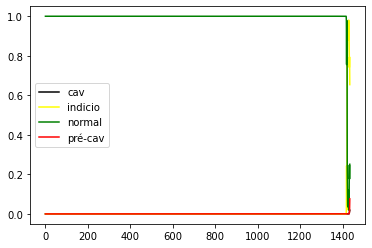

LSTM_2_ 34


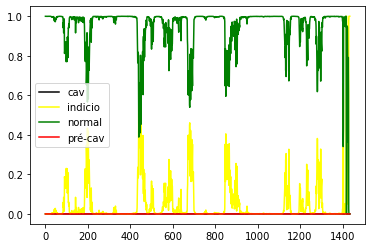

LSTM_2_ 35


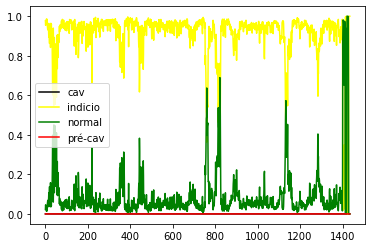

LSTM_2_ 36


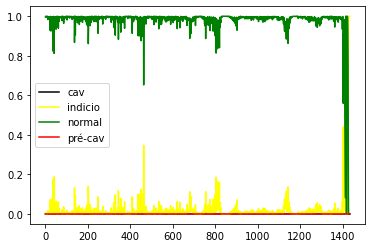

LSTM_2_ 37


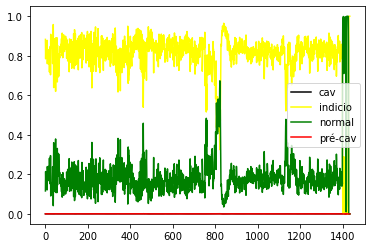

LSTM_2_ 38


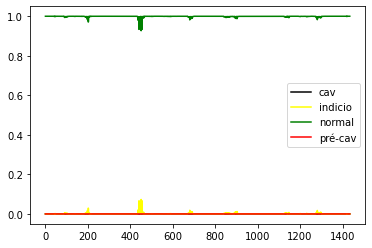

LSTM_2_ 39


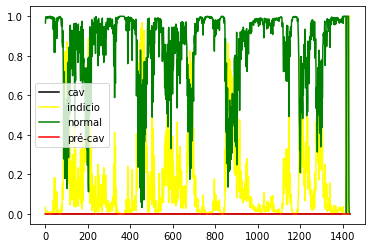

LSTM_2_ 40


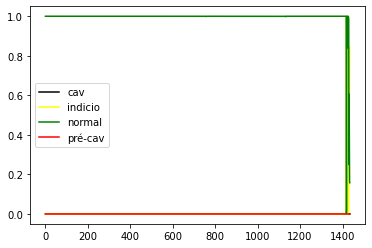

LSTM_2_ 41


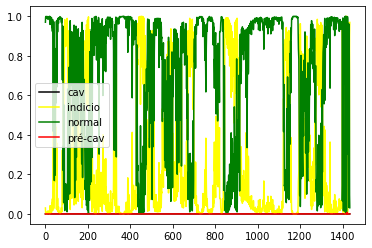

LSTM_2_ 42


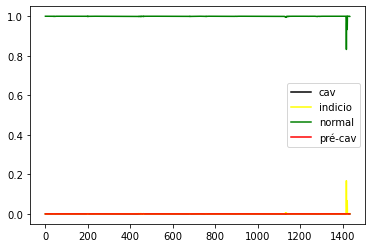

LSTM_2_ 43


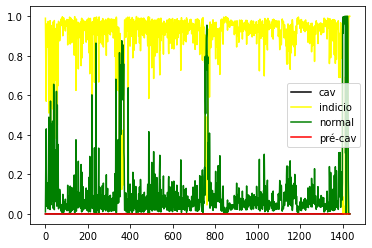

LSTM_2_ 44


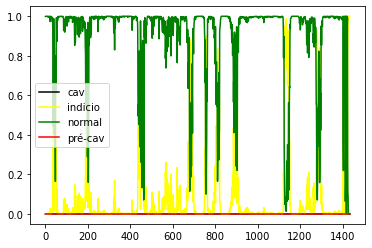

LSTM_2_ 45


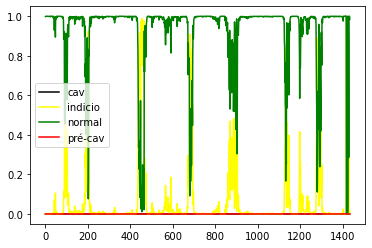

LSTM_2_ 46


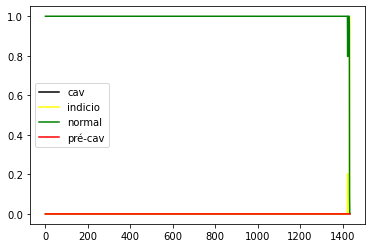

LSTM_2_ 47


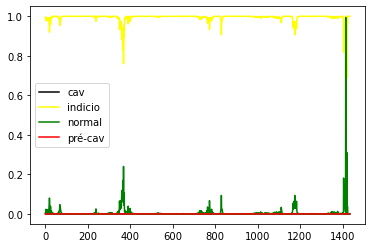

LSTM_2_ 48


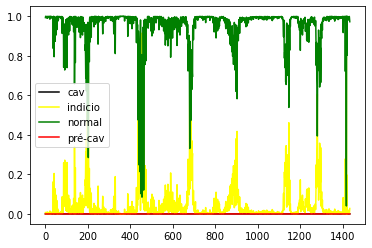

LSTM_2_ 49


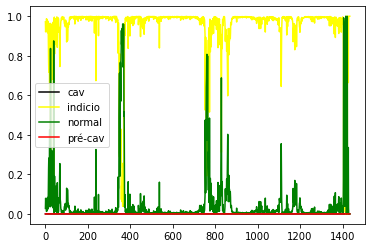

LSTM_2_ 50


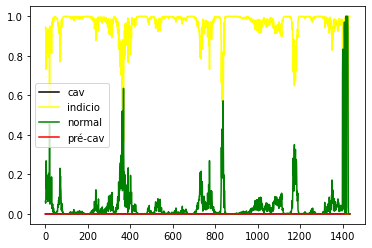

LSTM_2_ 51


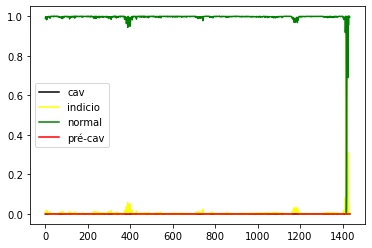

LSTM_2_ 52


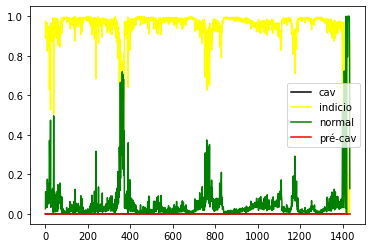

LSTM_2_ 53


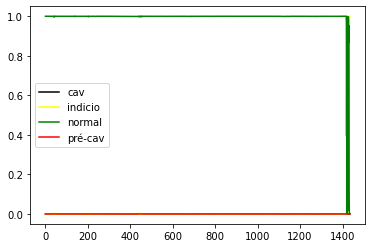

LSTM_2_ 54


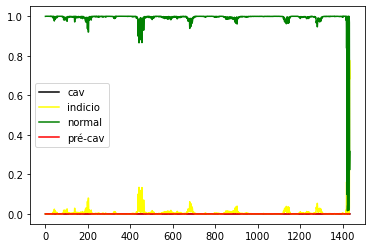

LSTM_2_ 55


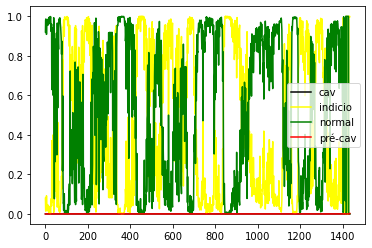

LSTM_2_ 56


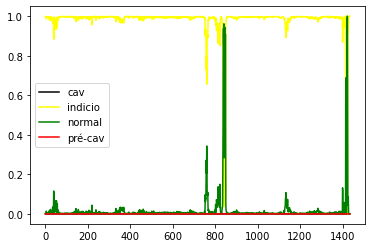

LSTM_2_ 57


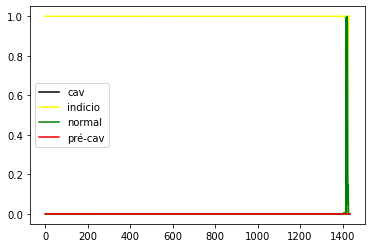

LSTM_2_ 58


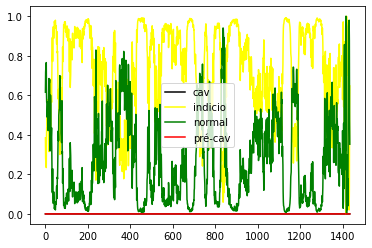

LSTM_2_ 59


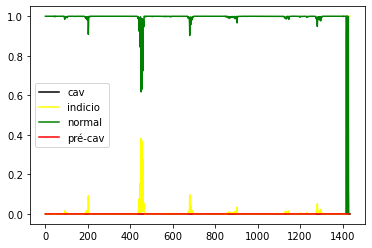

LSTM_2_ 60


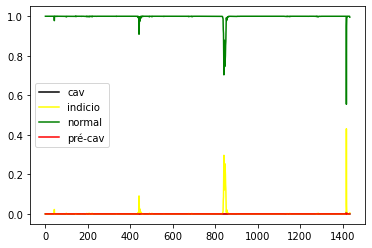

LSTM_2_ 61


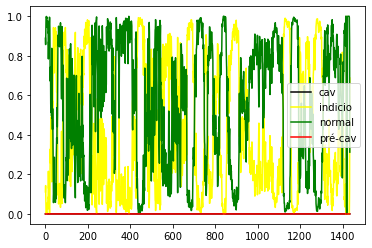

LSTM_2_ 62


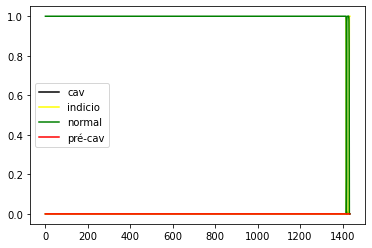

LSTM_2_ 63


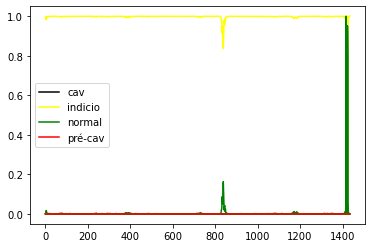

LSTM_2_ 64


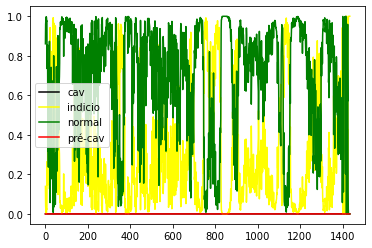

LSTM_2_ 65


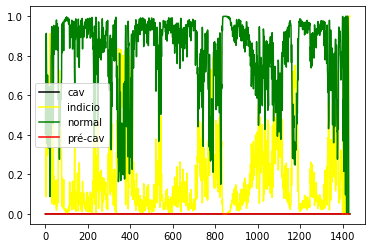

LSTM_2_ 66


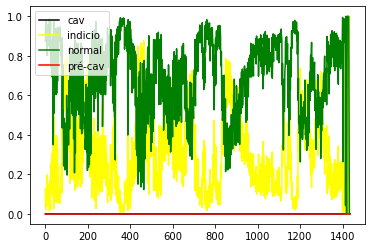

LSTM_2_ 67


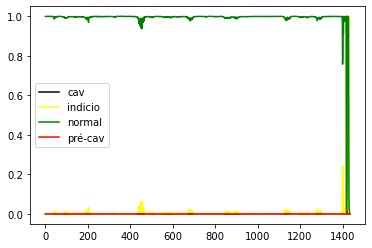

LSTM_2_ 68


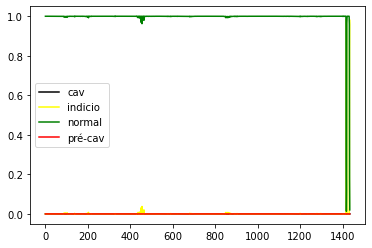

LSTM_2_ 69


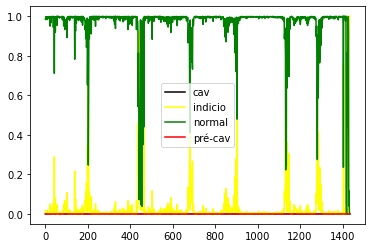

LSTM_2_ 70


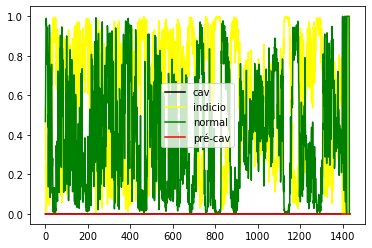

LSTM_2_ 71


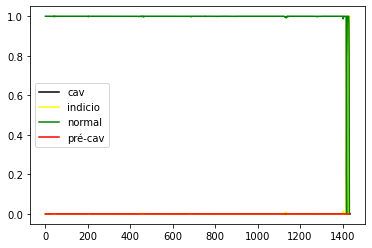

LSTM_2_ 72


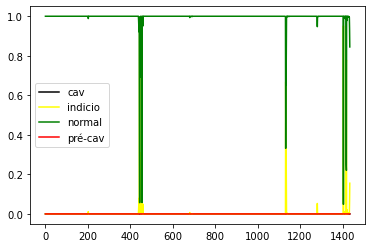

LSTM_2_ 73


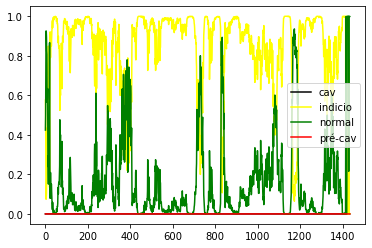

LSTM_2_ 74


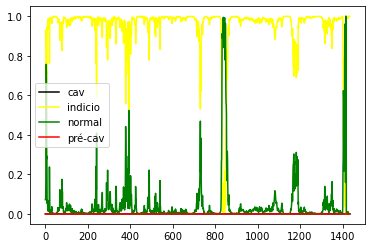

LSTM_2_ 75


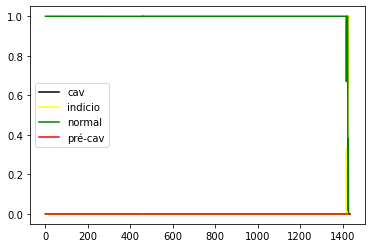

LSTM_2_ 76


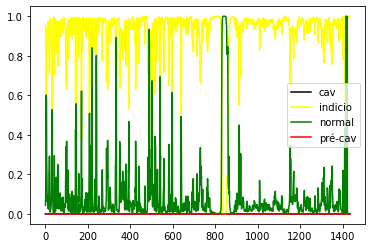

LSTM_2_ 77


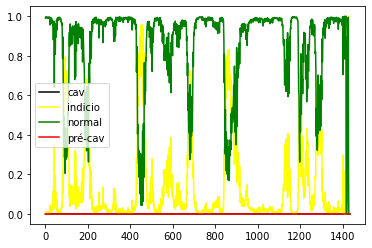

LSTM_2_ 78


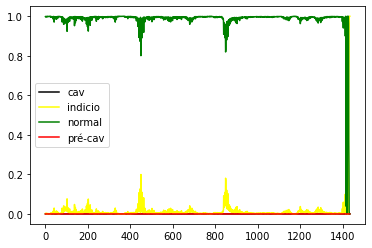

LSTM_2_ 79


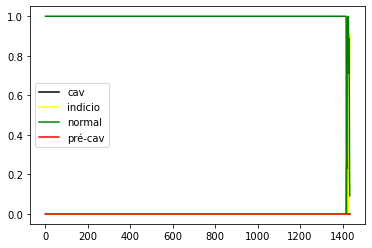

LSTM_2_ 80


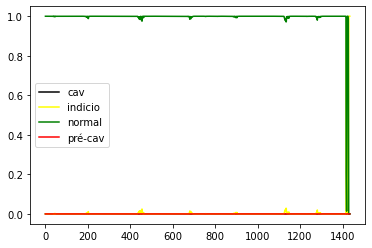

LSTM_2_ 81


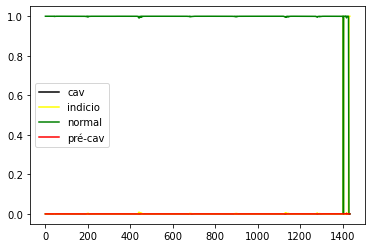

LSTM_2_ 82


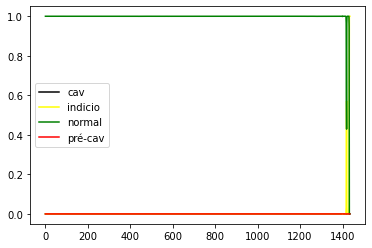

LSTM_2_ 83


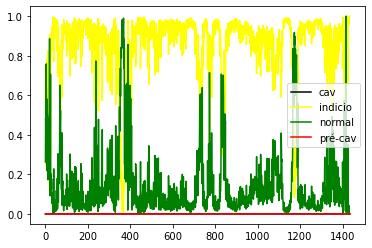

LSTM_2_ 84


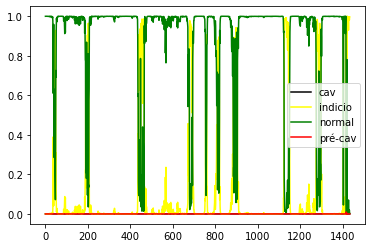

LSTM_2_ 85


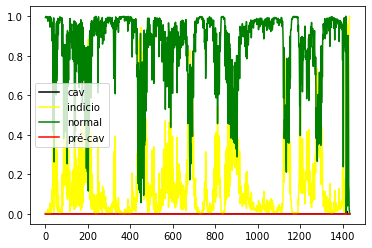

LSTM_2_ 86


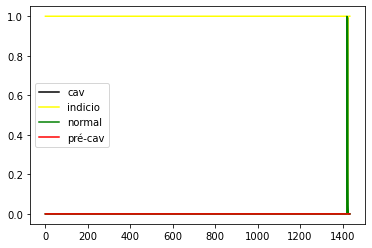

LSTM_2_ 87


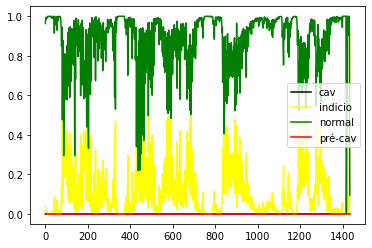

LSTM_2_ 88


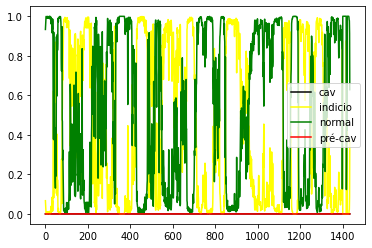

LSTM_2_ 89


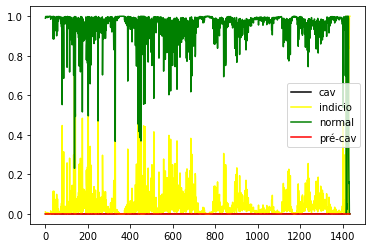

LSTM_2_ 90


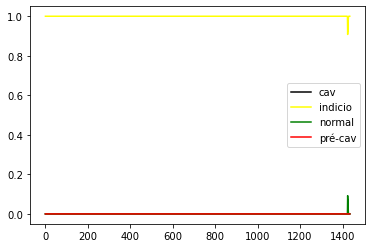

LSTM_2_ 91


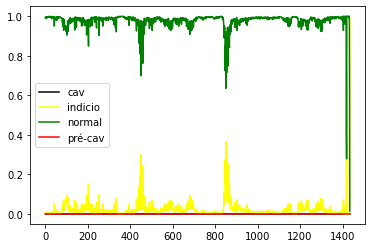

LSTM_2_ 92


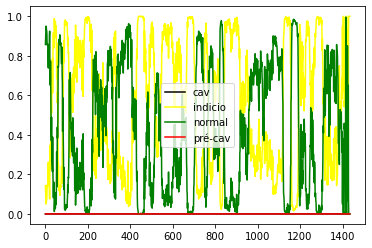

LSTM_2_ 93


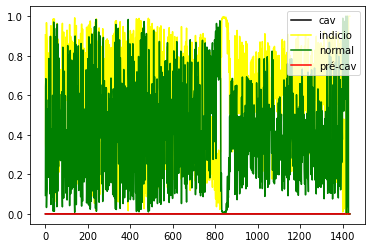

LSTM_2_ 94


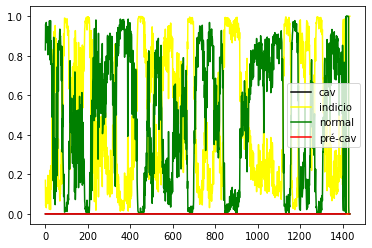

LSTM_2_ 95


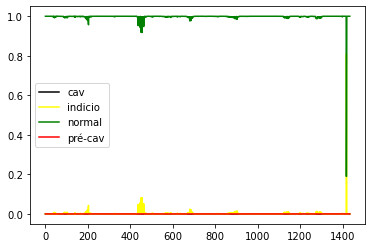

LSTM_2_ 96


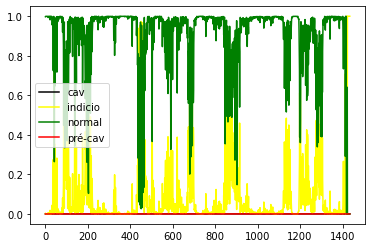

LSTM_2_ 97


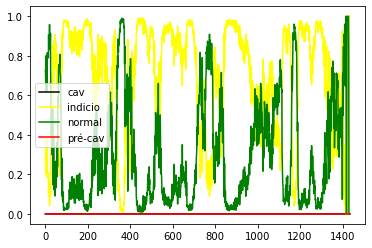

LSTM_2_ 98


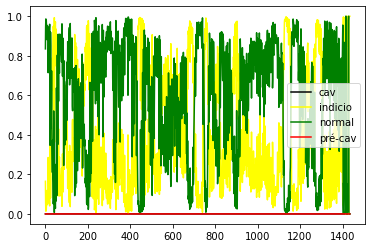

LSTM_2_ 99


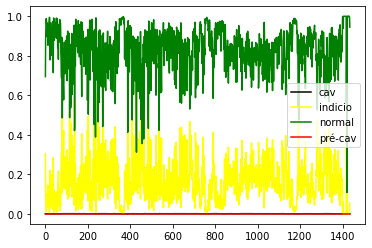

CNN_ 0


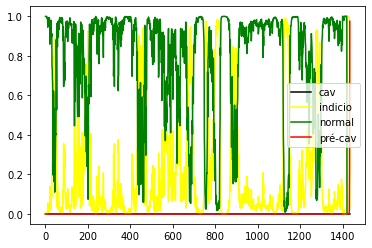

CNN_ 1


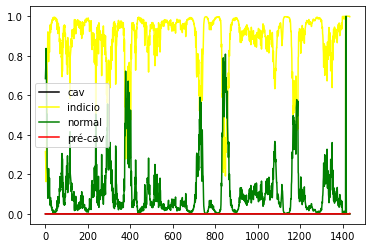

CNN_ 2


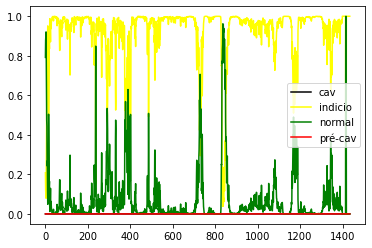

CNN_ 3


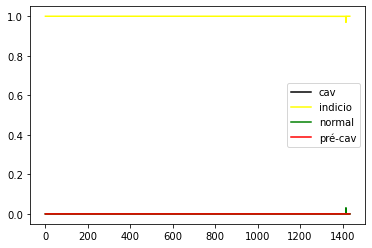

CNN_ 4


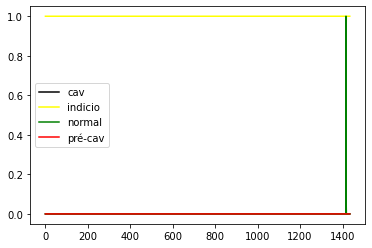

CNN_ 5


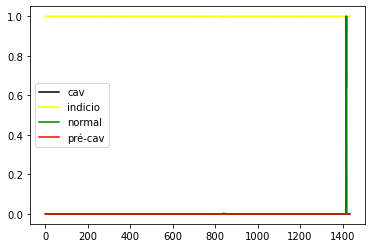

CNN_ 6


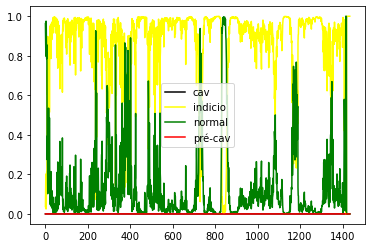

CNN_ 7


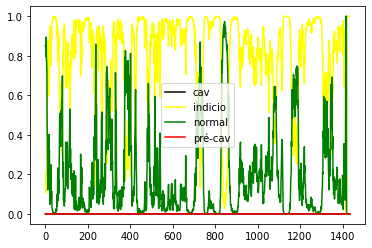

CNN_ 8


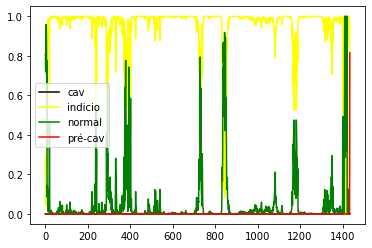

CNN_ 9


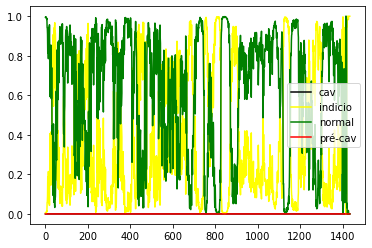

CNN_ 10


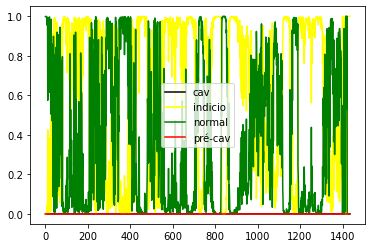

CNN_ 11


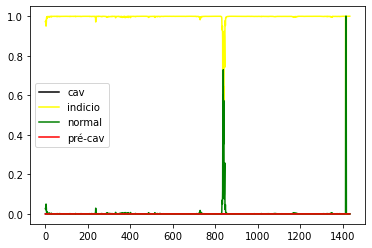

CNN_ 12


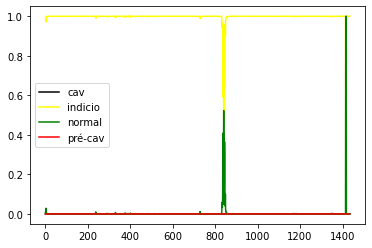

CNN_ 13


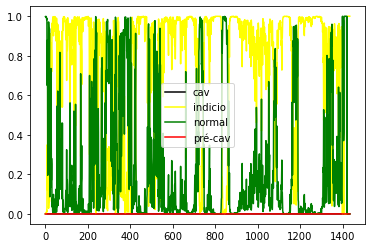

CNN_ 14


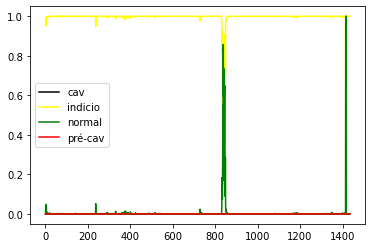

CNN_ 15


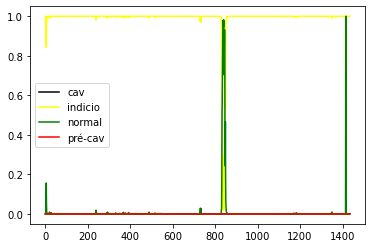

CNN_ 16


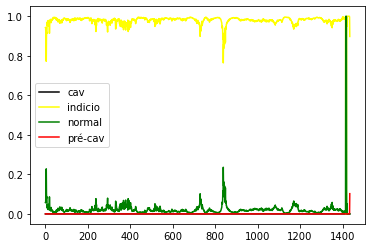

CNN_ 17


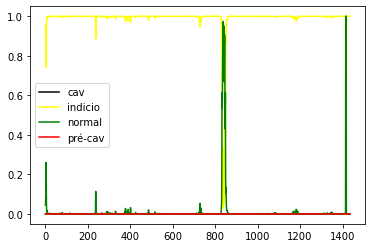

CNN_ 18


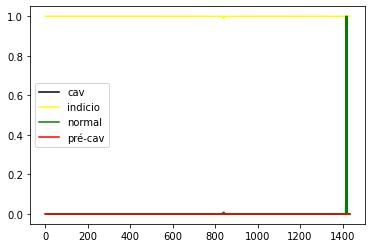

CNN_ 19


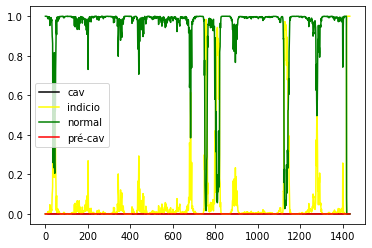

CNN_ 20


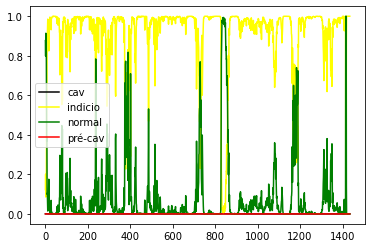

CNN_ 21


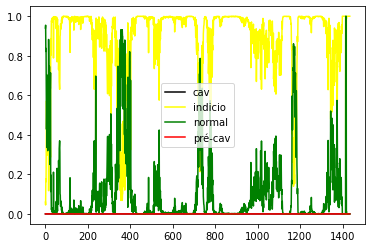

CNN_ 22


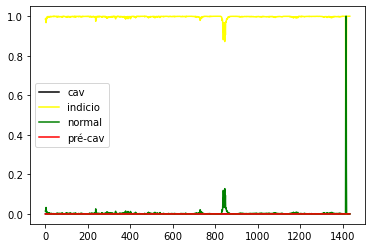

CNN_ 23


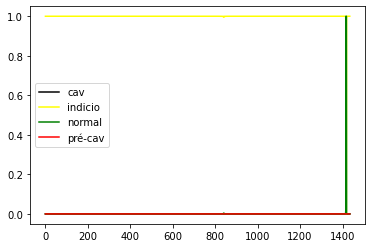

CNN_ 24


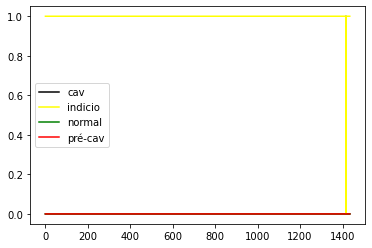

CNN_ 25


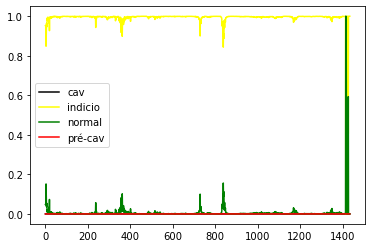

CNN_ 26


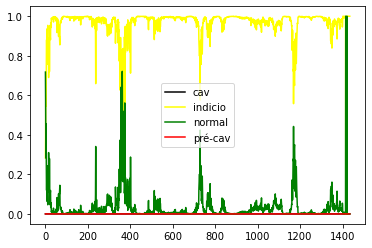

CNN_ 27


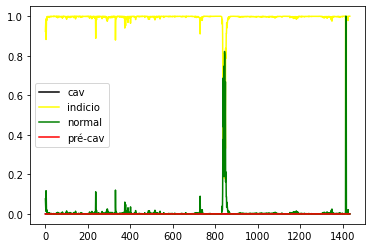

CNN_ 28


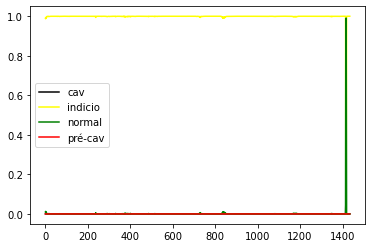

CNN_ 29


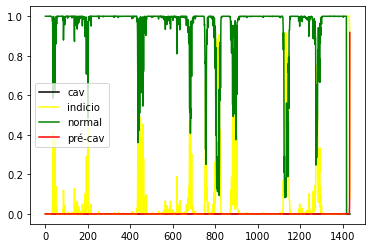

CNN_ 30


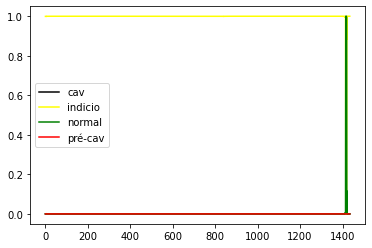

CNN_ 31


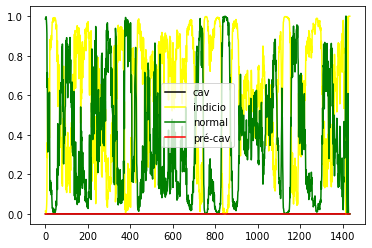

CNN_ 32


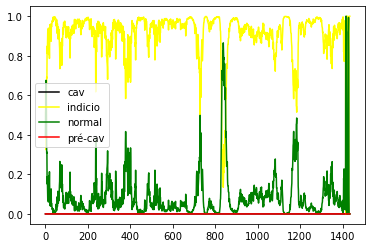

CNN_ 33


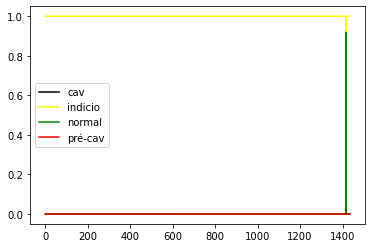

CNN_ 34


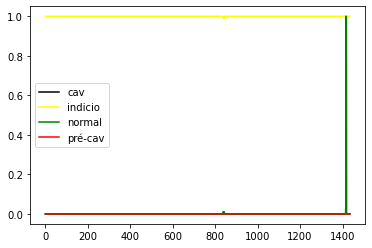

CNN_ 35


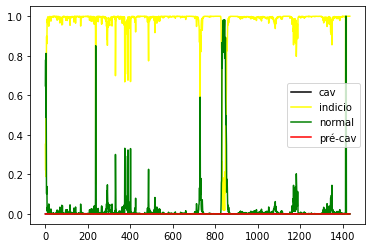

CNN_ 36


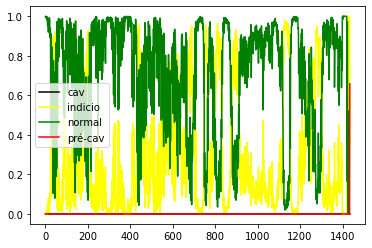

CNN_ 37


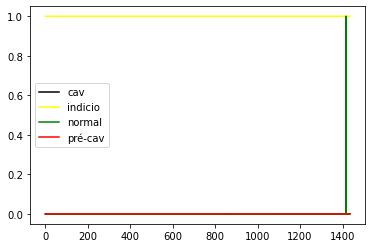

CNN_ 38


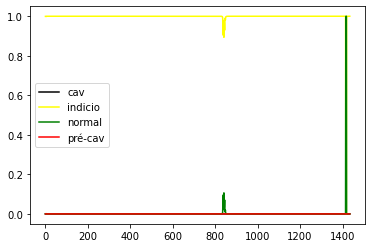

CNN_ 39


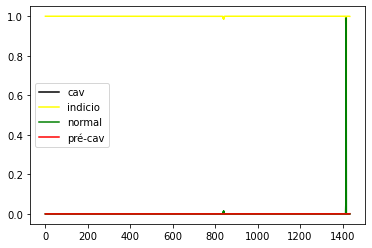

CNN_ 40


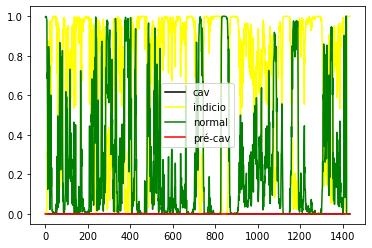

CNN_ 41


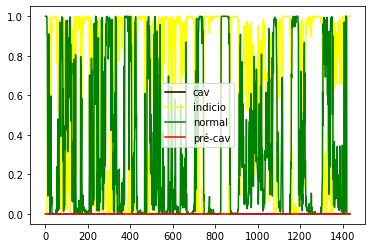

CNN_ 42


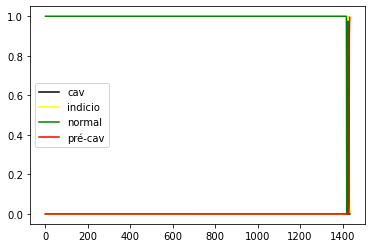

CNN_ 43


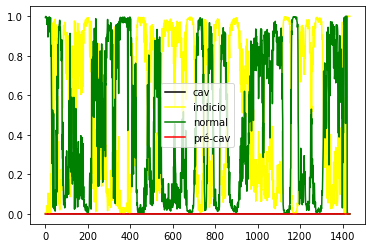

CNN_ 44


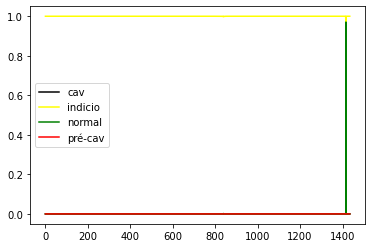

CNN_ 45


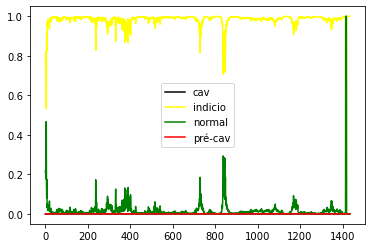

CNN_ 46


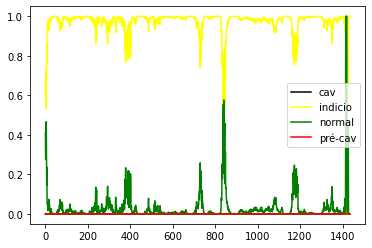

CNN_ 47


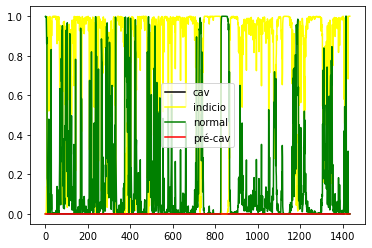

CNN_ 48


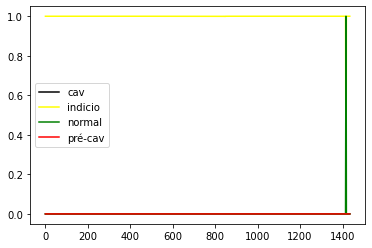

CNN_ 49


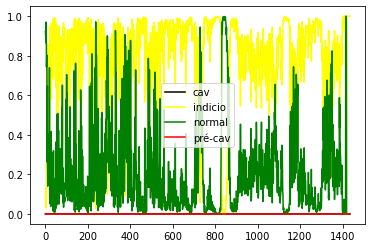

CNN_ 50


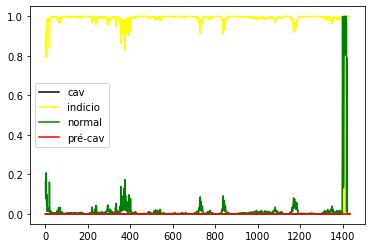

CNN_ 51


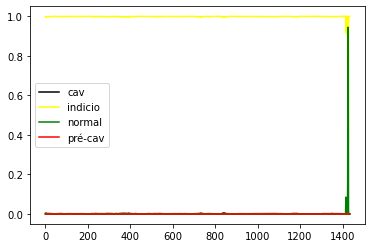

CNN_ 52


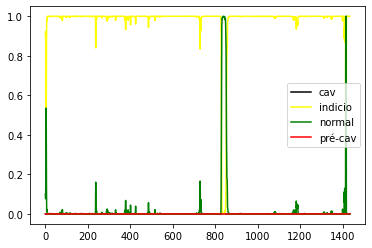

CNN_ 53


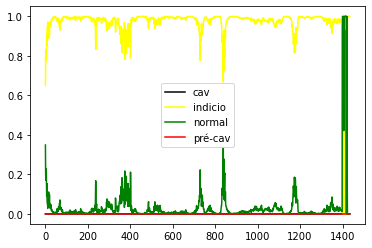

CNN_ 54


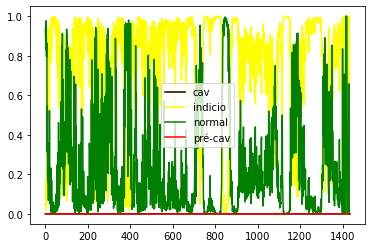

CNN_ 55


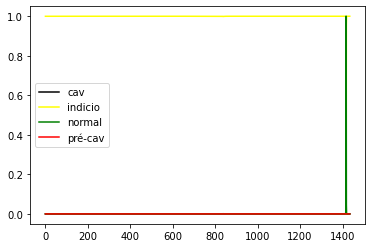

CNN_ 56


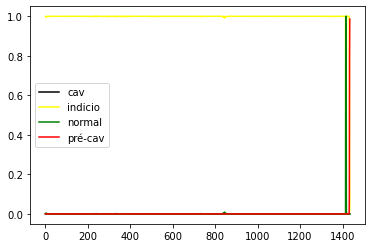

CNN_ 57


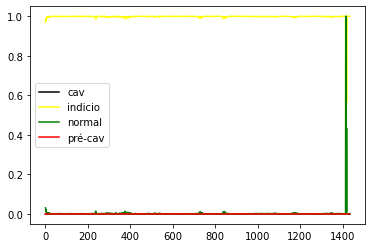

CNN_ 58


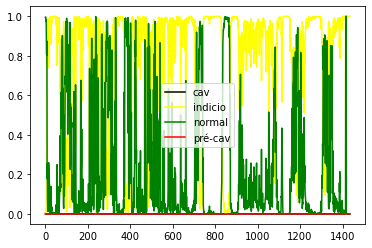

CNN_ 59


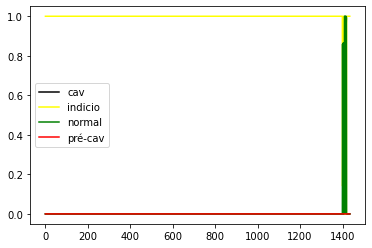

CNN_ 60


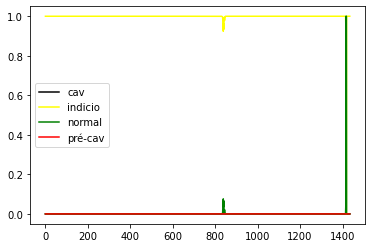

CNN_ 61


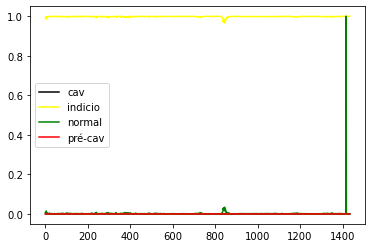

CNN_ 62


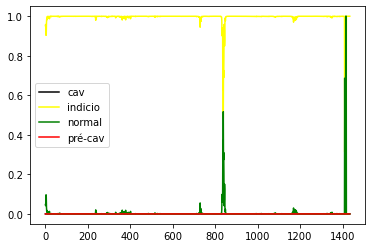

CNN_ 63


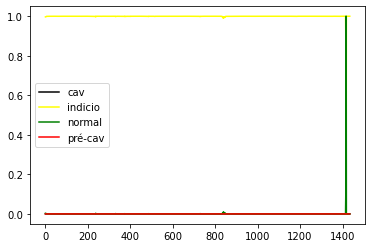

CNN_ 64


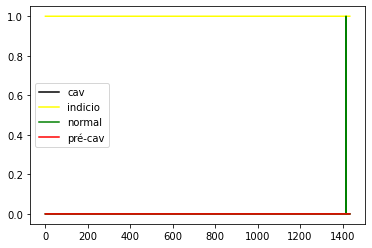

CNN_ 65


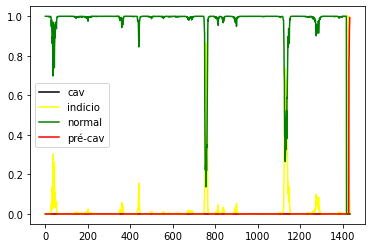

CNN_ 66


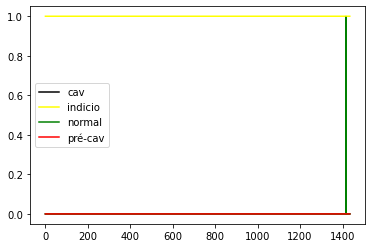

CNN_ 67


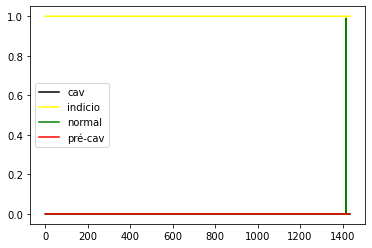

CNN_ 68


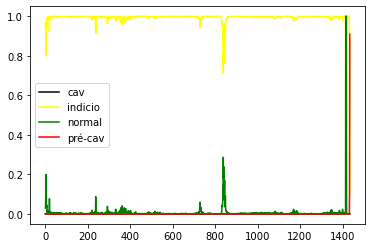

CNN_ 69


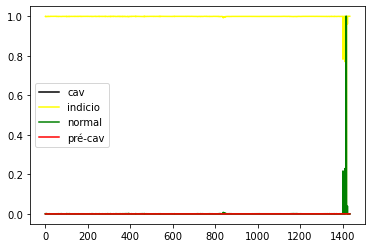

CNN_ 70


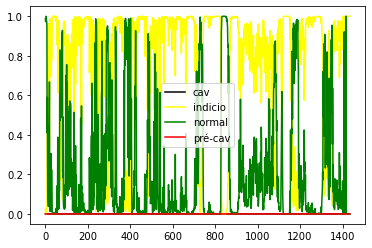

CNN_ 71


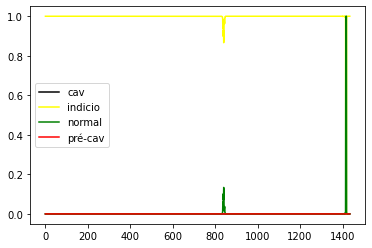

CNN_ 72


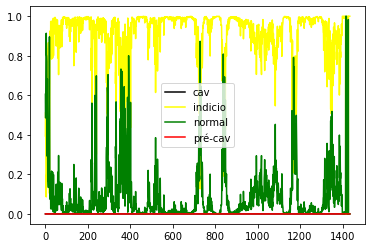

CNN_ 73


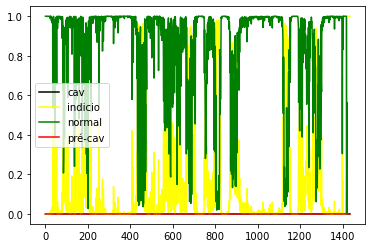

CNN_ 74


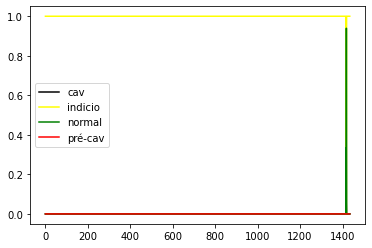

CNN_ 75


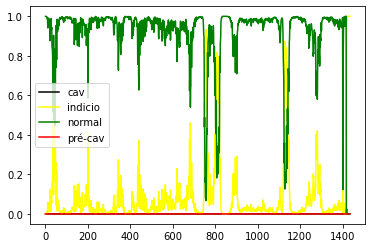

CNN_ 76


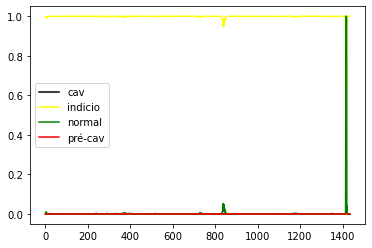

CNN_ 77


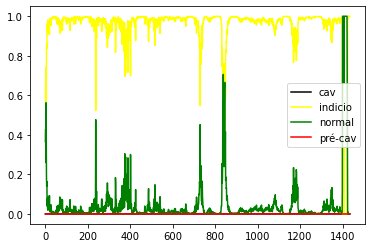

CNN_ 78


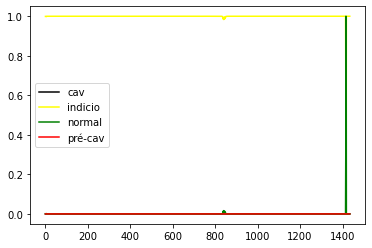

CNN_ 79


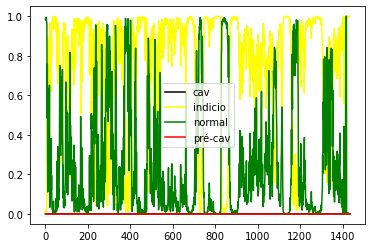

CNN_ 80


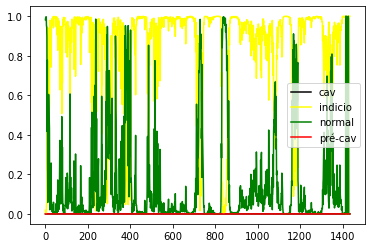

CNN_ 81


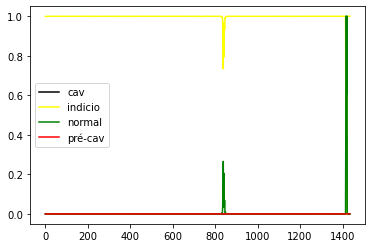

CNN_ 82


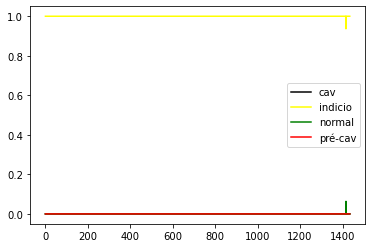

CNN_ 83


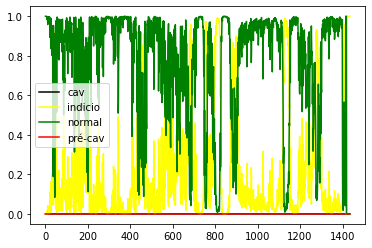

CNN_ 84


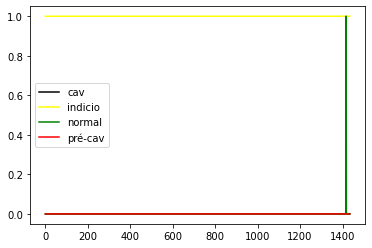

CNN_ 85


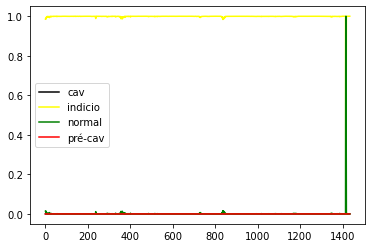

CNN_ 86


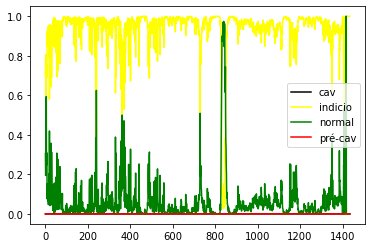

CNN_ 87


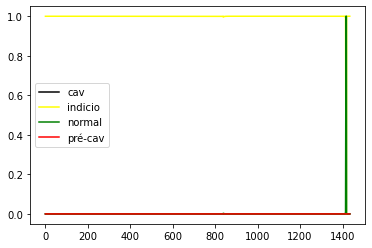

CNN_ 88


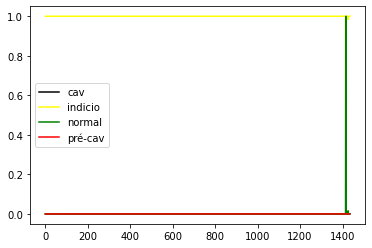

CNN_ 89


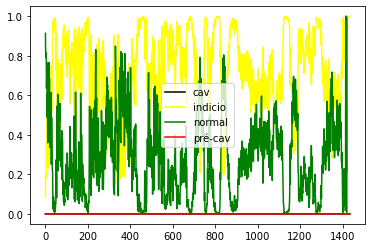

CNN_ 90


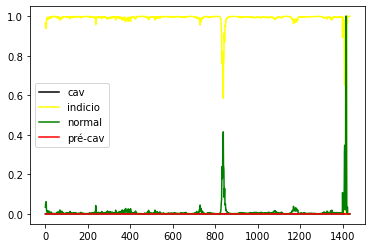

CNN_ 91


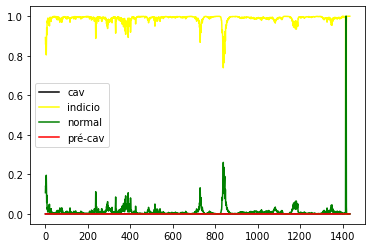

CNN_ 92


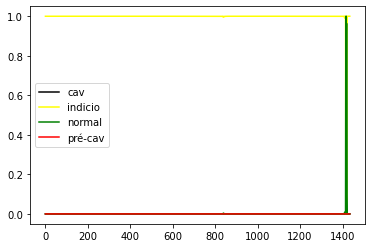

CNN_ 93


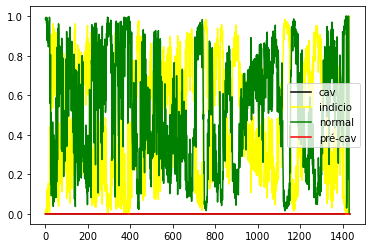

CNN_ 94


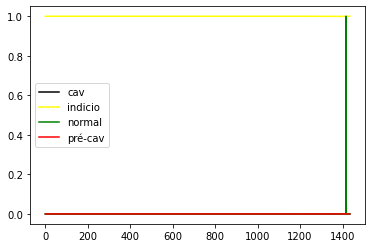

CNN_ 95


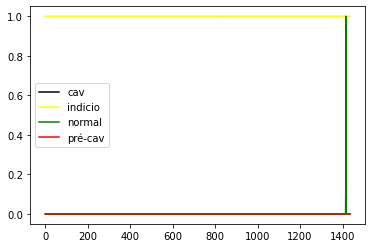

CNN_ 96


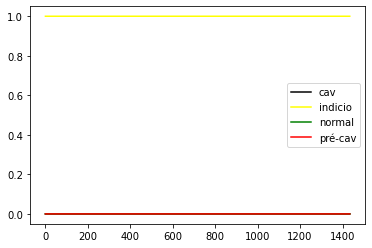

CNN_ 97


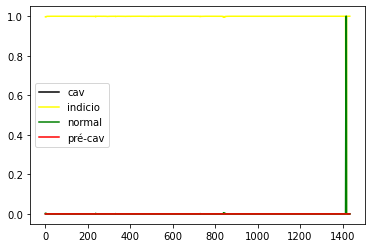

CNN_ 98


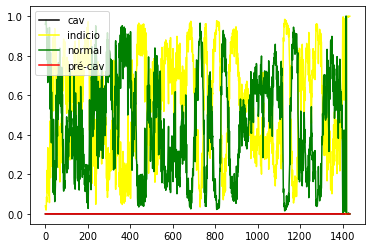

CNN_ 99


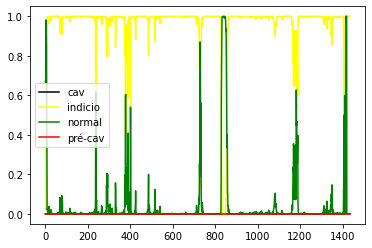

In [30]:
lstm_list = range(0,n_training)
lstm_2_list = range(0,n_training)
cnn_list = range(0,n_training)

start = 0

yhat_out = []

for i in lstm_list:
  print("LSTM_",i)
  yhat = models_lstm[i].predict(test_full_series)
  yhat_out.append(yhat)
  pyplot.plot(yhat[start:,0],label="cav",color='black')
  pyplot.plot(yhat[start:,1],label="indicio",color='yellow')
  pyplot.plot(yhat[start:,2],label="normal",color='green')
  pyplot.plot(yhat[start:,3],label="pré-cav",color='red')
  pyplot.legend()
  pyplot.show()

for i in lstm_2_list:
  print("LSTM_2_",i)
  yhat = models_lstm_2[i].predict(test_full_series)
  yhat_out.append(yhat)
  pyplot.plot(yhat[start:,0],label="cav",color='black')
  pyplot.plot(yhat[start:,1],label="indicio",color='yellow')
  pyplot.plot(yhat[start:,2],label="normal",color='green')
  pyplot.plot(yhat[start:,3],label="pré-cav",color='red')
  pyplot.legend()
  pyplot.show()

for i in cnn_list:
  print("CNN_",i)
  yhat = models_cnn[i].predict(test_full_series)
  yhat_out.append(yhat)
  pyplot.plot(yhat[start:,0],label="cav",color='black')
  pyplot.plot(yhat[start:,1],label="indicio",color='yellow')
  pyplot.plot(yhat[start:,2],label="normal",color='green')
  pyplot.plot(yhat[start:,3],label="pré-cav",color='red')
  pyplot.legend()
  pyplot.show()

LSTM_ 0


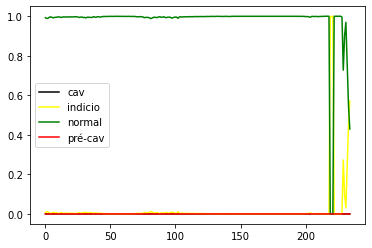

LSTM_ 1


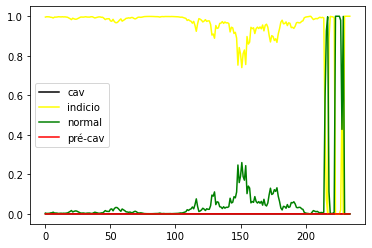

LSTM_ 2


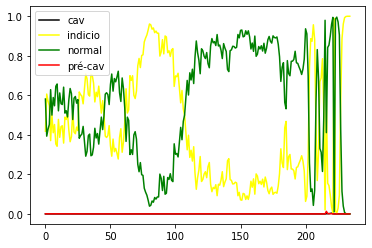

LSTM_ 3


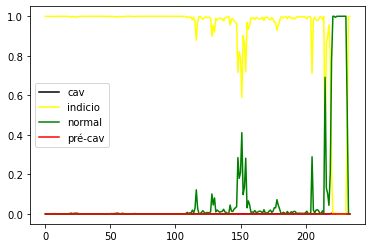

LSTM_ 4


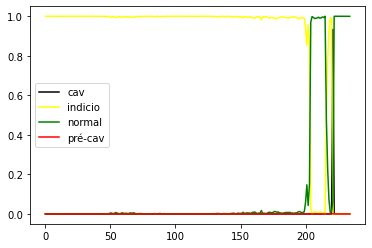

LSTM_ 5


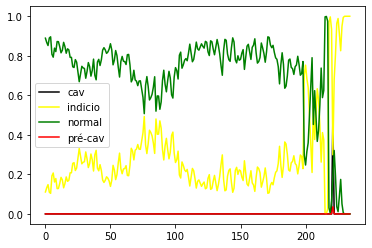

LSTM_ 6


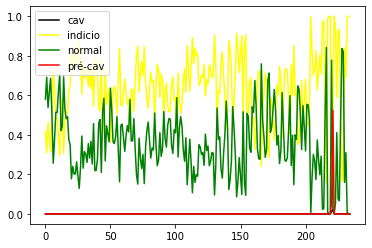

LSTM_ 7


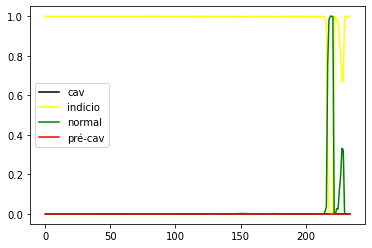

LSTM_ 8


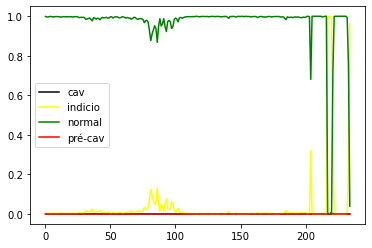

LSTM_ 9


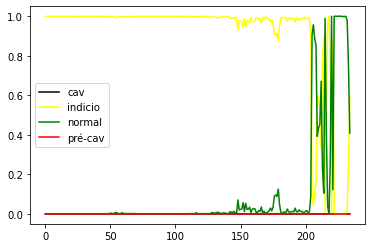

LSTM_ 10


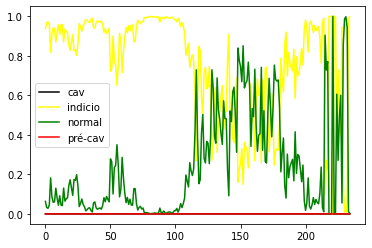

LSTM_ 11


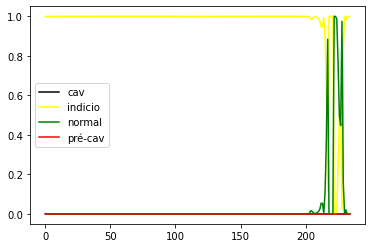

LSTM_ 12


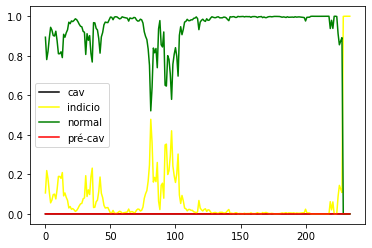

LSTM_ 13


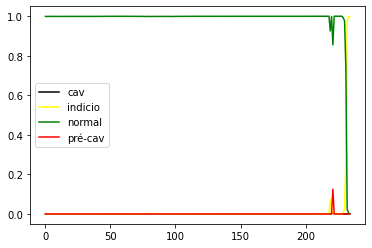

LSTM_ 14


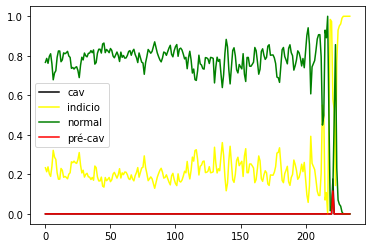

LSTM_ 15


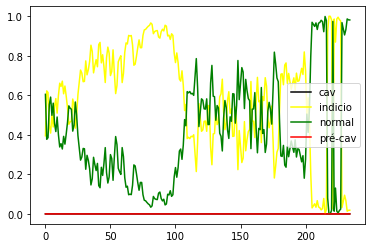

LSTM_ 16


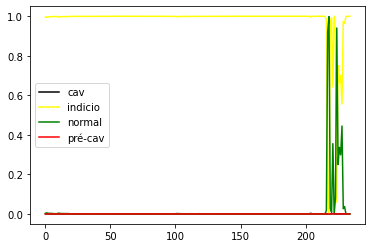

LSTM_ 17


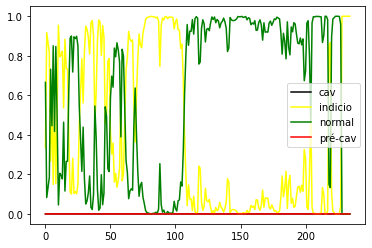

LSTM_ 18


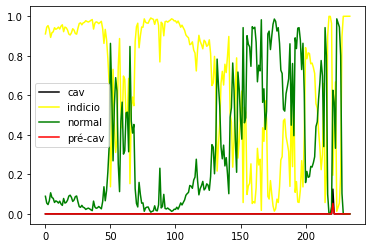

LSTM_ 19


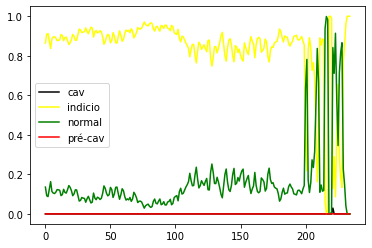

LSTM_ 20


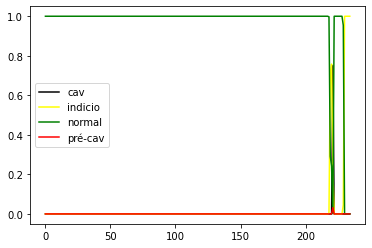

LSTM_ 21


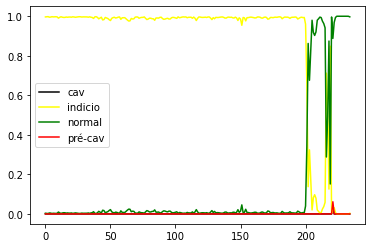

LSTM_ 22


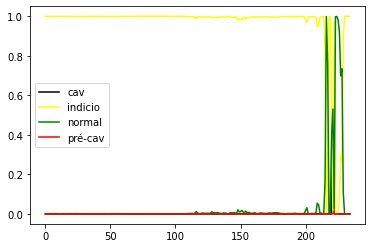

LSTM_ 23


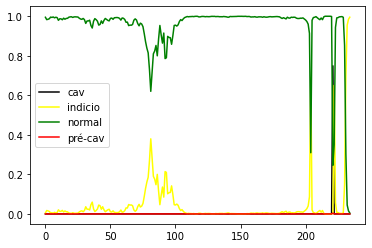

LSTM_ 24


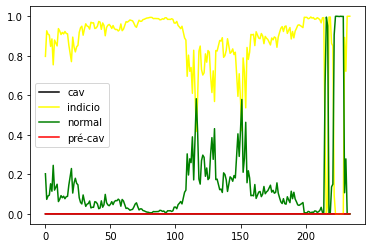

LSTM_ 25


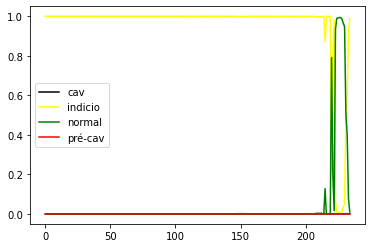

LSTM_ 26


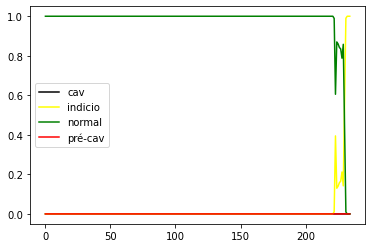

LSTM_ 27


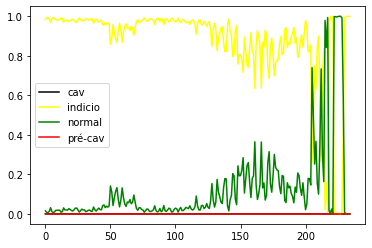

LSTM_ 28


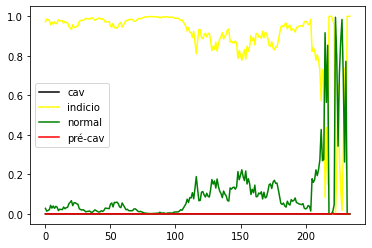

LSTM_ 29


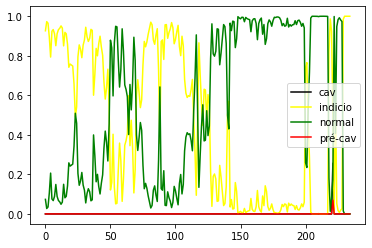

LSTM_ 30


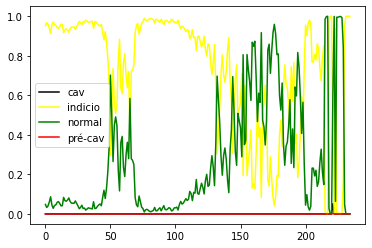

LSTM_ 31


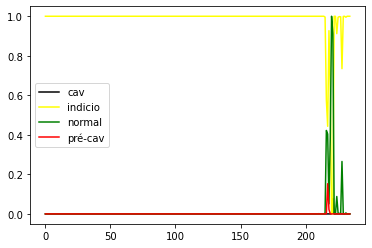

LSTM_ 32


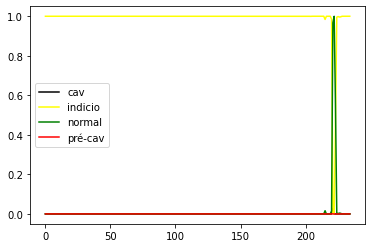

LSTM_ 33


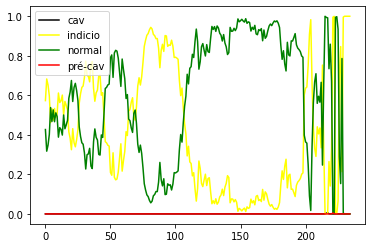

LSTM_ 34


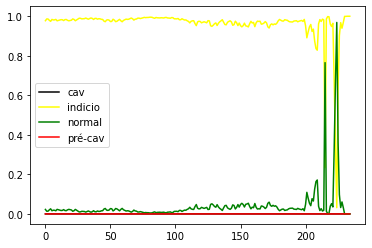

LSTM_ 35


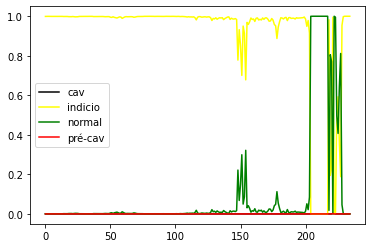

LSTM_ 36


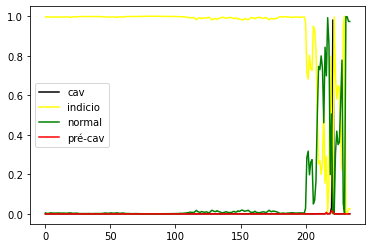

LSTM_ 37


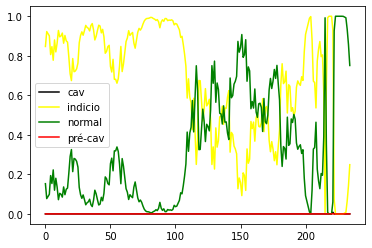

LSTM_ 38


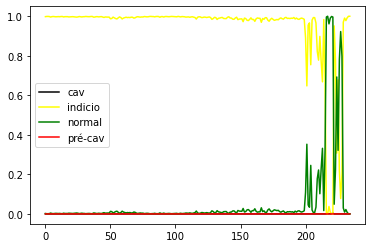

LSTM_ 39


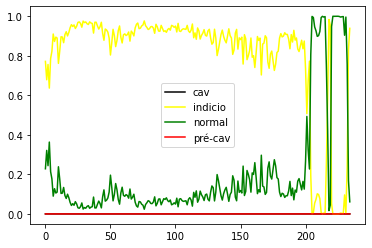

LSTM_ 40


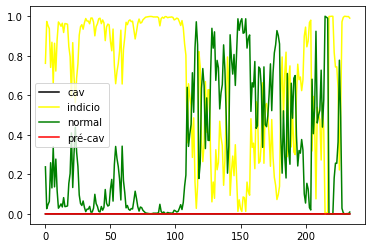

LSTM_ 41


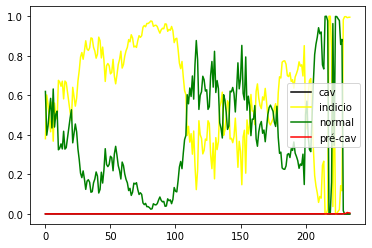

LSTM_ 42


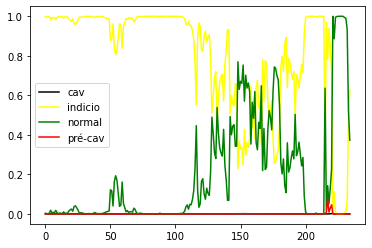

LSTM_ 43


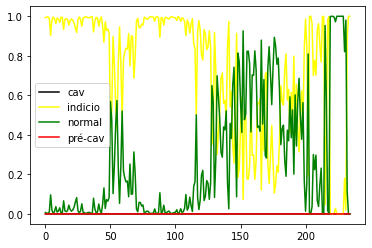

LSTM_ 44


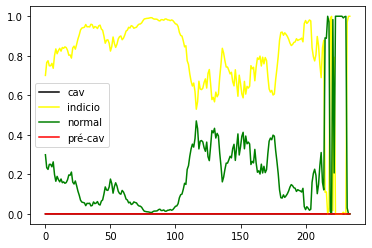

LSTM_ 45


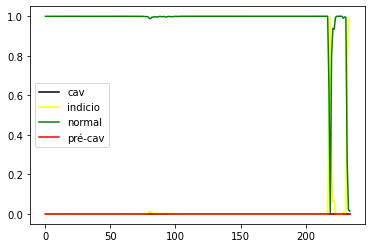

LSTM_ 46


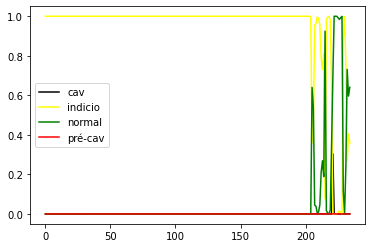

LSTM_ 47


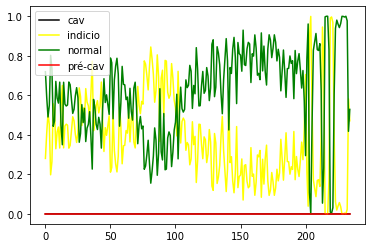

LSTM_ 48


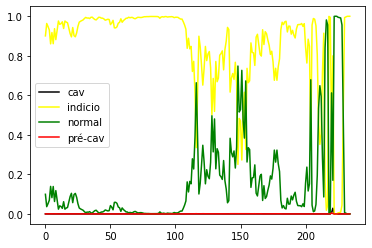

LSTM_ 49


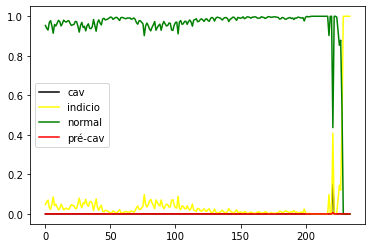

LSTM_ 50


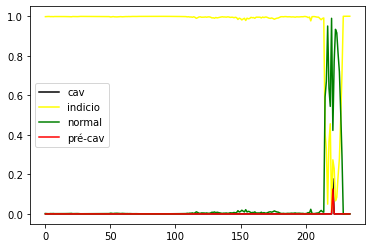

LSTM_ 51


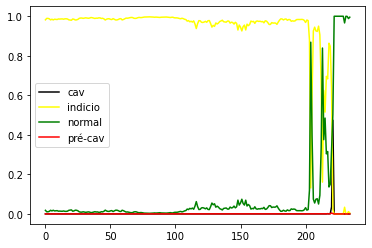

LSTM_ 52


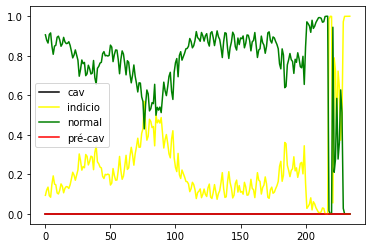

LSTM_ 53


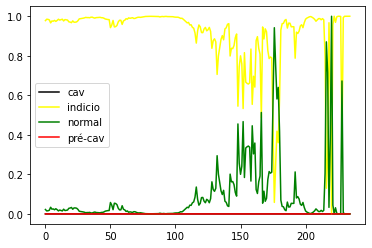

LSTM_ 54


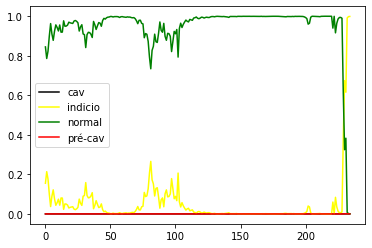

LSTM_ 55


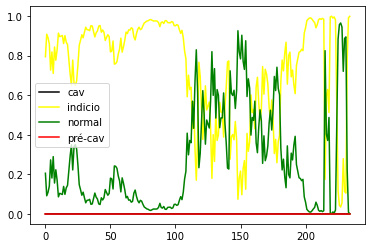

LSTM_ 56


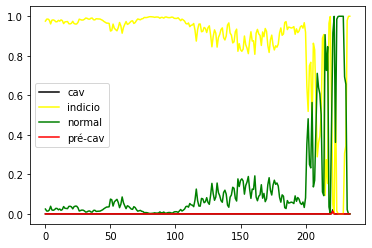

LSTM_ 57


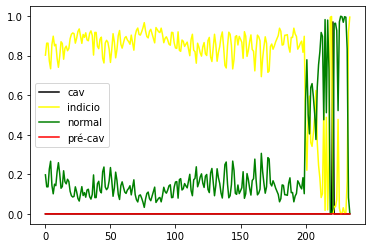

LSTM_ 58


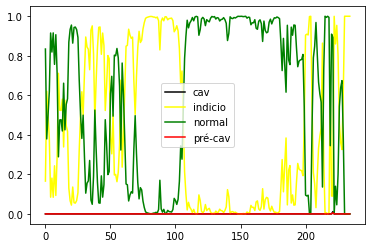

LSTM_ 59


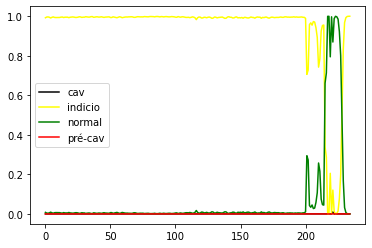

LSTM_ 60


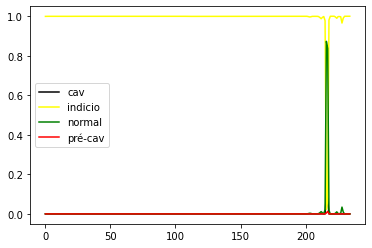

LSTM_ 61


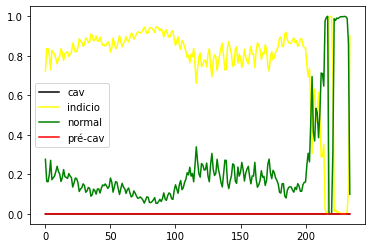

LSTM_ 62


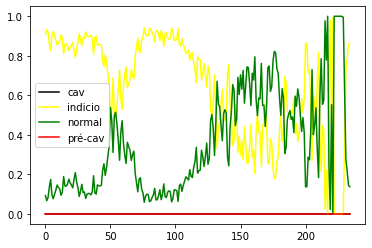

LSTM_ 63


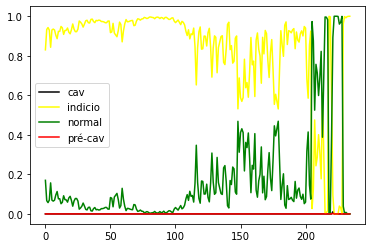

LSTM_ 64


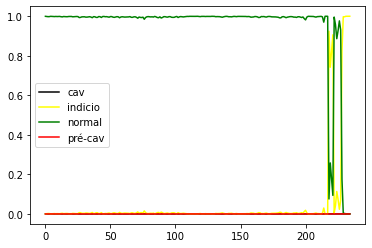

LSTM_ 65


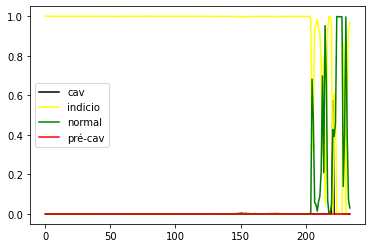

LSTM_ 66


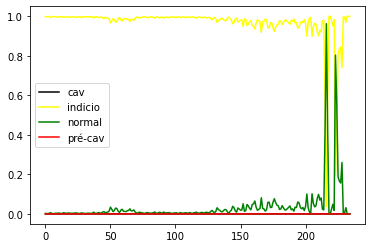

LSTM_ 67


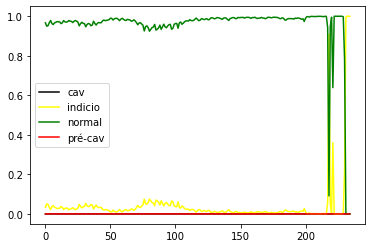

LSTM_ 68


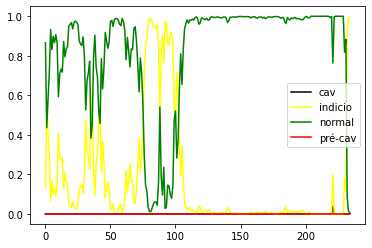

LSTM_ 69


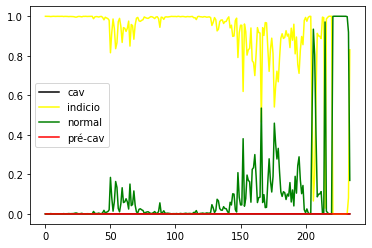

LSTM_ 70


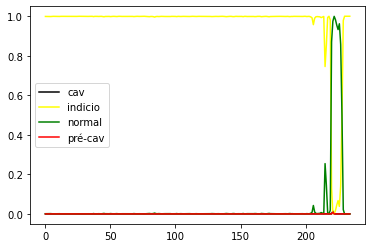

LSTM_ 71


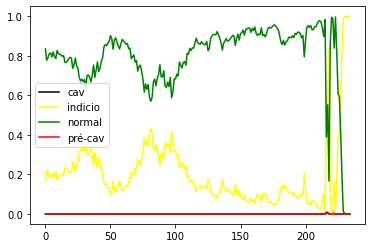

LSTM_ 72


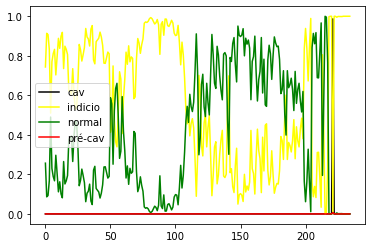

LSTM_ 73


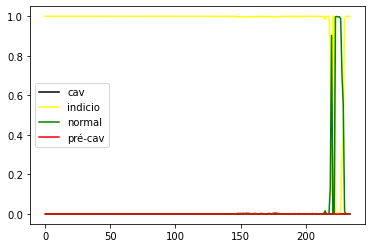

LSTM_ 74


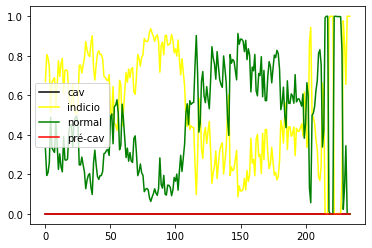

LSTM_ 75


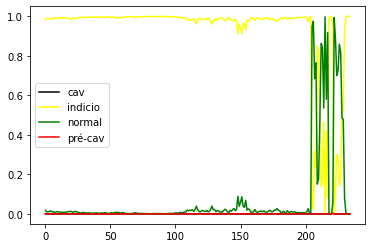

LSTM_ 76


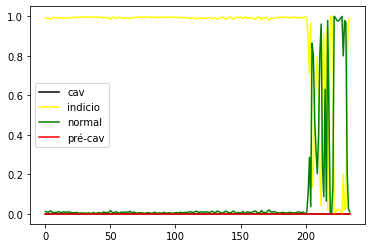

LSTM_ 77


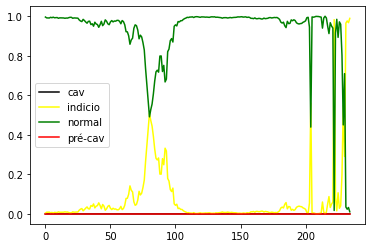

LSTM_ 78


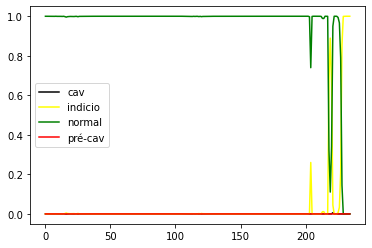

LSTM_ 79


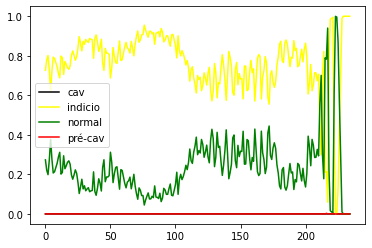

LSTM_ 80


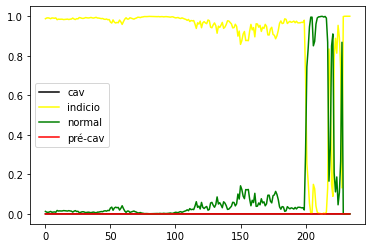

LSTM_ 81


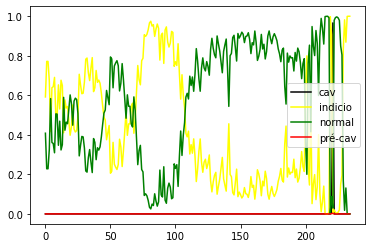

LSTM_ 82


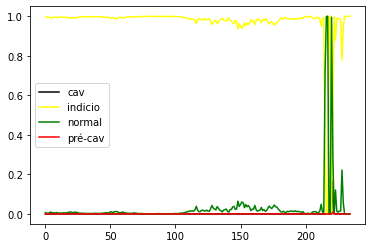

LSTM_ 83


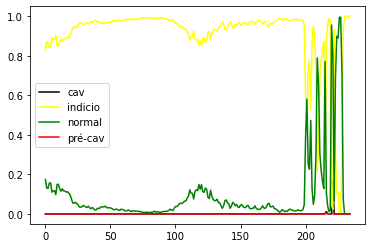

LSTM_ 84


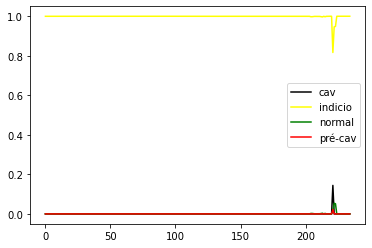

LSTM_ 85


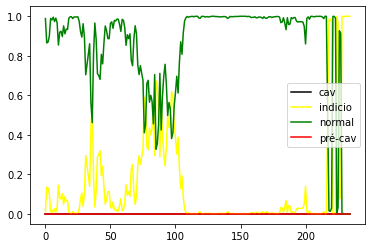

LSTM_ 86


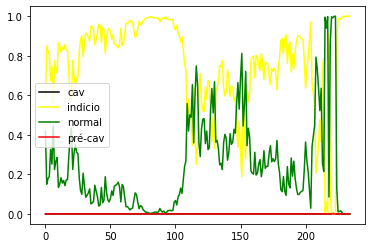

LSTM_ 87


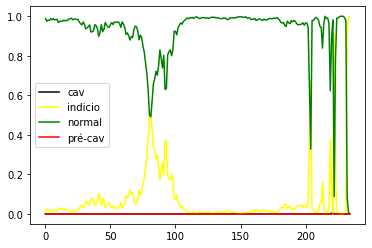

LSTM_ 88


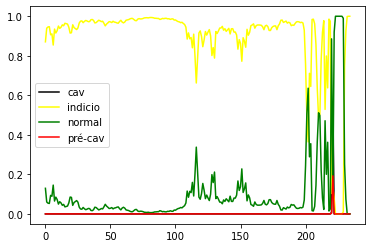

LSTM_ 89


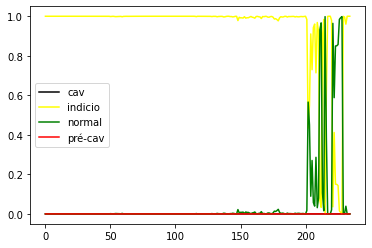

LSTM_ 90


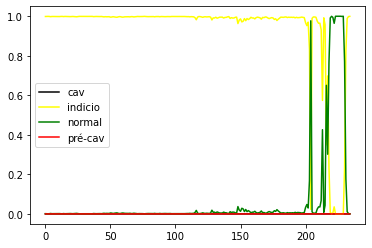

LSTM_ 91


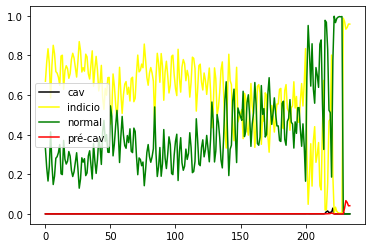

LSTM_ 92


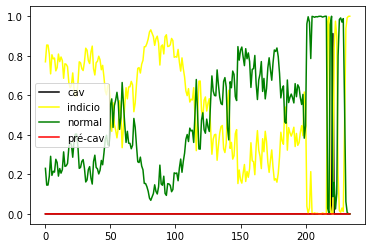

LSTM_ 93


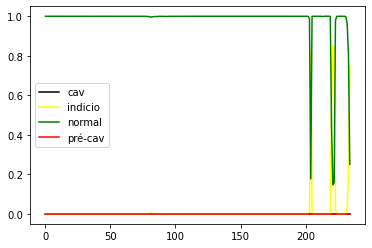

LSTM_ 94


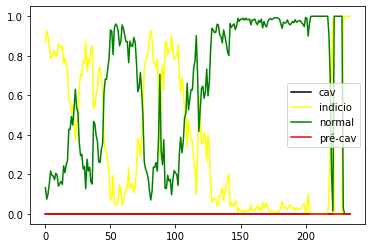

LSTM_ 95


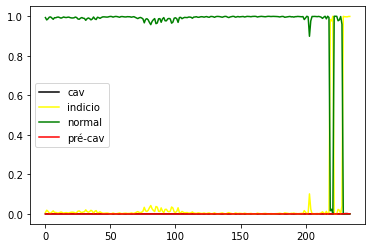

LSTM_ 96


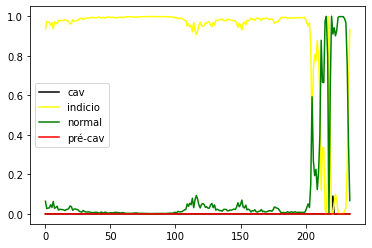

LSTM_ 97


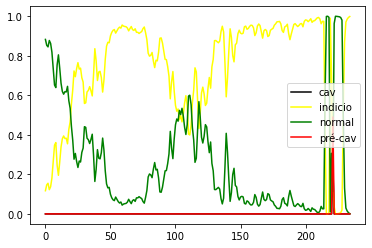

LSTM_ 98


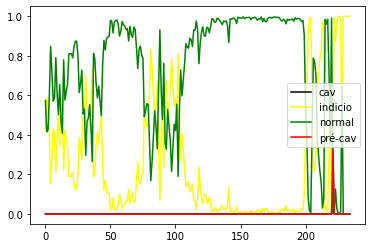

LSTM_ 99


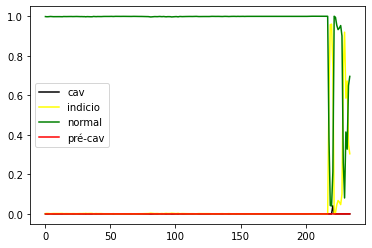

LSTM_2_ 0


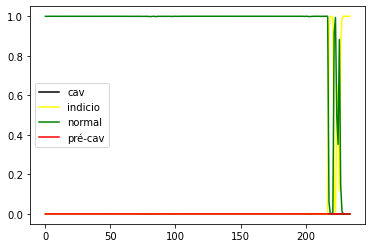

LSTM_2_ 1


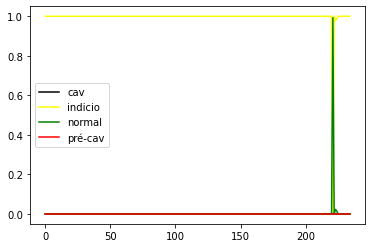

LSTM_2_ 2


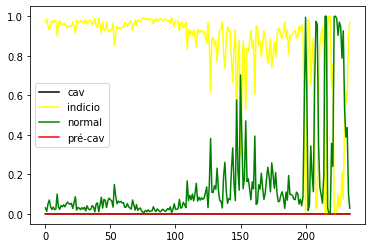

LSTM_2_ 3


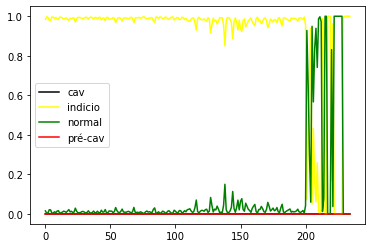

LSTM_2_ 4


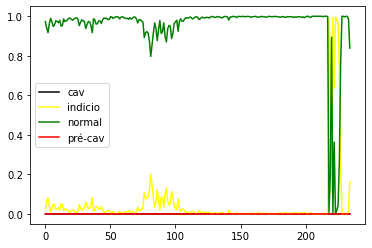

LSTM_2_ 5


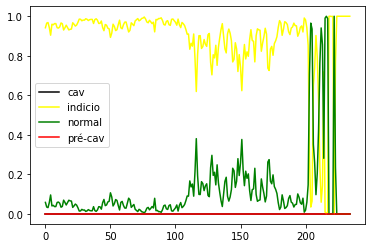

LSTM_2_ 6


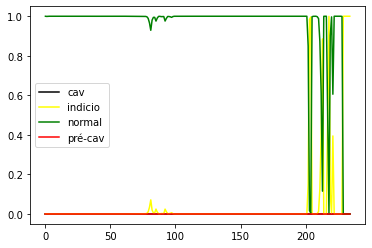

LSTM_2_ 7


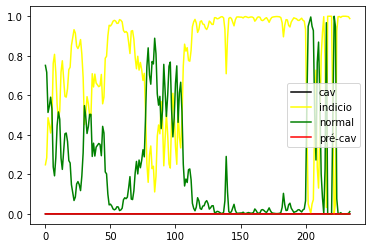

LSTM_2_ 8


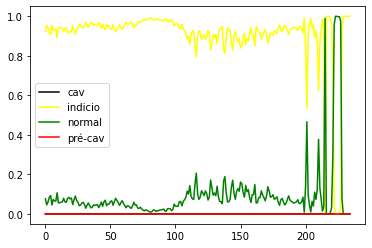

LSTM_2_ 9


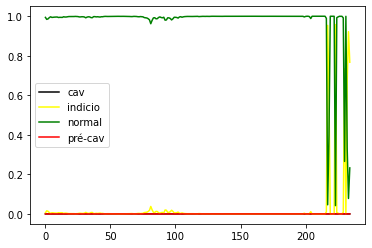

LSTM_2_ 10


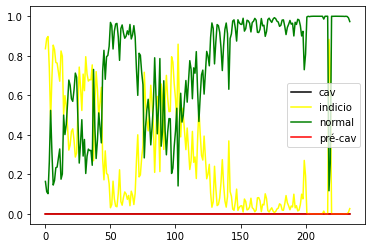

LSTM_2_ 11


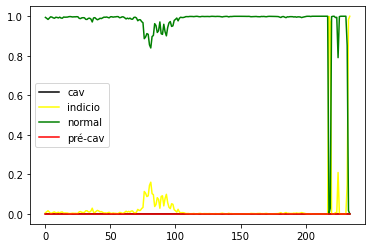

LSTM_2_ 12


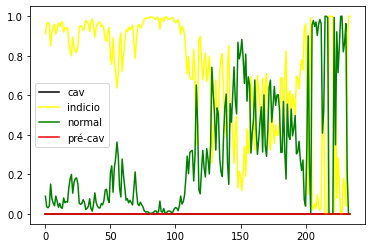

LSTM_2_ 13


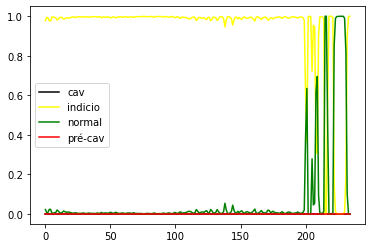

LSTM_2_ 14


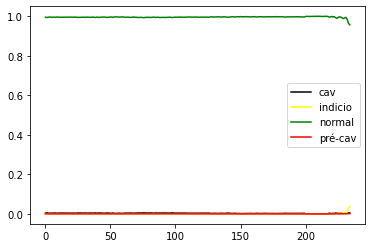

LSTM_2_ 15


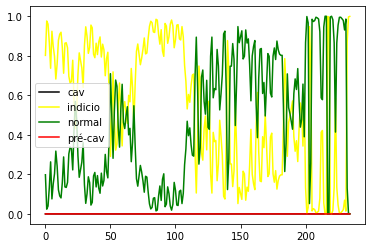

LSTM_2_ 16


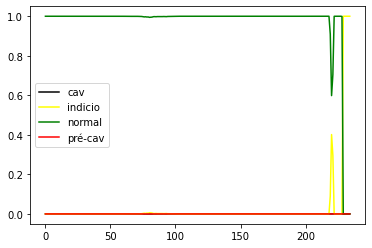

LSTM_2_ 17


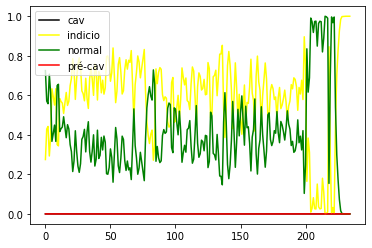

LSTM_2_ 18


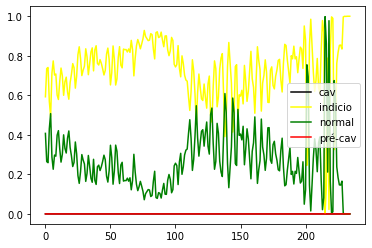

LSTM_2_ 19


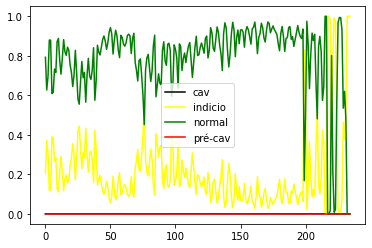

LSTM_2_ 20


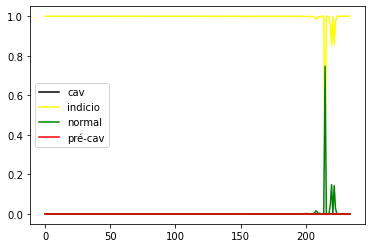

LSTM_2_ 21


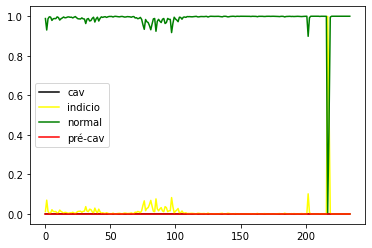

LSTM_2_ 22


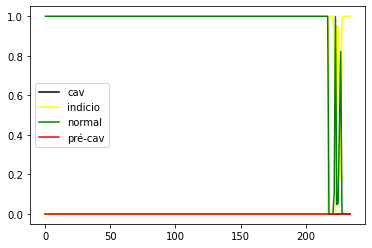

LSTM_2_ 23


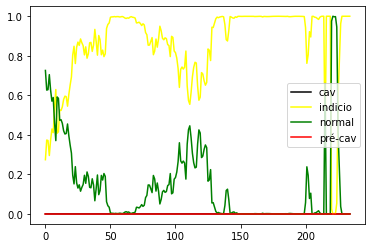

LSTM_2_ 24


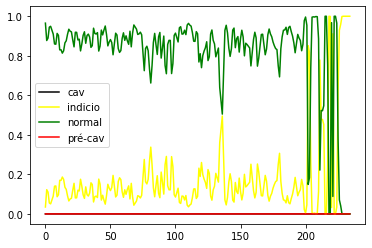

LSTM_2_ 25


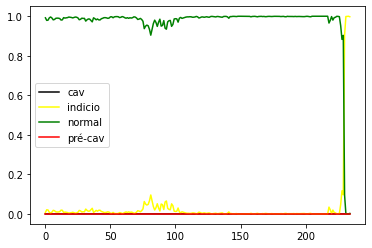

LSTM_2_ 26


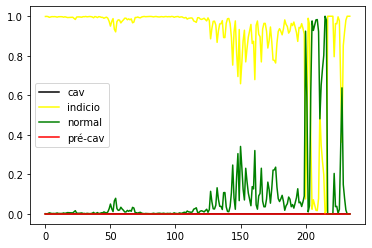

LSTM_2_ 27


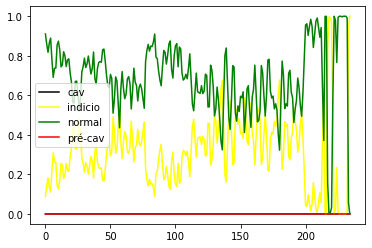

LSTM_2_ 28


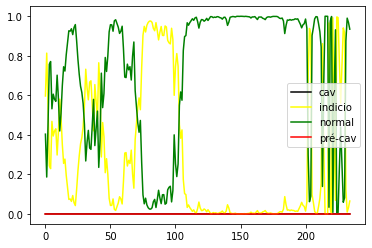

LSTM_2_ 29


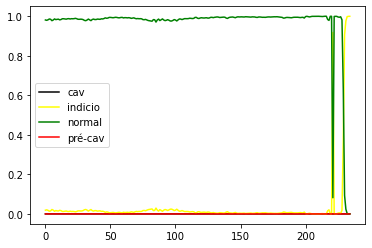

LSTM_2_ 30


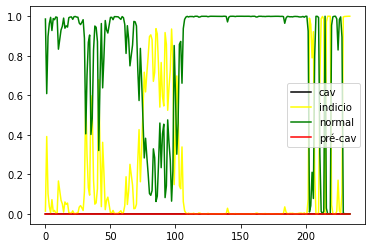

LSTM_2_ 31


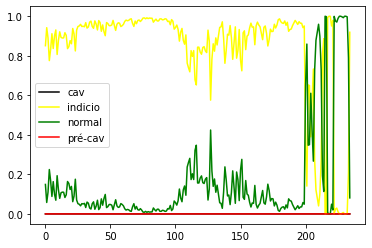

LSTM_2_ 32


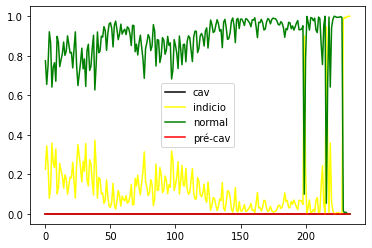

LSTM_2_ 33


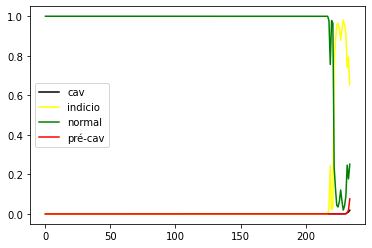

LSTM_2_ 34


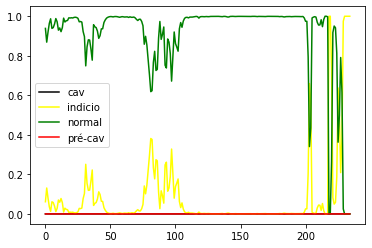

LSTM_2_ 35


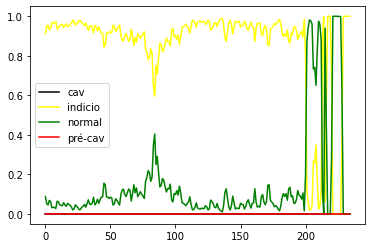

LSTM_2_ 36


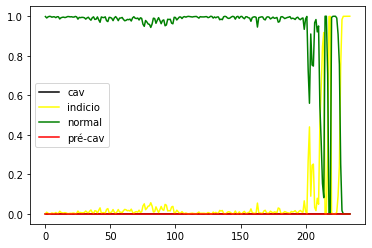

LSTM_2_ 37


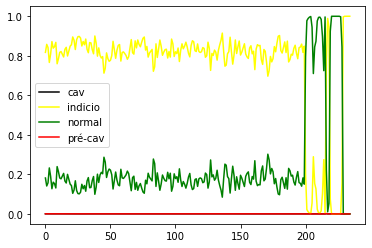

LSTM_2_ 38


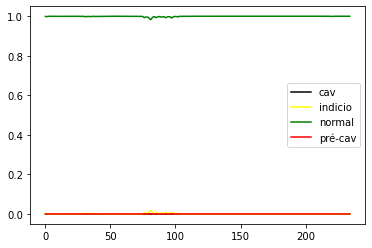

LSTM_2_ 39


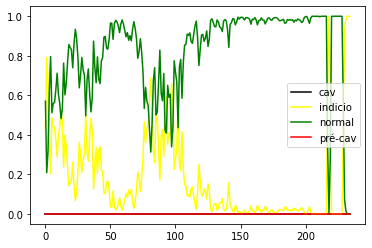

LSTM_2_ 40


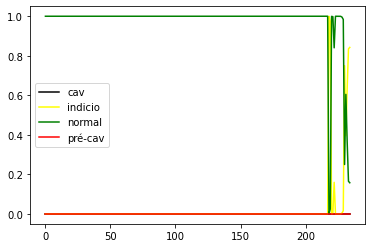

LSTM_2_ 41


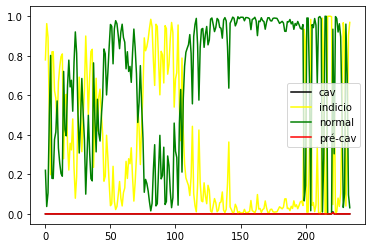

LSTM_2_ 42


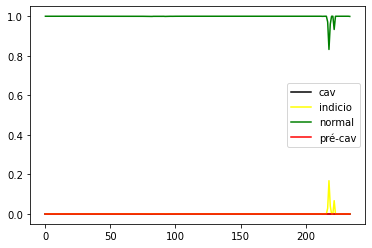

LSTM_2_ 43


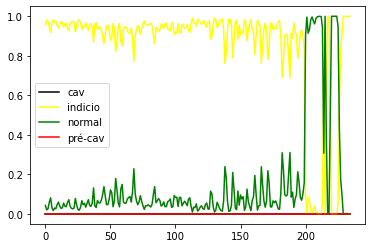

LSTM_2_ 44


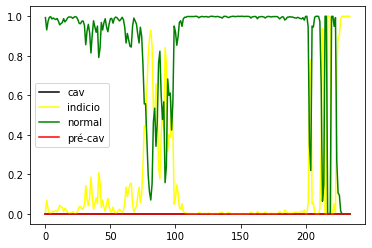

LSTM_2_ 45


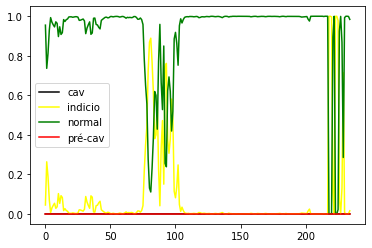

LSTM_2_ 46


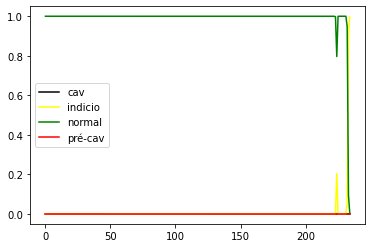

LSTM_2_ 47


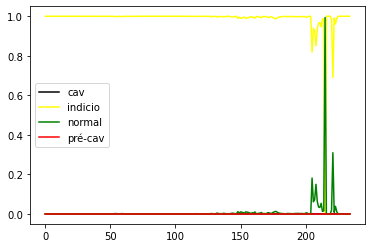

LSTM_2_ 48


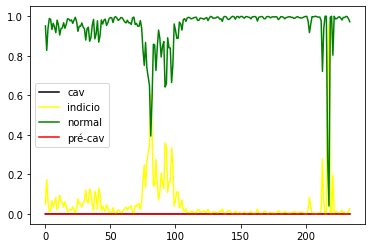

LSTM_2_ 49


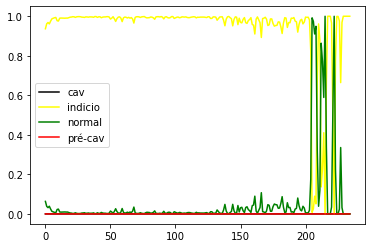

LSTM_2_ 50


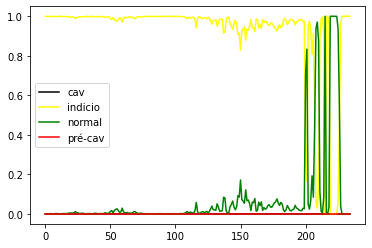

LSTM_2_ 51


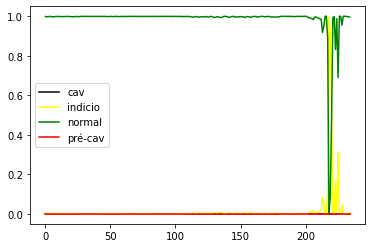

LSTM_2_ 52


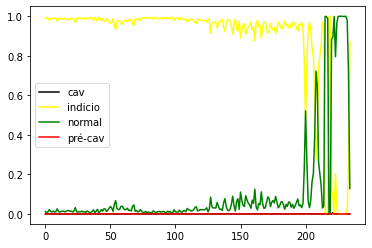

LSTM_2_ 53


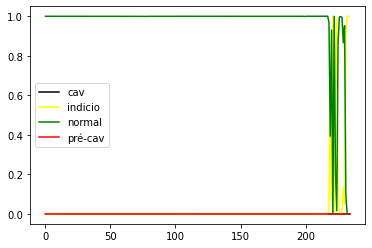

LSTM_2_ 54


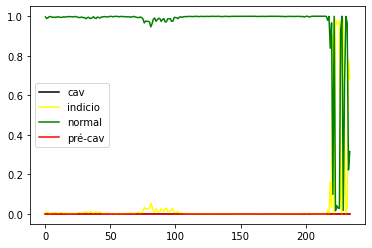

LSTM_2_ 55


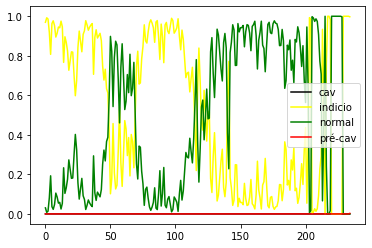

LSTM_2_ 56


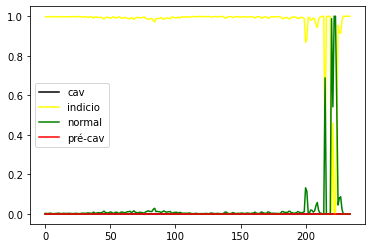

LSTM_2_ 57


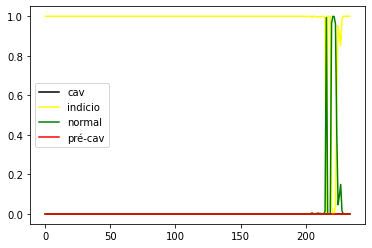

LSTM_2_ 58


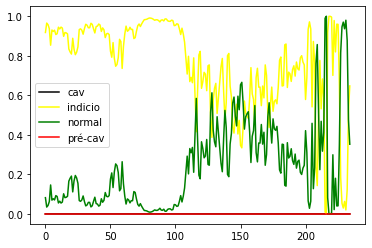

LSTM_2_ 59


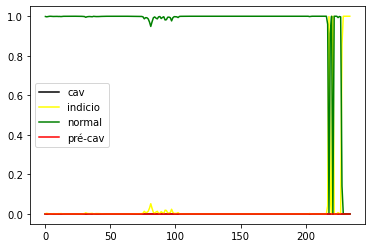

LSTM_2_ 60


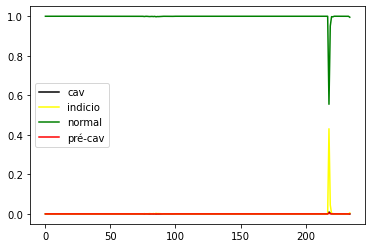

LSTM_2_ 61


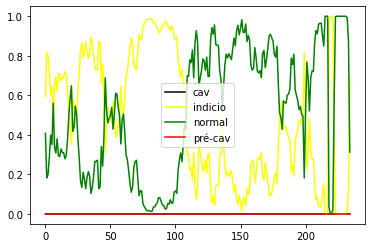

LSTM_2_ 62


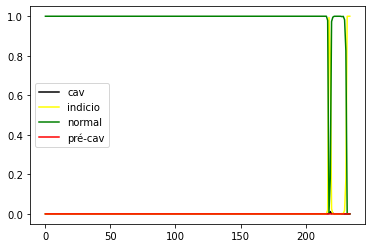

LSTM_2_ 63


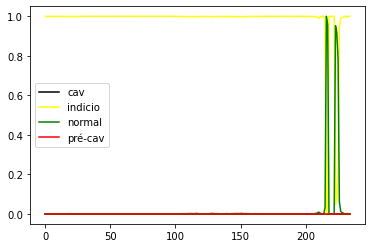

LSTM_2_ 64


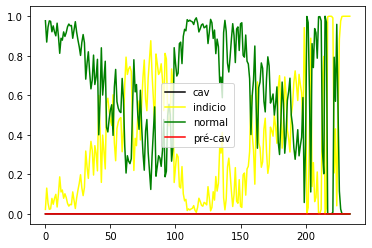

LSTM_2_ 65


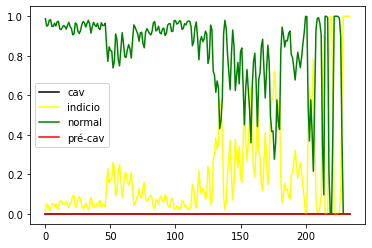

LSTM_2_ 66


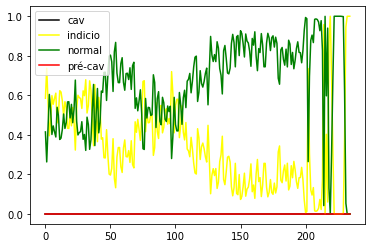

LSTM_2_ 67


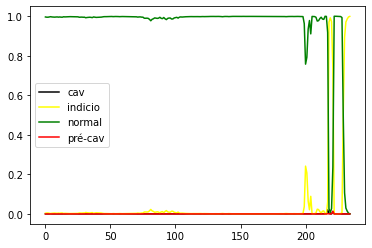

LSTM_2_ 68


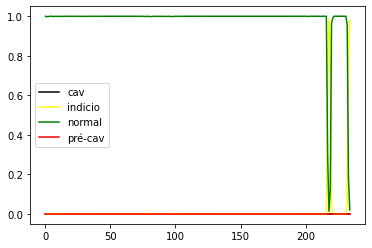

LSTM_2_ 69


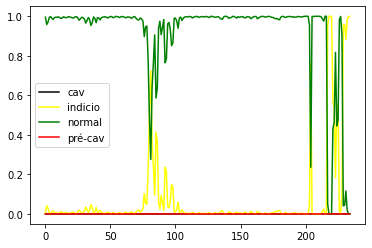

LSTM_2_ 70


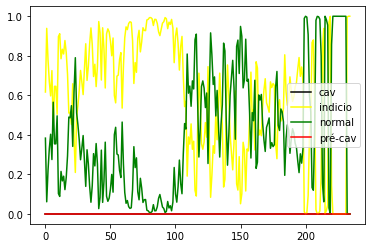

LSTM_2_ 71


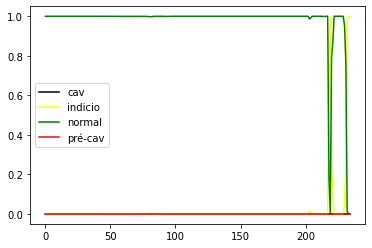

LSTM_2_ 72


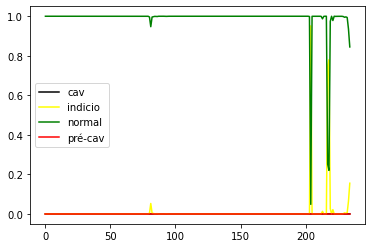

LSTM_2_ 73


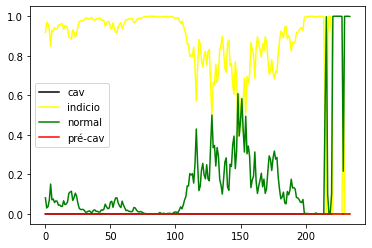

LSTM_2_ 74


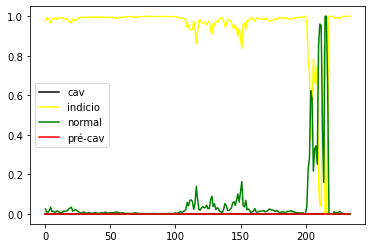

LSTM_2_ 75


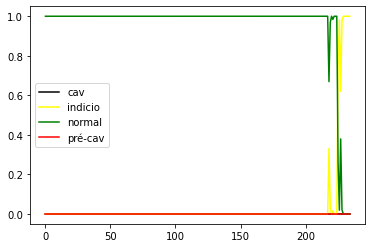

LSTM_2_ 76


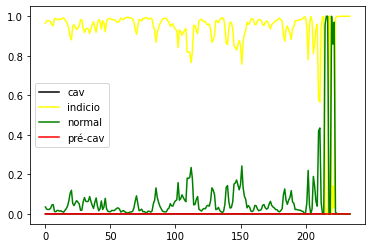

LSTM_2_ 77


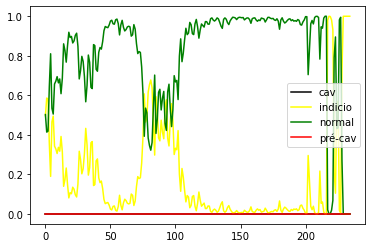

LSTM_2_ 78


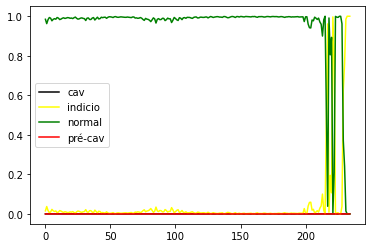

LSTM_2_ 79


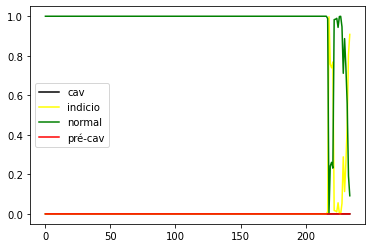

LSTM_2_ 80


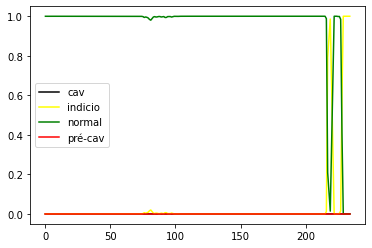

LSTM_2_ 81


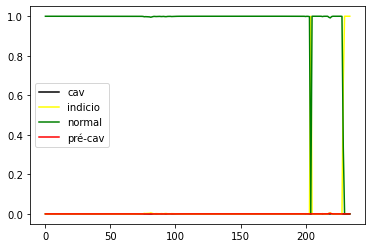

LSTM_2_ 82


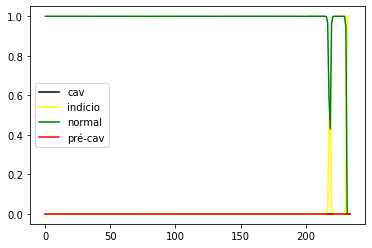

LSTM_2_ 83


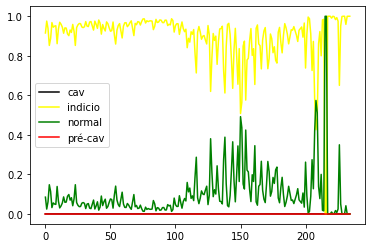

LSTM_2_ 84


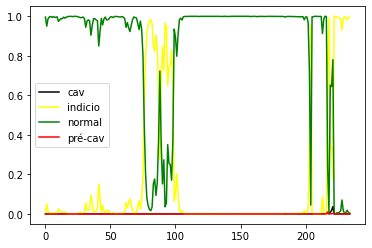

LSTM_2_ 85


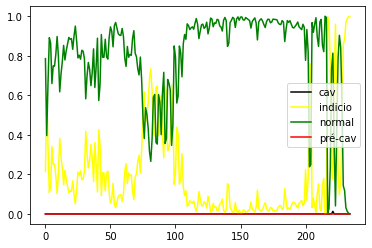

LSTM_2_ 86


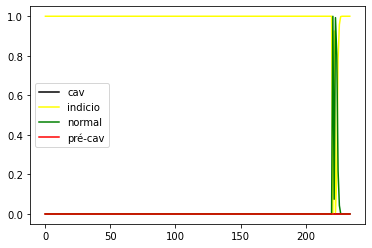

LSTM_2_ 87


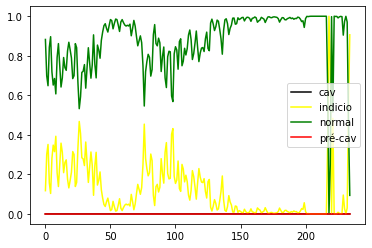

LSTM_2_ 88


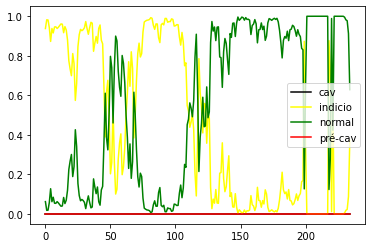

LSTM_2_ 89


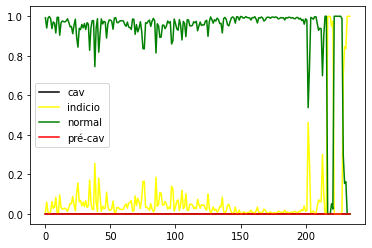

LSTM_2_ 90


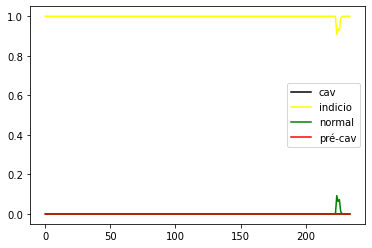

LSTM_2_ 91


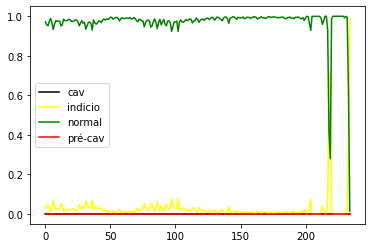

LSTM_2_ 92


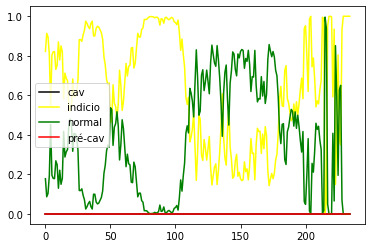

LSTM_2_ 93


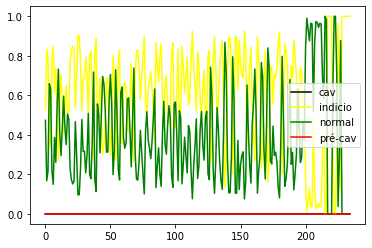

LSTM_2_ 94


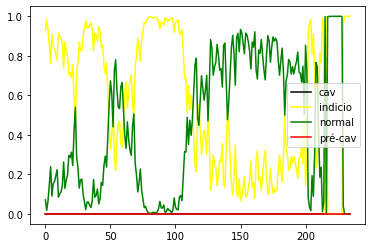

LSTM_2_ 95


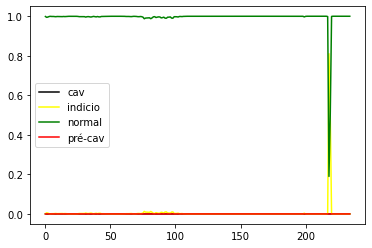

LSTM_2_ 96


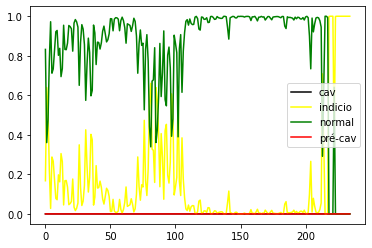

LSTM_2_ 97


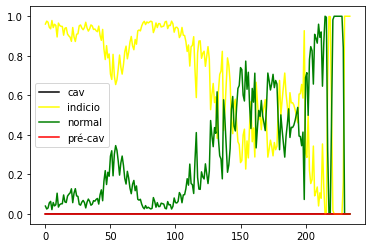

LSTM_2_ 98


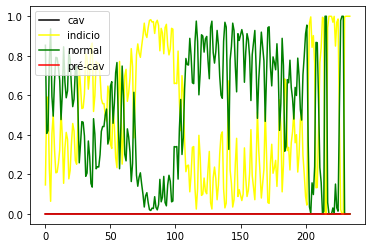

LSTM_2_ 99


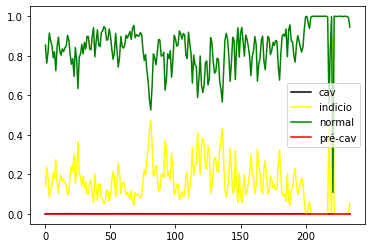

CNN_ 0


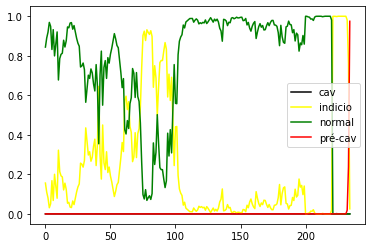

CNN_ 1


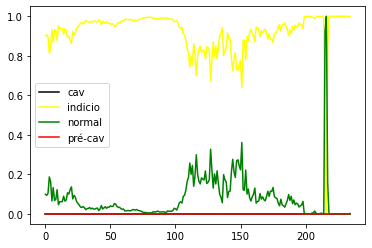

CNN_ 2


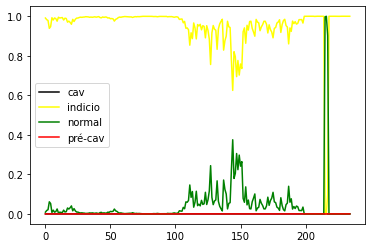

CNN_ 3


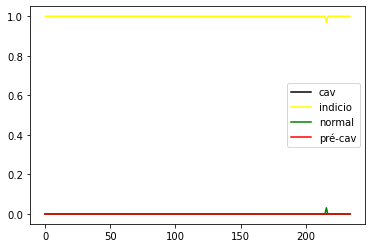

CNN_ 4


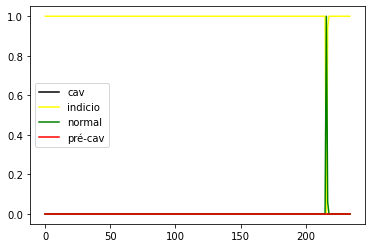

CNN_ 5


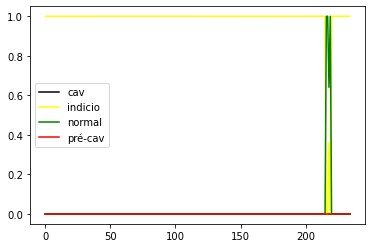

CNN_ 6


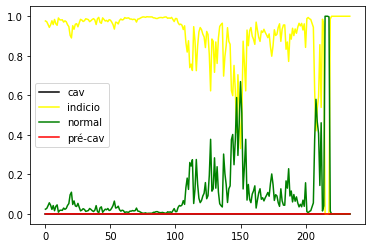

CNN_ 7


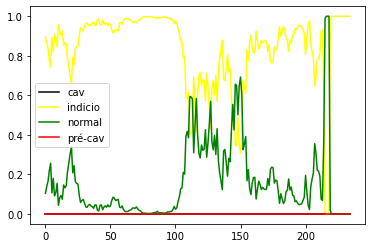

CNN_ 8


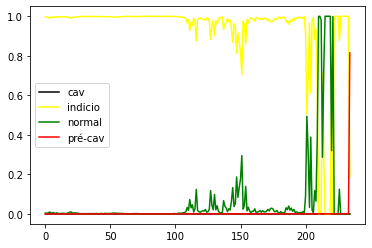

CNN_ 9


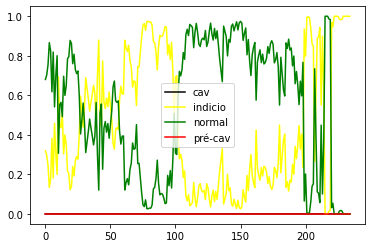

CNN_ 10


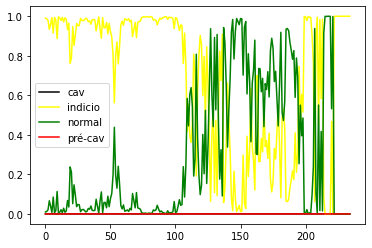

CNN_ 11


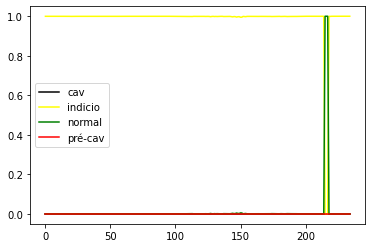

CNN_ 12


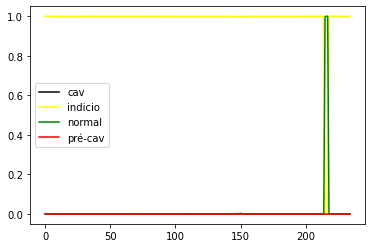

CNN_ 13


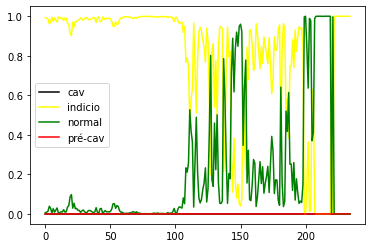

CNN_ 14


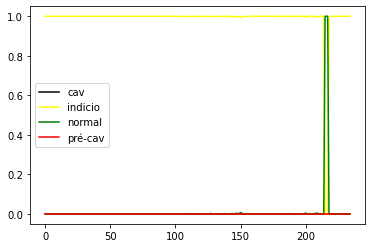

CNN_ 15


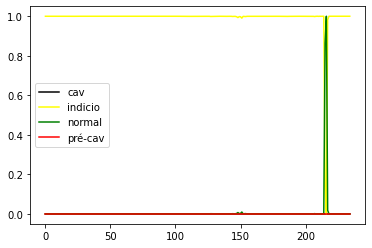

CNN_ 16


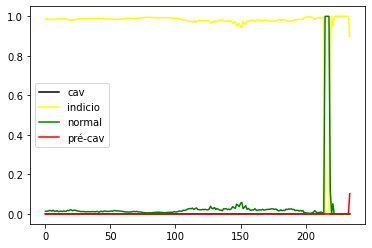

CNN_ 17


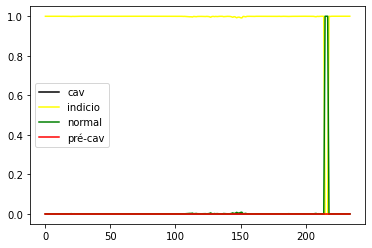

CNN_ 18


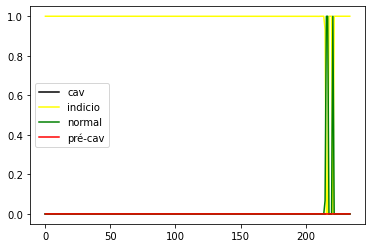

CNN_ 19


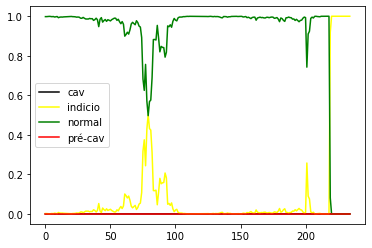

CNN_ 20


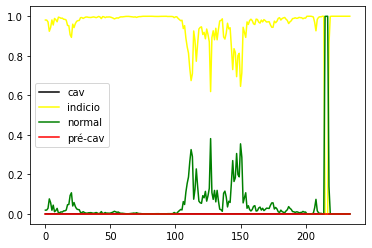

CNN_ 21


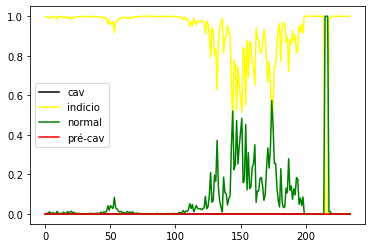

CNN_ 22


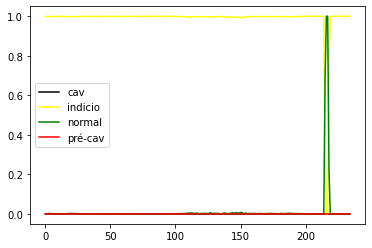

CNN_ 23


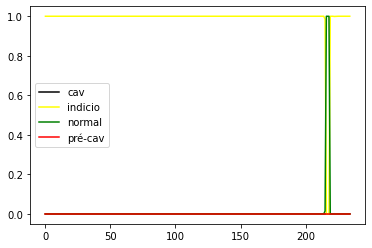

CNN_ 24


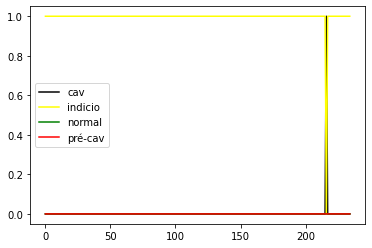

CNN_ 25


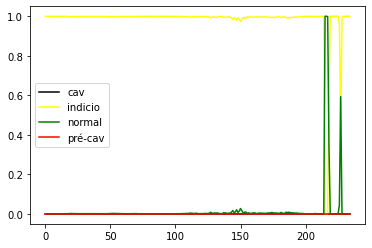

CNN_ 26


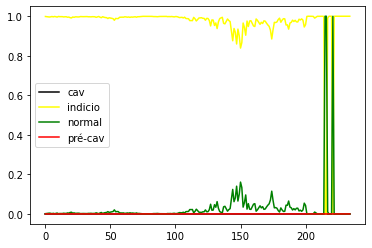

CNN_ 27


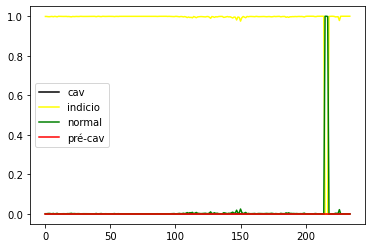

CNN_ 28


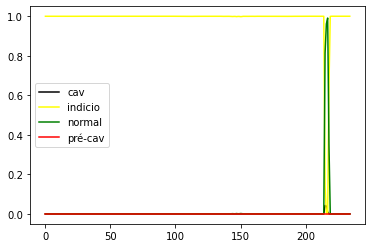

CNN_ 29


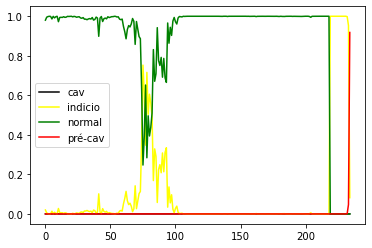

CNN_ 30


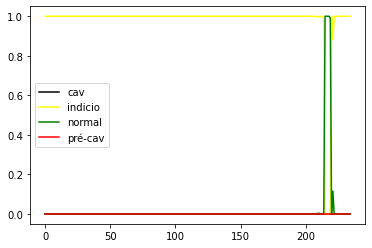

CNN_ 31


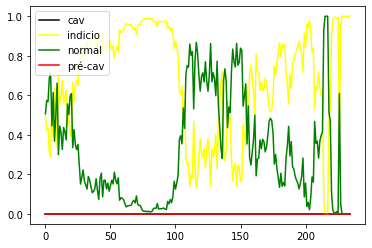

CNN_ 32


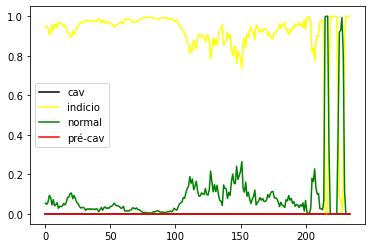

CNN_ 33


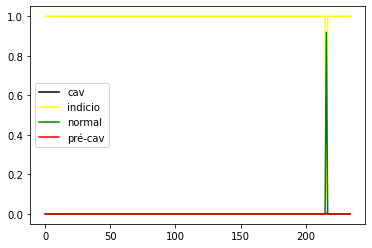

CNN_ 34


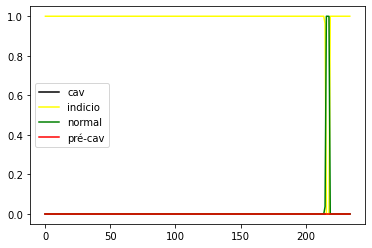

CNN_ 35


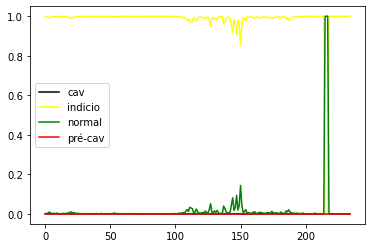

CNN_ 36


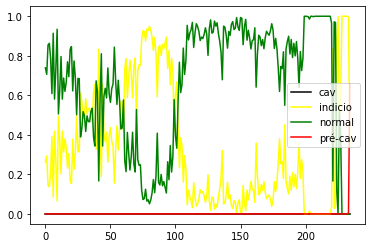

CNN_ 37


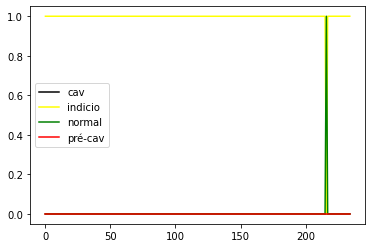

CNN_ 38


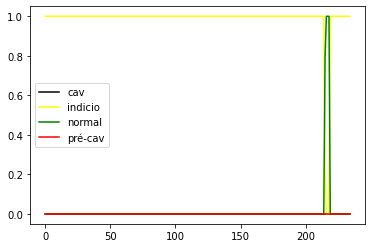

CNN_ 39


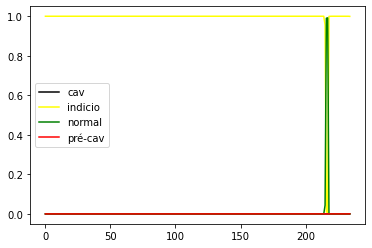

CNN_ 40


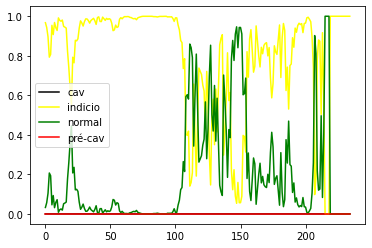

CNN_ 41


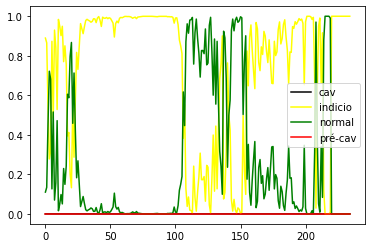

CNN_ 42


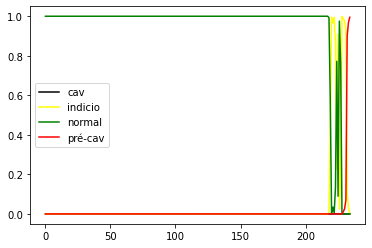

CNN_ 43


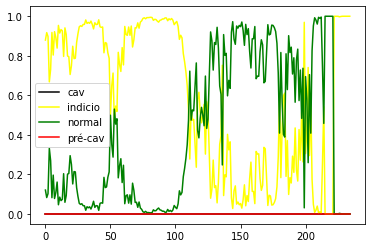

CNN_ 44


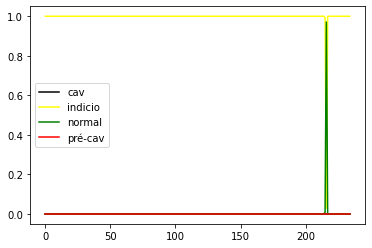

CNN_ 45


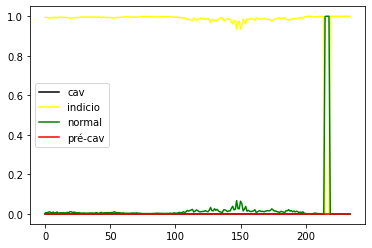

CNN_ 46


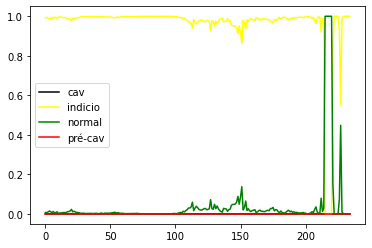

CNN_ 47


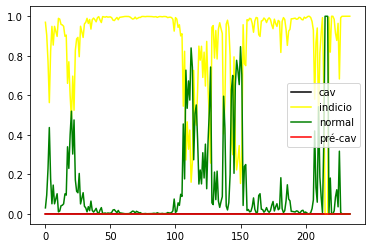

CNN_ 48


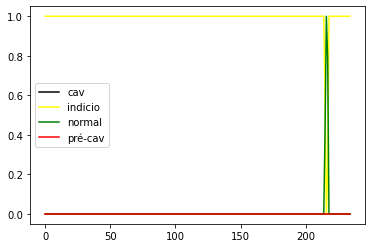

CNN_ 49


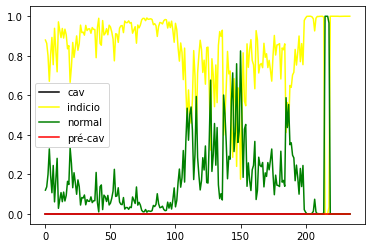

CNN_ 50


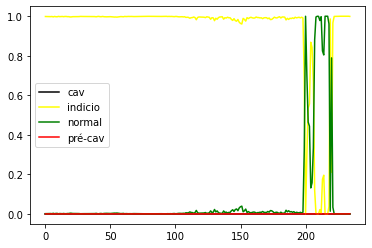

CNN_ 51


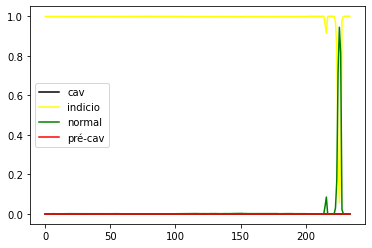

CNN_ 52


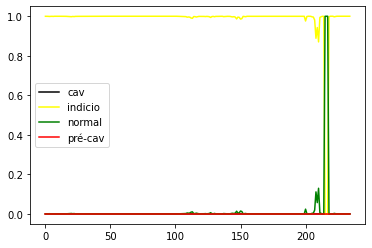

CNN_ 53


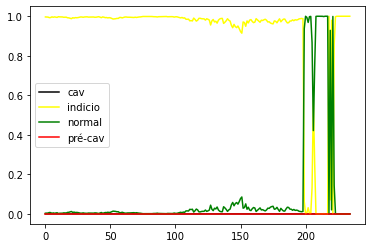

CNN_ 54


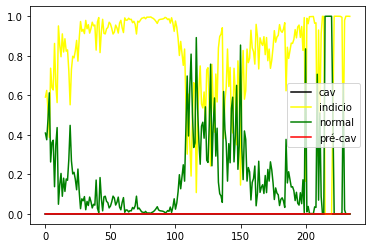

CNN_ 55


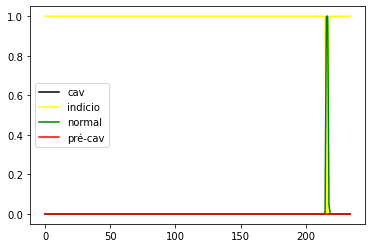

CNN_ 56


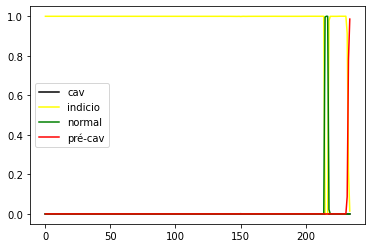

CNN_ 57


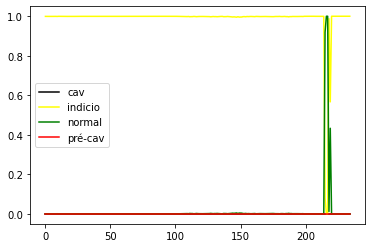

CNN_ 58


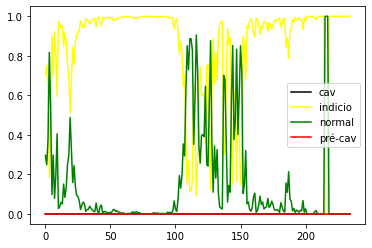

CNN_ 59


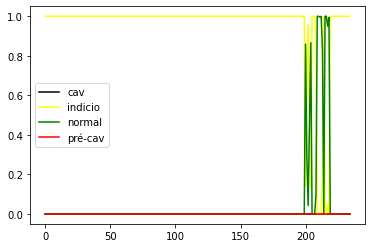

CNN_ 60


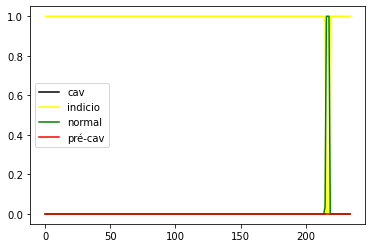

CNN_ 61


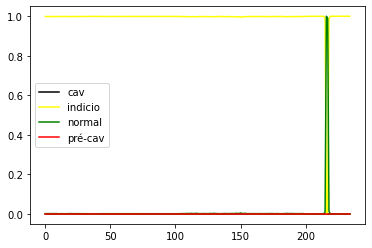

CNN_ 62


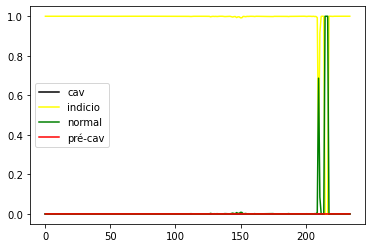

CNN_ 63


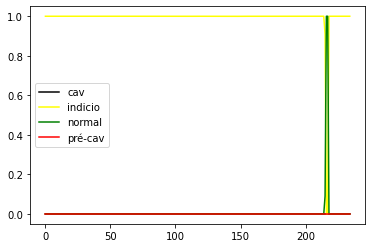

CNN_ 64


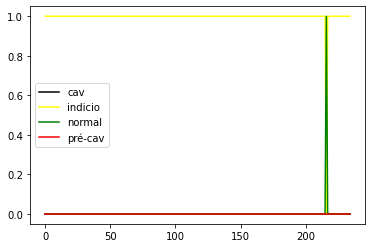

CNN_ 65


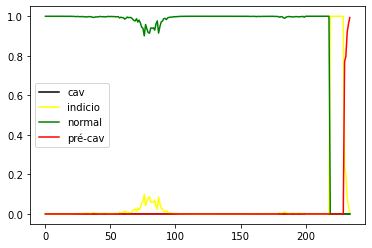

CNN_ 66


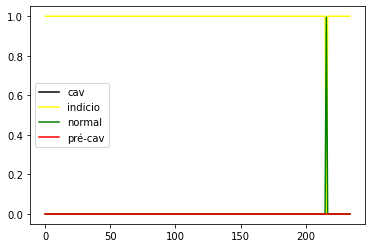

CNN_ 67


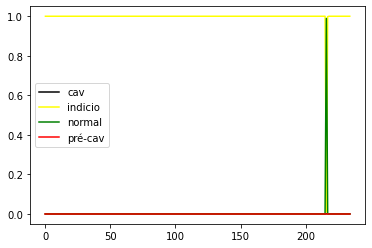

CNN_ 68


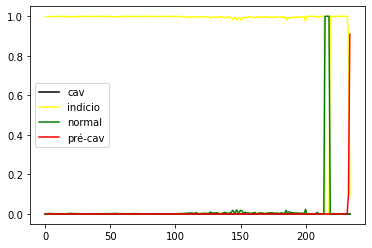

CNN_ 69


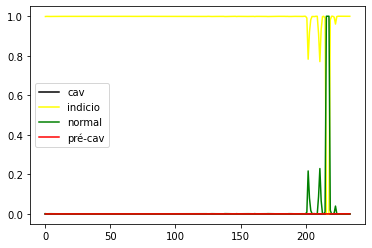

CNN_ 70


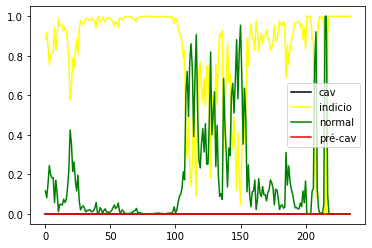

CNN_ 71


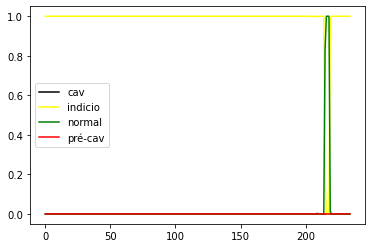

CNN_ 72


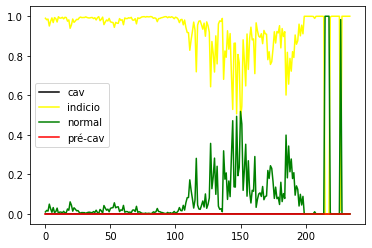

CNN_ 73


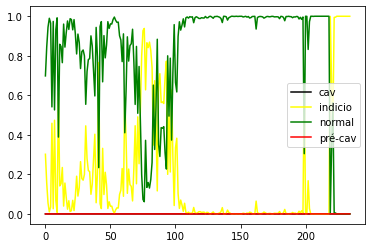

CNN_ 74


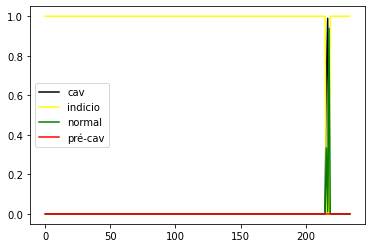

CNN_ 75


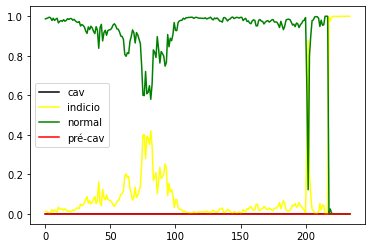

CNN_ 76


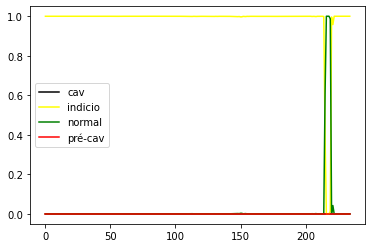

CNN_ 77


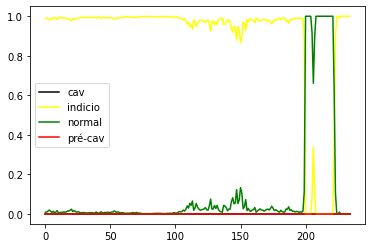

CNN_ 78


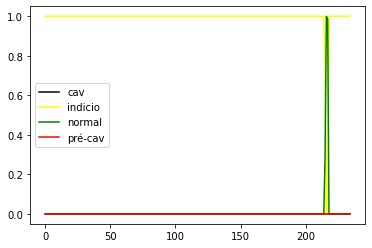

CNN_ 79


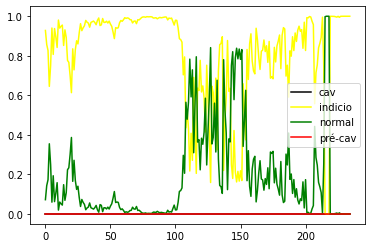

CNN_ 80


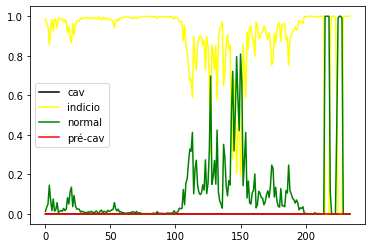

CNN_ 81


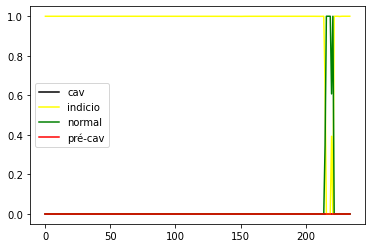

CNN_ 82


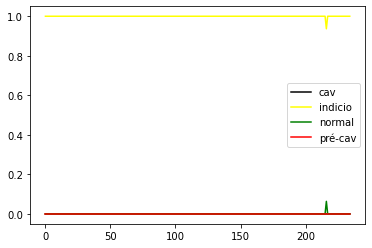

CNN_ 83


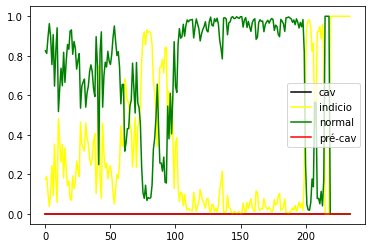

CNN_ 84


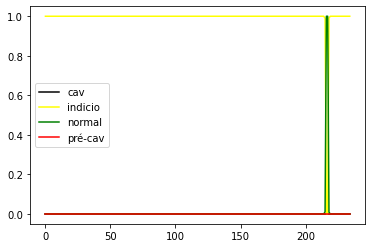

CNN_ 85


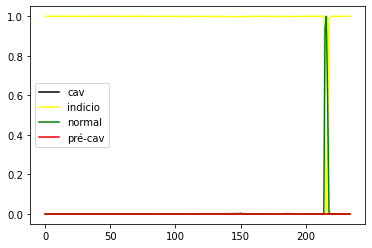

CNN_ 86


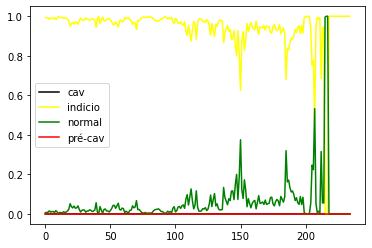

CNN_ 87


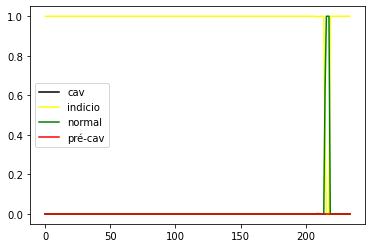

CNN_ 88


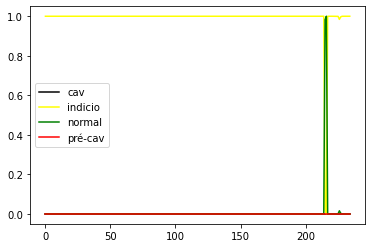

CNN_ 89


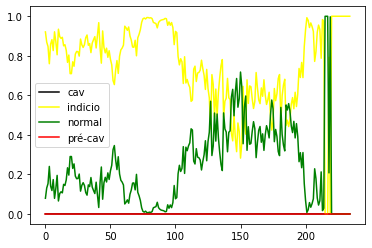

CNN_ 90


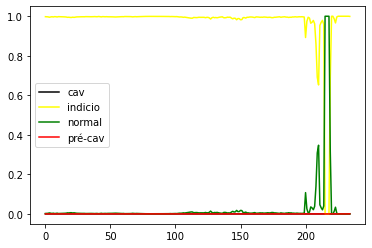

CNN_ 91


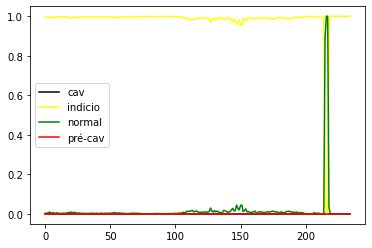

CNN_ 92


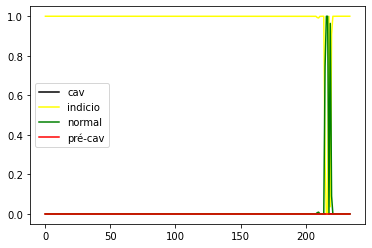

CNN_ 93


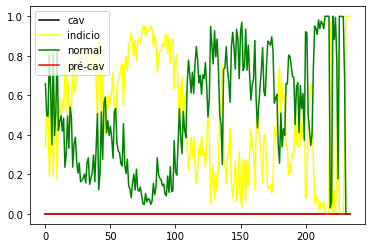

CNN_ 94


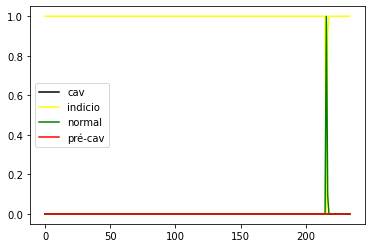

CNN_ 95


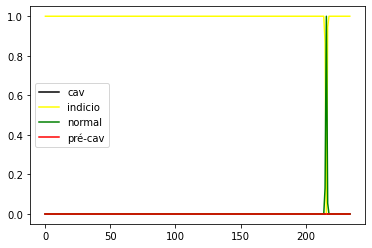

CNN_ 96


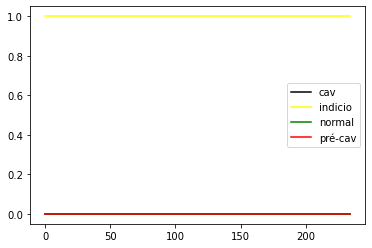

CNN_ 97


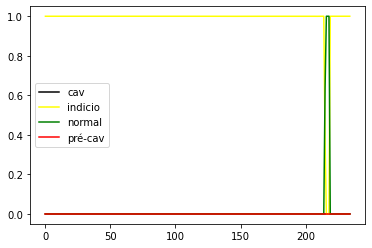

CNN_ 98


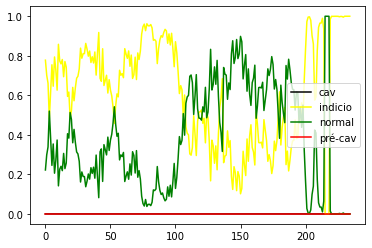

CNN_ 99


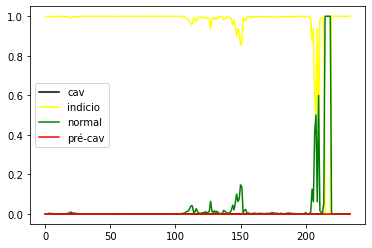

In [31]:
lstm_list = range(0,n_training)
lstm_2_list = range(0,n_training)
cnn_list = range(0,n_training)

start = 1200

yhat_out = []

for i in lstm_list:
  print("LSTM_",i)
  yhat = models_lstm[i].predict(test_full_series)
  yhat_out.append(yhat)
  pyplot.plot(yhat[start:,0],label="cav",color='black')
  pyplot.plot(yhat[start:,1],label="indicio",color='yellow')
  pyplot.plot(yhat[start:,2],label="normal",color='green')
  pyplot.plot(yhat[start:,3],label="pré-cav",color='red')
  pyplot.legend()
  pyplot.show()

for i in lstm_2_list:
  print("LSTM_2_",i)
  yhat = models_lstm_2[i].predict(test_full_series)
  yhat_out.append(yhat)
  pyplot.plot(yhat[start:,0],label="cav",color='black')
  pyplot.plot(yhat[start:,1],label="indicio",color='yellow')
  pyplot.plot(yhat[start:,2],label="normal",color='green')
  pyplot.plot(yhat[start:,3],label="pré-cav",color='red')
  pyplot.legend()
  pyplot.show()

for i in cnn_list:
  print("CNN_",i)
  yhat = models_cnn[i].predict(test_full_series)
  yhat_out.append(yhat)
  pyplot.plot(yhat[start:,0],label="cav",color='black')
  pyplot.plot(yhat[start:,1],label="indicio",color='yellow')
  pyplot.plot(yhat[start:,2],label="normal",color='green')
  pyplot.plot(yhat[start:,3],label="pré-cav",color='red')
  pyplot.legend()
  pyplot.show()

In [32]:
preds_lstm_conv = []
preds_lstm_2_conv = []
preds_cnn_conv = []

for i in range(0,n_training):
  b = np.zeros_like(preds_lstm[i])
  b[np.arange(len(preds_lstm[i])), preds_lstm[i].argmax(1)] = 1
  preds_lstm_conv.append(b)

  b = np.zeros_like(preds_lstm_2[i])
  b[np.arange(len(preds_lstm_2[i])), preds_lstm_2[i].argmax(1)] = 1
  preds_lstm_2_conv.append(b)

  b = np.zeros_like(preds_cnn[i])
  b[np.arange(len(preds_cnn[i])), preds_cnn[i].argmax(1)] = 1
  preds_cnn_conv.append(b)

In [33]:
preds_lstm_ensemble = []
preds_lstm_2_ensemble = []
preds_cnn_ensemble = []

for i in range(0,len(preds_lstm_conv[0])):
    
    temp_lstm = np.array((0,0,0,0))
    temp_lstm_2 = np.array((0,0,0,0))
    temp_cnn = np.array((0,0,0,0))
    
    for j in range(0,len(preds_lstm_conv)):
        
        vote_lstm = np.argmax(preds_lstm_conv[j][i])
        vote_lstm_2 = np.argmax(preds_lstm_2_conv[j][i])
        vote_cnn = np.argmax(preds_cnn_conv[j][i])
        
        temp_lstm[vote_lstm] = temp_lstm[vote_lstm] + 1
        temp_lstm_2[vote_lstm_2] = temp_lstm_2[vote_lstm_2] + 1
        temp_cnn[vote_cnn] = temp_cnn[vote_cnn] + 1
        
    preds_lstm_ensemble.append(temp_lstm)
    preds_lstm_2_ensemble.append(temp_lstm_2)
    preds_cnn_ensemble.append(temp_cnn)

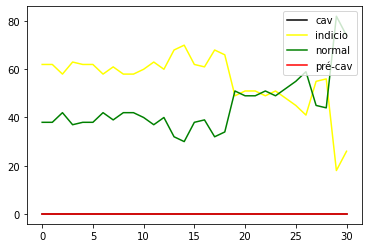

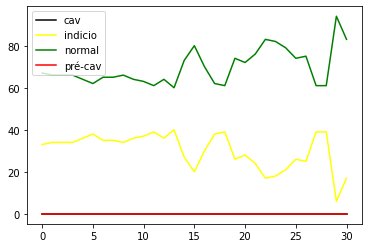

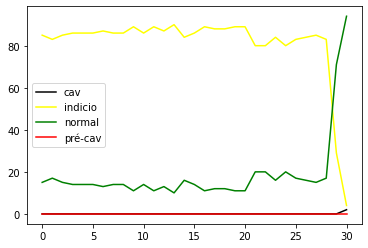

In [34]:
  pyplot.plot(np.array(preds_lstm_ensemble)[:,0],label="cav",color='black')
  pyplot.plot(np.array(preds_lstm_ensemble)[:,1],label="indicio",color='yellow')
  pyplot.plot(np.array(preds_lstm_ensemble)[:,2],label="normal",color='green')
  pyplot.plot(np.array(preds_lstm_ensemble)[:,3],label="pré-cav",color='red')
  pyplot.legend()
  pyplot.show()

  pyplot.plot(np.array(preds_lstm_2_ensemble)[:,0],label="cav",color='black')
  pyplot.plot(np.array(preds_lstm_2_ensemble)[:,1],label="indicio",color='yellow')
  pyplot.plot(np.array(preds_lstm_2_ensemble)[:,2],label="normal",color='green')
  pyplot.plot(np.array(preds_lstm_2_ensemble)[:,3],label="pré-cav",color='red')
  pyplot.legend()
  pyplot.show()

  pyplot.plot(np.array(preds_cnn_ensemble)[:,0],label="cav",color='black')
  pyplot.plot(np.array(preds_cnn_ensemble)[:,1],label="indicio",color='yellow')
  pyplot.plot(np.array(preds_cnn_ensemble)[:,2],label="normal",color='green')
  pyplot.plot(np.array(preds_cnn_ensemble)[:,3],label="pré-cav",color='red')
  pyplot.legend()
  pyplot.show()

In [35]:
from sklearn.metrics import confusion_matrix,classification_report,f1_score,cohen_kappa_score

In [36]:
lstm_f1 = []
lstm_kappa = []
for i in range(0,n_training):
    f1 = f1_score(labels_teste,label_encoder.inverse_transform(enc.inverse_transform(preds_lstm_conv[i])),average='weighted')
    kappa = cohen_kappa_score(labels_teste,label_encoder.inverse_transform(enc.inverse_transform(preds_lstm_conv[i])))
    print("LSTM_",i)
    #print(confusion_matrix(labels_teste,label_encoder.inverse_transform(enc.inverse_transform(preds_lstm_conv[i]))))
    print("weighted f1-score: ",f1)
    print("kappa score: ",kappa)
    lstm_f1.append(f1)
    lstm_kappa.append(kappa)

LSTM_ 0
weighted f1-score:  0.24780058651026396
kappa score:  0.0
LSTM_ 1
weighted f1-score:  0.3299120234604106
kappa score:  0.008000000000000007
LSTM_ 2
weighted f1-score:  0.6303605313092978
kappa score:  0.4237918215613383
LSTM_ 3
weighted f1-score:  0.3225806451612903
kappa score:  0.004016064257028273
LSTM_ 4
weighted f1-score:  0.14231499051233398
kappa score:  -0.55
LSTM_ 5
weighted f1-score:  0.6744239631336406
kappa score:  0.4833333333333333
LSTM_ 6
weighted f1-score:  0.5307623898455817
kappa score:  0.212890625
LSTM_ 7
weighted f1-score:  0.3155680224403927
kappa score:  0.0
LSTM_ 8
weighted f1-score:  0.24780058651026396
kappa score:  0.0
LSTM_ 9
weighted f1-score:  0.24193548387096775
kappa score:  -0.28149606299212593
LSTM_ 10
weighted f1-score:  0.3299120234604106
kappa score:  0.008000000000000007
LSTM_ 11
weighted f1-score:  0.3155680224403927
kappa score:  0.0
LSTM_ 12
weighted f1-score:  0.24780058651026396
kappa score:  0.0
LSTM_ 13
weighted f1-score:  0.24780058

In [37]:
lstm_2_f1 = []
lstm_2_kappa = []
for i in range(0,n_training):
    f1 = f1_score(labels_teste,label_encoder.inverse_transform(enc.inverse_transform(preds_lstm_2_conv[i])),average='weighted')
    kappa = kappa
    print("LSTM_2_",i)
    #print(confusion_matrix(labels_teste,label_encoder.inverse_transform(enc.inverse_transform(preds_lstm_2_conv[i]))))
    print("weighted f1-score: ",f1)
    print("kappa score: ",kappa)
    
    lstm_2_f1.append(f1)
    lstm_2_kappa.append(kappa)

LSTM_2_ 0
weighted f1-score:  0.24780058651026396
kappa score:  0.0
LSTM_2_ 1
weighted f1-score:  0.3155680224403927
kappa score:  0.0
LSTM_2_ 2
weighted f1-score:  0.2292020373514431
kappa score:  0.0
LSTM_2_ 3
weighted f1-score:  0.14231499051233398
kappa score:  0.0
LSTM_2_ 4
weighted f1-score:  0.24780058651026396
kappa score:  0.0
LSTM_2_ 5
weighted f1-score:  0.2292020373514431
kappa score:  0.0
LSTM_2_ 6
weighted f1-score:  0.4272226593233675
kappa score:  0.0
LSTM_2_ 7
weighted f1-score:  0.1382488479262673
kappa score:  0.0
LSTM_2_ 8
weighted f1-score:  0.3225806451612903
kappa score:  0.0
LSTM_2_ 9
weighted f1-score:  0.24780058651026396
kappa score:  0.0
LSTM_2_ 10
weighted f1-score:  0.24780058651026396
kappa score:  0.0
LSTM_2_ 11
weighted f1-score:  0.24780058651026396
kappa score:  0.0
LSTM_2_ 12
weighted f1-score:  0.24357825567502991
kappa score:  0.0
LSTM_2_ 13
weighted f1-score:  0.2832415420928403
kappa score:  0.0
LSTM_2_ 14
weighted f1-score:  0.24780058651026396


In [38]:
cnn_f1 = []
cnn_kappa = []
for i in range(0,n_training):
    f1 = f1_score(labels_teste,label_encoder.inverse_transform(enc.inverse_transform(preds_cnn_conv[i])),average='weighted')
    kappa = cohen_kappa_score(labels_teste,label_encoder.inverse_transform(enc.inverse_transform(preds_cnn_conv[i])))
    print("CNN_",i)
    #print(confusion_matrix(labels_teste,label_encoder.inverse_transform(enc.inverse_transform(preds_cnn_conv[i]))))
    print("weighted f1-score: ",f1)
    print("kappa score: ",kappa)
    
    cnn_f1.append(f1)
    cnn_kappa.append(kappa)

CNN_ 0
weighted f1-score:  0.24780058651026396
kappa score:  0.0
CNN_ 1
weighted f1-score:  0.3299120234604106
kappa score:  0.008000000000000007
CNN_ 2
weighted f1-score:  0.3299120234604106
kappa score:  0.008000000000000007
CNN_ 3
weighted f1-score:  0.3155680224403927
kappa score:  0.0
CNN_ 4
weighted f1-score:  0.3225806451612903
kappa score:  0.004016064257028273
CNN_ 5
weighted f1-score:  0.3225806451612903
kappa score:  0.004016064257028273
CNN_ 6
weighted f1-score:  0.31507876969242316
kappa score:  -0.04980079681274918
CNN_ 7
weighted f1-score:  0.3299120234604106
kappa score:  0.008000000000000007
CNN_ 8
weighted f1-score:  0.2903225806451613
kappa score:  -0.15944881889763773
CNN_ 9
weighted f1-score:  0.8275862068965517
kappa score:  0.7651515151515151
CNN_ 10
weighted f1-score:  0.7053664337743422
kappa score:  0.5285171102661597
CNN_ 11
weighted f1-score:  0.3299120234604106
kappa score:  0.008000000000000007
CNN_ 12
weighted f1-score:  0.3299120234604106
kappa score:  0

Gerando as estatísticas para cada um dos experimentos

In [39]:
f1_stats = pd.DataFrame(data = [lstm_f1,lstm_2_f1,cnn_f1]).T
f1_stats.columns = ['LSTM','LSTM_2','CNN']

In [40]:
f1_stats.describe()

,LSTM,LSTM_2,CNN
count,100.000000,100.000000,100.000000
mean,0.319229,0.282353,0.331152
std,0.130550,0.105625,0.108398
min,0.064516,0.031217,0.033370
25%,0.247801,0.247801,0.315568
50%,0.314047,0.247801,0.326246
75%,0.329912,0.318040,0.329912
max,0.702609,0.699149,0.827586


<AxesSubplot:>

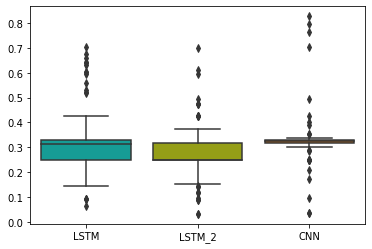

In [41]:
sns.boxplot(data=f1_stats)

In [42]:
kappa_stats = pd.DataFrame(data = [lstm_kappa,lstm_2_kappa,cnn_kappa]).T
kappa_stats.columns = ['LSTM','LSTM_2','CNN']

In [43]:
kappa_stats.describe()

,LSTM,LSTM_2,CNN
count,100.000000,100.0,100.000000
mean,-0.039725,0.0,-0.001065
std,0.248611,0.0,0.198614
min,-0.702652,0.0,-0.754717
25%,-0.112665,0.0,0.003012
50%,0.000000,0.0,0.008000
75%,0.008000,0.0,0.008000
max,0.537313,0.0,0.765152


<AxesSubplot:>

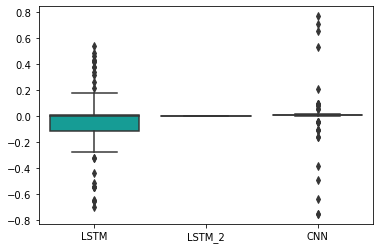

In [44]:
sns.boxplot(data=kappa_stats)